In [81]:
# https://stable-baselines3.readthedocs.io/en/master/guide/rl.html
# https://spinningup.openai.com/en/latest/spinningup/rl_intro2.html#a-taxonomy-of-rl-algorithms

# 1. Import dependencies

In [82]:
import torch as torch
torch._C._cuda_getDeviceCount() > 0

True

In [83]:
import os
import gym 
from stable_baselines3 import DQN
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.evaluation import evaluate_policy

# 2. Load and Test Environment

In [84]:
#environment_name = "Pong-v0"
#rewards = [[1,0,5], [1,10,4], [1,4,6]]
#rewards = [[1,0,8], [1,10,3]]
#rewards = [[1,7,5],[1,0,4]]
rewards = [[1,0,5]]

In [85]:
#env = gym.make(environment_name)
from GridEnv import WindyGridworld
env = WindyGridworld(
        height=20,
        width=11,
        rewards=rewards,
        wind=True,
        allowed_actions=['L', 'R', 'C'],
        reward_terminates_episode=False
    )

In [86]:
episodes = 5
for episode in range(1, episodes+1):
    state = env.reset()
    done = False
    score = 0 
    
    while not done:
        env.render()
        action = env.action_space.sample()
        n_state, reward, done, info = env.step(action)
        score+=reward
    print('Episode:{} Score:{}'.format(episode, score))
env.close()

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to tar

Episode:1 Score:0
Episode:2 Score:0
Episode:3 Score:0
Episode:4 Score:0
Episode:5 Score:0


# 3. Train an RL Model

In [87]:
from Net_Qtable import Network_Qtable


In [88]:
from stable_baselines3.common.evaluation import evaluate_policy

In [89]:
from stable_baselines3.common.callbacks import EvalCallback, StopTrainingOnRewardThreshold

In [90]:
save_path = os.path.join('Training', 'Saved Models')
log_path = os.path.join('Training', 'Logs Bias Only', 'Env1')

In [91]:
from GridEnv import WindyGridworld
env = env = WindyGridworld(
        height=20,
        width=11,
        rewards=rewards,
        wind=True,
        allowed_actions=['L', 'R', 'C'],
        reward_terminates_episode=False
    )

print(env.rewards)


[[1, 0, 5]]


In [92]:
stop_callback = StopTrainingOnRewardThreshold(reward_threshold=2, verbose=1)
eval_callback = EvalCallback(env, 
                             callback_on_new_best=stop_callback, 
                             eval_freq=10000, 
                             best_model_save_path=save_path, 
                             verbose=1)

In [93]:
# try 0.2 exploration period
model = DQN('CnnPolicy', env, exploration_fraction=0.8,
  exploration_final_eps=0.1,learning_starts=100000, verbose = 1, buffer_size = 50000,target_update_interval=1000, tensorboard_log=log_path)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


In [94]:
env_dummy = WindyGridworld(
        height=20,
        width=11,
        rewards=rewards,
        wind=True,
        allowed_actions=['L', 'R', 'C'],
        reward_terminates_episode=False
    )


img_init = Network_Qtable(model,env)

In [95]:
model.learn(total_timesteps=1000000,callback=eval_callback, tb_log_name='Env1_Baseline_0.8exp_1M')

Logging to Training/Logs Bias Only/Env1/Env1_Baseline_0.8exp_1M_5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 2742     |
|    time_elapsed     | 0        |
|    total_timesteps  | 70       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 8        |
|    fps              | 2879     |
|    time_elapsed     | 0        |
|    total_timesteps  | 137      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 

/usr/local/lib/python3.9/site-packages/stable_baselines3/common/callbacks.py:345: UserWarning: Training and eval env are not of the same type<stable_baselines3.common.vec_env.vec_transpose.VecTransposeImage object at 0x7faeb2fb46d0> != <stable_baselines3.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7faeb3015ac0>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 40       |
|    fps              | 2982     |
|    time_elapsed     | 0        |
|    total_timesteps  | 628      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.0909   |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 44       |
|    fps              | 2977     |
|    time_elapsed     | 0        |
|    total_timesteps  | 675      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.0833   |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 128      |
|    fps              | 2996     |
|    time_elapsed     | 0        |
|    total_timesteps  | 1838     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 132      |
|    fps              | 3010     |
|    time_elapsed     | 0        |
|    total_timesteps  | 1918     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes         | 216      |
|    fps              | 3100     |
|    time_elapsed     | 1        |
|    total_timesteps  | 3167     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes         | 220      |
|    fps              | 3102     |
|    time_elapsed     | 1        |
|    total_timesteps  | 3217     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 304      |
|    fps              | 3152     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4409     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 308      |
|    fps              | 3156     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4489     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 392      |
|    fps              | 3165     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5657     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 396      |
|    fps              | 3168     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5724     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.993    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 480      |
|    fps              | 3195     |
|    time_elapsed     | 2        |
|    total_timesteps  | 6981     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 484      |
|    fps              | 3196     |
|    time_elapsed     | 2        |
|    total_timesteps  | 7060     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes         | 568      |
|    fps              | 3214     |
|    time_elapsed     | 2        |
|    total_timesteps  | 8370     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.99     |
| time/               |          |
|    episodes         | 572      |
|    fps              | 3216     |
|    time_elapsed     | 2        |
|    total_timesteps  | 8450     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.99     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes         | 656      |
|    fps              | 3225     |
|    time_elapsed     | 2        |
|    total_timesteps  | 9619     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes         | 660      |
|    fps              | 3225     |
|    time_elapsed     | 2        |
|    total_timesteps  | 9666     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 740      |
|    fps              | 3178     |
|    time_elapsed     | 3        |
|    total_timesteps  | 10785    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 744      |
|    fps              | 3179     |
|    time_elapsed     | 3        |
|    total_timesteps  | 10848    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes         | 828      |
|    fps              | 3190     |
|    time_elapsed     | 3        |
|    total_timesteps  | 12019    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes         | 832      |
|    fps              | 3191     |
|    time_elapsed     | 3        |
|    total_timesteps  | 12076    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 916      |
|    fps              | 3200     |
|    time_elapsed     | 4        |
|    total_timesteps  | 13276    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 920      |
|    fps              | 3201     |
|    time_elapsed     | 4        |
|    total_timesteps  | 13319    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 1004     |
|    fps              | 3206     |
|    time_elapsed     | 4        |
|    total_timesteps  | 14459    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 1008     |
|    fps              | 3207     |
|    time_elapsed     | 4        |
|    total_timesteps  | 14538    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes         | 1092     |
|    fps              | 3215     |
|    time_elapsed     | 4        |
|    total_timesteps  | 15804    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes         | 1096     |
|    fps              | 3216     |
|    time_elapsed     | 4        |
|    total_timesteps  | 15877    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 1180     |
|    fps              | 3224     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17172    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 1184     |
|    fps              | 3224     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17233    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes         | 1268     |
|    fps              | 3229     |
|    time_elapsed     | 5        |
|    total_timesteps  | 18498    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes         | 1272     |
|    fps              | 3230     |
|    time_elapsed     | 5        |
|    total_timesteps  | 18561    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes         | 1356     |
|    fps              | 3232     |
|    time_elapsed     | 6        |
|    total_timesteps  | 19719    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes         | 1360     |
|    fps              | 3233     |
|    time_elapsed     | 6        |
|    total_timesteps  | 19799    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes         | 1440     |
|    fps              | 3220     |
|    time_elapsed     | 6        |
|    total_timesteps  | 21007    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes         | 1444     |
|    fps              | 3221     |
|    time_elapsed     | 6        |
|    total_timesteps  | 21080    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes         | 1528     |
|    fps              | 3224     |
|    time_elapsed     | 6        |
|    total_timesteps  | 22260    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes         | 1532     |
|    fps              | 3224     |
|    time_elapsed     | 6        |
|    total_timesteps  | 22297    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes         | 1616     |
|    fps              | 3226     |
|    time_elapsed     | 7        |
|    total_timesteps  | 23435    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes         | 1620     |
|    fps              | 3226     |
|    time_elapsed     | 7        |
|    total_timesteps  | 23508    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.973    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes         | 1704     |
|    fps              | 3230     |
|    time_elapsed     | 7        |
|    total_timesteps  | 24783    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes         | 1708     |
|    fps              | 3230     |
|    time_elapsed     | 7        |
|    total_timesteps  | 24839    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes         | 1792     |
|    fps              | 3235     |
|    time_elapsed     | 8        |
|    total_timesteps  | 26040    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes         | 1796     |
|    fps              | 3235     |
|    time_elapsed     | 8        |
|    total_timesteps  | 26104    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1880     |
|    fps              | 3240     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27328    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1884     |
|    fps              | 3240     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27406    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 1968     |
|    fps              | 3218     |
|    time_elapsed     | 8        |
|    total_timesteps  | 28639    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 1972     |
|    fps              | 3218     |
|    time_elapsed     | 8        |
|    total_timesteps  | 28694    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes         | 2056     |
|    fps              | 3226     |
|    time_elapsed     | 9        |
|    total_timesteps  | 29919    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes         | 2060     |
|    fps              | 3226     |
|    time_elapsed     | 9        |
|    total_timesteps  | 29980    |
----------------------------------
Eval num_timesteps=30000, episode_reward=0.00 +/- 0.00
Episode length: 7.80 +/- 1.94
----------------------------------
| eval/               |          |
|    mean_ep_length   | 7.8      |
|    mean_reward      | 0        |
| rol

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes         | 2140     |
|    fps              | 3223     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31227    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes         | 2144     |
|    fps              | 3223     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31288    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2228     |
|    fps              | 3228     |
|    time_elapsed     | 10       |
|    total_timesteps  | 32462    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2232     |
|    fps              | 3229     |
|    time_elapsed     | 10       |
|    total_timesteps  | 32526    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 2316     |
|    fps              | 3234     |
|    time_elapsed     | 10       |
|    total_timesteps  | 33644    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 2320     |
|    fps              | 3234     |
|    time_elapsed     | 10       |
|    total_timesteps  | 33703    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.961    |
| time/               |          |
|    episodes         | 2404     |
|    fps              | 3239     |
|    time_elapsed     | 10       |
|    total_timesteps  | 34884    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.961    |
| time/               |          |
|    episodes         | 2408     |
|    fps              | 3239     |
|    time_elapsed     | 10       |
|    total_timesteps  | 34941    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.961    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2492     |
|    fps              | 3244     |
|    time_elapsed     | 11       |
|    total_timesteps  | 36252    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2496     |
|    fps              | 3244     |
|    time_elapsed     | 11       |
|    total_timesteps  | 36313    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.958    |
| time/               |          |
|    episodes         | 2580     |
|    fps              | 3247     |
|    time_elapsed     | 11       |
|    total_timesteps  | 37515    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.958    |
| time/               |          |
|    episodes         | 2584     |
|    fps              | 3248     |
|    time_elapsed     | 11       |
|    total_timesteps  | 37577    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.958    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes         | 2668     |
|    fps              | 3252     |
|    time_elapsed     | 11       |
|    total_timesteps  | 38874    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes         | 2672     |
|    fps              | 3252     |
|    time_elapsed     | 11       |
|    total_timesteps  | 38933    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.955    |
| time/               |          |
|    episodes         | 2756     |
|    fps              | 3253     |
|    time_elapsed     | 12       |
|    total_timesteps  | 39988    |
----------------------------------
Eval num_timesteps=40000, episode_reward=0.00 +/- 0.00
Episode length: 6.40 +/- 3.01
----------------------------------
| eval/               |          |
|    mean_ep_length   | 6.4      |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.955    |
| time/               |          |
|    total_timesteps  | 40000    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.955    |
| time/               |          |
|    

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes         | 2840     |
|    fps              | 3249     |
|    time_elapsed     | 12       |
|    total_timesteps  | 41151    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes         | 2844     |
|    fps              | 3249     |
|    time_elapsed     | 12       |
|    total_timesteps  | 41219    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes         | 2928     |
|    fps              | 3253     |
|    time_elapsed     | 13       |
|    total_timesteps  | 42518    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes         | 2932     |
|    fps              | 3254     |
|    time_elapsed     | 13       |
|    total_timesteps  | 42585    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes         | 3016     |
|    fps              | 3257     |
|    time_elapsed     | 13       |
|    total_timesteps  | 43825    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes         | 3020     |
|    fps              | 3257     |
|    time_elapsed     | 13       |
|    total_timesteps  | 43858    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes         | 3104     |
|    fps              | 3260     |
|    time_elapsed     | 13       |
|    total_timesteps  | 45101    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes         | 3108     |
|    fps              | 3260     |
|    time_elapsed     | 13       |
|    total_timesteps  | 45163    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes         | 3192     |
|    fps              | 3262     |
|    time_elapsed     | 14       |
|    total_timesteps  | 46369    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes         | 3196     |
|    fps              | 3263     |
|    time_elapsed     | 14       |
|    total_timesteps  | 46424    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3280     |
|    fps              | 3266     |
|    time_elapsed     | 14       |
|    total_timesteps  | 47753    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3284     |
|    fps              | 3266     |
|    time_elapsed     | 14       |
|    total_timesteps  | 47790    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes         | 3368     |
|    fps              | 3268     |
|    time_elapsed     | 14       |
|    total_timesteps  | 49017    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes         | 3372     |
|    fps              | 3269     |
|    time_elapsed     | 15       |
|    total_timesteps  | 49096    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes         | 3452     |
|    fps              | 3266     |
|    time_elapsed     | 15       |
|    total_timesteps  | 50297    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes         | 3456     |
|    fps              | 3266     |
|    time_elapsed     | 15       |
|    total_timesteps  | 50361    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes         | 3540     |
|    fps              | 3272     |
|    time_elapsed     | 15       |
|    total_timesteps  | 51666    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes         | 3544     |
|    fps              | 3272     |
|    time_elapsed     | 15       |
|    total_timesteps  | 51737    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes         | 3628     |
|    fps              | 3278     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53022    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes         | 3632     |
|    fps              | 3278     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53102    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes         | 3716     |
|    fps              | 3282     |
|    time_elapsed     | 16       |
|    total_timesteps  | 54257    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes         | 3720     |
|    fps              | 3282     |
|    time_elapsed     | 16       |
|    total_timesteps  | 54285    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes         | 3804     |
|    fps              | 3286     |
|    time_elapsed     | 16       |
|    total_timesteps  | 55494    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.937    |
| time/               |          |
|    episodes         | 3808     |
|    fps              | 3287     |
|    time_elapsed     | 16       |
|    total_timesteps  | 55574    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.937    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes         | 3892     |
|    fps              | 3290     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56784    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes         | 3896     |
|    fps              | 3290     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56850    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes         | 3980     |
|    fps              | 3294     |
|    time_elapsed     | 17       |
|    total_timesteps  | 58174    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes         | 3984     |
|    fps              | 3294     |
|    time_elapsed     | 17       |
|    total_timesteps  | 58237    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes         | 4068     |
|    fps              | 3298     |
|    time_elapsed     | 17       |
|    total_timesteps  | 59329    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes         | 4072     |
|    fps              | 3298     |
|    time_elapsed     | 18       |
|    total_timesteps  | 59382    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.932    |
| time/               |          |
|    episodes         | 4152     |
|    fps              | 3297     |
|    time_elapsed     | 18       |
|    total_timesteps  | 60545    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.932    |
| time/               |          |
|    episodes         | 4156     |
|    fps              | 3298     |
|    time_elapsed     | 18       |
|    total_timesteps  | 60615    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.932    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes         | 4240     |
|    fps              | 3302     |
|    time_elapsed     | 18       |
|    total_timesteps  | 61825    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes         | 4244     |
|    fps              | 3303     |
|    time_elapsed     | 18       |
|    total_timesteps  | 61891    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.929    |
| time/               |          |
|    episodes         | 4328     |
|    fps              | 3307     |
|    time_elapsed     | 19       |
|    total_timesteps  | 63127    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.929    |
| time/               |          |
|    episodes         | 4332     |
|    fps              | 3308     |
|    time_elapsed     | 19       |
|    total_timesteps  | 63204    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.929    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4416     |
|    fps              | 3313     |
|    time_elapsed     | 19       |
|    total_timesteps  | 64490    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4420     |
|    fps              | 3313     |
|    time_elapsed     | 19       |
|    total_timesteps  | 64552    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.926    |
| time/               |          |
|    episodes         | 4504     |
|    fps              | 3318     |
|    time_elapsed     | 19       |
|    total_timesteps  | 65886    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.926    |
| time/               |          |
|    episodes         | 4508     |
|    fps              | 3319     |
|    time_elapsed     | 19       |
|    total_timesteps  | 65935    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.926    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes         | 4592     |
|    fps              | 3321     |
|    time_elapsed     | 20       |
|    total_timesteps  | 67035    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes         | 4596     |
|    fps              | 3321     |
|    time_elapsed     | 20       |
|    total_timesteps  | 67087    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.923    |
| time/               |          |
|    episodes         | 4680     |
|    fps              | 3324     |
|    time_elapsed     | 20       |
|    total_timesteps  | 68334    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.923    |
| time/               |          |
|    episodes         | 4684     |
|    fps              | 3324     |
|    time_elapsed     | 20       |
|    total_timesteps  | 68400    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.923    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes         | 4768     |
|    fps              | 3327     |
|    time_elapsed     | 20       |
|    total_timesteps  | 69619    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes         | 4772     |
|    fps              | 3327     |
|    time_elapsed     | 20       |
|    total_timesteps  | 69666    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes         | 4852     |
|    fps              | 3326     |
|    time_elapsed     | 21       |
|    total_timesteps  | 70815    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes         | 4856     |
|    fps              | 3326     |
|    time_elapsed     | 21       |
|    total_timesteps  | 70879    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.919    |
| time/               |          |
|    episodes         | 4940     |
|    fps              | 3328     |
|    time_elapsed     | 21       |
|    total_timesteps  | 72116    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.919    |
| time/               |          |
|    episodes         | 4944     |
|    fps              | 3329     |
|    time_elapsed     | 21       |
|    total_timesteps  | 72195    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.919    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes         | 5028     |
|    fps              | 3331     |
|    time_elapsed     | 22       |
|    total_timesteps  | 73447    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes         | 5032     |
|    fps              | 3331     |
|    time_elapsed     | 22       |
|    total_timesteps  | 73475    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes         | 5116     |
|    fps              | 3334     |
|    time_elapsed     | 22       |
|    total_timesteps  | 74744    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes         | 5120     |
|    fps              | 3334     |
|    time_elapsed     | 22       |
|    total_timesteps  | 74787    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 5204     |
|    fps              | 3337     |
|    time_elapsed     | 22       |
|    total_timesteps  | 76034    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 5208     |
|    fps              | 3337     |
|    time_elapsed     | 22       |
|    total_timesteps  | 76104    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes         | 5292     |
|    fps              | 3339     |
|    time_elapsed     | 23       |
|    total_timesteps  | 77231    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes         | 5296     |
|    fps              | 3339     |
|    time_elapsed     | 23       |
|    total_timesteps  | 77286    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes         | 5380     |
|    fps              | 3342     |
|    time_elapsed     | 23       |
|    total_timesteps  | 78431    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes         | 5384     |
|    fps              | 3342     |
|    time_elapsed     | 23       |
|    total_timesteps  | 78486    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 5468     |
|    fps              | 3346     |
|    time_elapsed     | 23       |
|    total_timesteps  | 79760    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 5472     |
|    fps              | 3346     |
|    time_elapsed     | 23       |
|    total_timesteps  | 79790    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes         | 5552     |
|    fps              | 3345     |
|    time_elapsed     | 24       |
|    total_timesteps  | 80859    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes         | 5556     |
|    fps              | 3345     |
|    time_elapsed     | 24       |
|    total_timesteps  | 80926    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 5640     |
|    fps              | 3348     |
|    time_elapsed     | 24       |
|    total_timesteps  | 82180    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 5644     |
|    fps              | 3349     |
|    time_elapsed     | 24       |
|    total_timesteps  | 82257    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.906    |
| time/               |          |
|    episodes         | 5728     |
|    fps              | 3351     |
|    time_elapsed     | 24       |
|    total_timesteps  | 83443    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.906    |
| time/               |          |
|    episodes         | 5732     |
|    fps              | 3352     |
|    time_elapsed     | 24       |
|    total_timesteps  | 83487    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.906    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 5816     |
|    fps              | 3354     |
|    time_elapsed     | 25       |
|    total_timesteps  | 84704    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 5820     |
|    fps              | 3354     |
|    time_elapsed     | 25       |
|    total_timesteps  | 84754    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes         | 5904     |
|    fps              | 3357     |
|    time_elapsed     | 25       |
|    total_timesteps  | 86121    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes         | 5908     |
|    fps              | 3357     |
|    time_elapsed     | 25       |
|    total_timesteps  | 86172    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes         | 5992     |
|    fps              | 3359     |
|    time_elapsed     | 26       |
|    total_timesteps  | 87418    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes         | 5996     |
|    fps              | 3360     |
|    time_elapsed     | 26       |
|    total_timesteps  | 87477    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.9      |
| time/               |          |
|    episodes         | 6080     |
|    fps              | 3362     |
|    time_elapsed     | 26       |
|    total_timesteps  | 88711    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.9      |
| time/               |          |
|    episodes         | 6084     |
|    fps              | 3362     |
|    time_elapsed     | 26       |
|    total_timesteps  | 88778    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.9      |
| time/               |          |
|    episodes       

Eval num_timesteps=90000, episode_reward=0.00 +/- 0.00
Episode length: 6.80 +/- 3.97
----------------------------------
| eval/               |          |
|    mean_ep_length   | 6.8      |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.899    |
| time/               |          |
|    total_timesteps  | 90000    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes         | 6168     |
|    fps              | 3362     |
|    time_elapsed     | 26       |
|    total_timesteps  | 90059    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.899    |
| time/               |          |
|    

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes         | 6252     |
|    fps              | 3364     |
|    time_elapsed     | 27       |
|    total_timesteps  | 91307    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes         | 6256     |
|    fps              | 3364     |
|    time_elapsed     | 27       |
|    total_timesteps  | 91381    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.896    |
| time/               |          |
|    episodes         | 6340     |
|    fps              | 3367     |
|    time_elapsed     | 27       |
|    total_timesteps  | 92684    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.896    |
| time/               |          |
|    episodes         | 6344     |
|    fps              | 3367     |
|    time_elapsed     | 27       |
|    total_timesteps  | 92742    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.896    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes         | 6428     |
|    fps              | 3369     |
|    time_elapsed     | 27       |
|    total_timesteps  | 93945    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes         | 6432     |
|    fps              | 3369     |
|    time_elapsed     | 27       |
|    total_timesteps  | 94025    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 6516     |
|    fps              | 3372     |
|    time_elapsed     | 28       |
|    total_timesteps  | 95307    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 6520     |
|    fps              | 3372     |
|    time_elapsed     | 28       |
|    total_timesteps  | 95371    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes         | 6604     |
|    fps              | 3374     |
|    time_elapsed     | 28       |
|    total_timesteps  | 96510    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes         | 6608     |
|    fps              | 3374     |
|    time_elapsed     | 28       |
|    total_timesteps  | 96552    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes         | 6692     |
|    fps              | 3376     |
|    time_elapsed     | 28       |
|    total_timesteps  | 97818    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes         | 6696     |
|    fps              | 3376     |
|    time_elapsed     | 28       |
|    total_timesteps  | 97877    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes         | 6780     |
|    fps              | 3378     |
|    time_elapsed     | 29       |
|    total_timesteps  | 99019    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes         | 6784     |
|    fps              | 3378     |
|    time_elapsed     | 29       |
|    total_timesteps  | 99065    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.887    |
| time/               |          |
|    episodes         | 6860     |
|    fps              | 3355     |
|    time_elapsed     | 29       |
|    total_timesteps  | 100228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-05 |
|    n_updates        | 56       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.887    |
| time/               |          |
|    episodes         | 6864     |
|    fps              | 3349     |
|    time_elapsed     | 29       |
|    total_timesteps  | 100292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes         | 6924     |
|    fps              | 3264     |
|    time_elapsed     | 31       |
|    total_timesteps  | 101221   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.97e-05 |
|    n_updates        | 305      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes         | 6928     |
|    fps              | 3257     |
|    time_elapsed     | 31       |
|    total_timesteps  | 101293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0151   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes         | 6988     |
|    fps              | 3183     |
|    time_elapsed     | 32       |
|    total_timesteps  | 102113   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.85e-06 |
|    n_updates        | 528      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes         | 6992     |
|    fps              | 3178     |
|    time_elapsed     | 32       |
|    total_timesteps  | 102177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.884    |
| time/               |          |
|    episodes         | 7052     |
|    fps              | 3108     |
|    time_elapsed     | 33       |
|    total_timesteps  | 103040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates        | 759      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.884    |
| time/               |          |
|    episodes         | 7056     |
|    fps              | 3102     |
|    time_elapsed     | 33       |
|    total_timesteps  | 103117   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes         | 7116     |
|    fps              | 3038     |
|    time_elapsed     | 34       |
|    total_timesteps  | 103932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.12e-05 |
|    n_updates        | 982      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes         | 7120     |
|    fps              | 3034     |
|    time_elapsed     | 34       |
|    total_timesteps  | 104000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 7180     |
|    fps              | 2963     |
|    time_elapsed     | 35       |
|    total_timesteps  | 104966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.6e-05  |
|    n_updates        | 1241     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 7184     |
|    fps              | 2958     |
|    time_elapsed     | 35       |
|    total_timesteps  | 105027   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 7244     |
|    fps              | 2895     |
|    time_elapsed     | 36       |
|    total_timesteps  | 105911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-05  |
|    n_updates        | 1477     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 7248     |
|    fps              | 2891     |
|    time_elapsed     | 36       |
|    total_timesteps  | 105975   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000163 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.88     |
| time/               |          |
|    episodes         | 7308     |
|    fps              | 2838     |
|    time_elapsed     | 37       |
|    total_timesteps  | 106809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-05 |
|    n_updates        | 1702     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.88     |
| time/               |          |
|    episodes         | 7312     |
|    fps              | 2834     |
|    time_elapsed     | 37       |
|    total_timesteps  | 106878   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.879    |
| time/               |          |
|    episodes         | 7372     |
|    fps              | 2770     |
|    time_elapsed     | 38       |
|    total_timesteps  | 107847   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.22e-05 |
|    n_updates        | 1961     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.879    |
| time/               |          |
|    episodes         | 7376     |
|    fps              | 2766     |
|    time_elapsed     | 38       |
|    total_timesteps  | 107892   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0145   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes         | 7436     |
|    fps              | 2714     |
|    time_elapsed     | 40       |
|    total_timesteps  | 108787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0287   |
|    n_updates        | 2196     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes         | 7440     |
|    fps              | 2712     |
|    time_elapsed     | 40       |
|    total_timesteps  | 108819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.877    |
| time/               |          |
|    episodes         | 7500     |
|    fps              | 2662     |
|    time_elapsed     | 41       |
|    total_timesteps  | 109715   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.03e-05 |
|    n_updates        | 2428     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 7504     |
|    fps              | 2658     |
|    time_elapsed     | 41       |
|    total_timesteps  | 109795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0143   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 7560     |
|    fps              | 2616     |
|    time_elapsed     | 42       |
|    total_timesteps  | 110581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.32e-05 |
|    n_updates        | 2645     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 7564     |
|    fps              | 2613     |
|    time_elapsed     | 42       |
|    total_timesteps  | 110641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.874    |
| time/               |          |
|    episodes         | 7624     |
|    fps              | 2565     |
|    time_elapsed     | 43       |
|    total_timesteps  | 111645   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.02e-05 |
|    n_updates        | 2911     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.874    |
| time/               |          |
|    episodes         | 7628     |
|    fps              | 2563     |
|    time_elapsed     | 43       |
|    total_timesteps  | 111704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7688     |
|    fps              | 2521     |
|    time_elapsed     | 44       |
|    total_timesteps  | 112619   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000178 |
|    n_updates        | 3154     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7692     |
|    fps              | 2518     |
|    time_elapsed     | 44       |
|    total_timesteps  | 112698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000112 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.872    |
| time/               |          |
|    episodes         | 7752     |
|    fps              | 2478     |
|    time_elapsed     | 45       |
|    total_timesteps  | 113603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.4e-05  |
|    n_updates        | 3400     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.872    |
| time/               |          |
|    episodes         | 7756     |
|    fps              | 2477     |
|    time_elapsed     | 45       |
|    total_timesteps  | 113646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0139   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.871    |
| time/               |          |
|    episodes         | 7816     |
|    fps              | 2440     |
|    time_elapsed     | 46       |
|    total_timesteps  | 114546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates        | 3636     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.871    |
| time/               |          |
|    episodes         | 7820     |
|    fps              | 2439     |
|    time_elapsed     | 46       |
|    total_timesteps  | 114575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7880     |
|    fps              | 2411     |
|    time_elapsed     | 47       |
|    total_timesteps  | 115319   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0139   |
|    n_updates        | 3829     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7884     |
|    fps              | 2409     |
|    time_elapsed     | 47       |
|    total_timesteps  | 115369   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000254 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 7944     |
|    fps              | 2376     |
|    time_elapsed     | 48       |
|    total_timesteps  | 116268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0138   |
|    n_updates        | 4066     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 7948     |
|    fps              | 2374     |
|    time_elapsed     | 49       |
|    total_timesteps  | 116336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.868    |
| time/               |          |
|    episodes         | 8008     |
|    fps              | 2343     |
|    time_elapsed     | 50       |
|    total_timesteps  | 117211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000109 |
|    n_updates        | 4302     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.868    |
| time/               |          |
|    episodes         | 8012     |
|    fps              | 2341     |
|    time_elapsed     | 50       |
|    total_timesteps  | 117266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 8072     |
|    fps              | 2310     |
|    time_elapsed     | 51       |
|    total_timesteps  | 118176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00028  |
|    n_updates        | 4543     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 8076     |
|    fps              | 2309     |
|    time_elapsed     | 51       |
|    total_timesteps  | 118226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00027  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.866    |
| time/               |          |
|    episodes         | 8136     |
|    fps              | 2277     |
|    time_elapsed     | 52       |
|    total_timesteps  | 119145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.63e-05 |
|    n_updates        | 4786     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.866    |
| time/               |          |
|    episodes         | 8140     |
|    fps              | 2275     |
|    time_elapsed     | 52       |
|    total_timesteps  | 119206   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000292 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8196     |
|    fps              | 2245     |
|    time_elapsed     | 53       |
|    total_timesteps  | 120051   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0136   |
|    n_updates        | 5012     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8200     |
|    fps              | 2243     |
|    time_elapsed     | 53       |
|    total_timesteps  | 120112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes         | 8260     |
|    fps              | 2218     |
|    time_elapsed     | 54       |
|    total_timesteps  | 120940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000259 |
|    n_updates        | 5234     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes         | 8264     |
|    fps              | 2216     |
|    time_elapsed     | 54       |
|    total_timesteps  | 120992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00031  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 8324     |
|    fps              | 2190     |
|    time_elapsed     | 55       |
|    total_timesteps  | 121933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0257   |
|    n_updates        | 5483     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 8328     |
|    fps              | 2188     |
|    time_elapsed     | 55       |
|    total_timesteps  | 122007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000243 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.862    |
| time/               |          |
|    episodes         | 8388     |
|    fps              | 2161     |
|    time_elapsed     | 56       |
|    total_timesteps  | 122925   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000134 |
|    n_updates        | 5731     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.862    |
| time/               |          |
|    episodes         | 8392     |
|    fps              | 2159     |
|    time_elapsed     | 56       |
|    total_timesteps  | 123005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000328 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.861    |
| time/               |          |
|    episodes         | 8452     |
|    fps              | 2135     |
|    time_elapsed     | 58       |
|    total_timesteps  | 123938   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0134   |
|    n_updates        | 5984     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.861    |
| time/               |          |
|    episodes         | 8456     |
|    fps              | 2133     |
|    time_elapsed     | 58       |
|    total_timesteps  | 124000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00051  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes         | 8516     |
|    fps              | 2110     |
|    time_elapsed     | 59       |
|    total_timesteps  | 124914   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00049  |
|    n_updates        | 6228     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes         | 8520     |
|    fps              | 2108     |
|    time_elapsed     | 59       |
|    total_timesteps  | 124967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000341 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes         | 8580     |
|    fps              | 2086     |
|    time_elapsed     | 60       |
|    total_timesteps  | 125857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000327 |
|    n_updates        | 6464     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes         | 8584     |
|    fps              | 2085     |
|    time_elapsed     | 60       |
|    total_timesteps  | 125902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000816 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8644     |
|    fps              | 2063     |
|    time_elapsed     | 61       |
|    total_timesteps  | 126828   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates        | 6706     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8648     |
|    fps              | 2061     |
|    time_elapsed     | 61       |
|    total_timesteps  | 126879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0006   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes         | 8708     |
|    fps              | 2041     |
|    time_elapsed     | 62       |
|    total_timesteps  | 127771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0126   |
|    n_updates        | 6942     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes         | 8712     |
|    fps              | 2040     |
|    time_elapsed     | 62       |
|    total_timesteps  | 127832   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00059  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.855    |
| time/               |          |
|    episodes         | 8772     |
|    fps              | 2021     |
|    time_elapsed     | 63       |
|    total_timesteps  | 128619   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000416 |
|    n_updates        | 7154     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.855    |
| time/               |          |
|    episodes         | 8776     |
|    fps              | 2020     |
|    time_elapsed     | 63       |
|    total_timesteps  | 128691   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00061  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes         | 8836     |
|    fps              | 2000     |
|    time_elapsed     | 64       |
|    total_timesteps  | 129612   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000969 |
|    n_updates        | 7402     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes         | 8840     |
|    fps              | 1999     |
|    time_elapsed     | 64       |
|    total_timesteps  | 129664   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00065  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.853    |
| time/               |          |
|    episodes         | 8896     |
|    fps              | 1979     |
|    time_elapsed     | 65       |
|    total_timesteps  | 130529   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000245 |
|    n_updates        | 7632     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.853    |
| time/               |          |
|    episodes         | 8900     |
|    fps              | 1978     |
|    time_elapsed     | 66       |
|    total_timesteps  | 130582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000654 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes         | 8960     |
|    fps              | 1960     |
|    time_elapsed     | 67       |
|    total_timesteps  | 131490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000435 |
|    n_updates        | 7872     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes         | 8964     |
|    fps              | 1959     |
|    time_elapsed     | 67       |
|    total_timesteps  | 131543   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00108  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 9024     |
|    fps              | 1940     |
|    time_elapsed     | 68       |
|    total_timesteps  | 132419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-05 |
|    n_updates        | 8104     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 9028     |
|    fps              | 1939     |
|    time_elapsed     | 68       |
|    total_timesteps  | 132498   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000256 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes         | 9088     |
|    fps              | 1919     |
|    time_elapsed     | 69       |
|    total_timesteps  | 133382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates        | 8345     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes         | 9092     |
|    fps              | 1918     |
|    time_elapsed     | 69       |
|    total_timesteps  | 133425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes         | 9152     |
|    fps              | 1903     |
|    time_elapsed     | 70       |
|    total_timesteps  | 134304   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000258 |
|    n_updates        | 8575     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes         | 9156     |
|    fps              | 1902     |
|    time_elapsed     | 70       |
|    total_timesteps  | 134353   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0361   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.848    |
| time/               |          |
|    episodes         | 9216     |
|    fps              | 1885     |
|    time_elapsed     | 71       |
|    total_timesteps  | 135294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0124   |
|    n_updates        | 8823     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.848    |
| time/               |          |
|    episodes         | 9220     |
|    fps              | 1884     |
|    time_elapsed     | 71       |
|    total_timesteps  | 135374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000684 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9280     |
|    fps              | 1869     |
|    time_elapsed     | 72       |
|    total_timesteps  | 136232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0121   |
|    n_updates        | 9057     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9284     |
|    fps              | 1869     |
|    time_elapsed     | 72       |
|    total_timesteps  | 136267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.846    |
| time/               |          |
|    episodes         | 9344     |
|    fps              | 1854     |
|    time_elapsed     | 73       |
|    total_timesteps  | 137164   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000694 |
|    n_updates        | 9290     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.846    |
| time/               |          |
|    episodes         | 9348     |
|    fps              | 1853     |
|    time_elapsed     | 74       |
|    total_timesteps  | 137237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00024  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9408     |
|    fps              | 1839     |
|    time_elapsed     | 75       |
|    total_timesteps  | 138074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000872 |
|    n_updates        | 9518     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9412     |
|    fps              | 1838     |
|    time_elapsed     | 75       |
|    total_timesteps  | 138129   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000552 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.844    |
| time/               |          |
|    episodes         | 9472     |
|    fps              | 1826     |
|    time_elapsed     | 76       |
|    total_timesteps  | 138936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000307 |
|    n_updates        | 9733     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.844    |
| time/               |          |
|    episodes         | 9476     |
|    fps              | 1825     |
|    time_elapsed     | 76       |
|    total_timesteps  | 138975   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000828 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes         | 9536     |
|    fps              | 1811     |
|    time_elapsed     | 77       |
|    total_timesteps  | 139921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000506 |
|    n_updates        | 9980     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes         | 9540     |
|    fps              | 1811     |
|    time_elapsed     | 77       |
|    total_timesteps  | 139959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00119  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9596     |
|    fps              | 1798     |
|    time_elapsed     | 78       |
|    total_timesteps  | 140808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00102  |
|    n_updates        | 10201    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9600     |
|    fps              | 1797     |
|    time_elapsed     | 78       |
|    total_timesteps  | 140858   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0129   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.841    |
| time/               |          |
|    episodes         | 9660     |
|    fps              | 1784     |
|    time_elapsed     | 79       |
|    total_timesteps  | 141761   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-06 |
|    n_updates        | 10440    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes         | 9664     |
|    fps              | 1784     |
|    time_elapsed     | 79       |
|    total_timesteps  | 141810   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000235 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9724     |
|    fps              | 1772     |
|    time_elapsed     | 80       |
|    total_timesteps  | 142680   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.55e-05 |
|    n_updates        | 10669    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9728     |
|    fps              | 1772     |
|    time_elapsed     | 80       |
|    total_timesteps  | 142741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00051  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.838    |
| time/               |          |
|    episodes         | 9788     |
|    fps              | 1760     |
|    time_elapsed     | 81       |
|    total_timesteps  | 143649   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0127   |
|    n_updates        | 10912    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.838    |
| time/               |          |
|    episodes         | 9792     |
|    fps              | 1760     |
|    time_elapsed     | 81       |
|    total_timesteps  | 143688   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0242   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.837    |
| time/               |          |
|    episodes         | 9852     |
|    fps              | 1749     |
|    time_elapsed     | 82       |
|    total_timesteps  | 144559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-06 |
|    n_updates        | 11139    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.837    |
| time/               |          |
|    episodes         | 9856     |
|    fps              | 1748     |
|    time_elapsed     | 82       |
|    total_timesteps  | 144620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000451 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes         | 9916     |
|    fps              | 1736     |
|    time_elapsed     | 83       |
|    total_timesteps  | 145545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-05  |
|    n_updates        | 11386    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes         | 9920     |
|    fps              | 1735     |
|    time_elapsed     | 83       |
|    total_timesteps  | 145624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000799 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.835    |
| time/               |          |
|    episodes         | 9980     |
|    fps              | 1723     |
|    time_elapsed     | 85       |
|    total_timesteps  | 146564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000228 |
|    n_updates        | 11640    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.835    |
| time/               |          |
|    episodes         | 9984     |
|    fps              | 1722     |
|    time_elapsed     | 85       |
|    total_timesteps  | 146625   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000646 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 10044    |
|    fps              | 1712     |
|    time_elapsed     | 86       |
|    total_timesteps  | 147479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000928 |
|    n_updates        | 11869    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 10048    |
|    fps              | 1711     |
|    time_elapsed     | 86       |
|    total_timesteps  | 147525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000598 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes         | 10108    |
|    fps              | 1702     |
|    time_elapsed     | 87       |
|    total_timesteps  | 148396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00127  |
|    n_updates        | 12098    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes         | 10112    |
|    fps              | 1701     |
|    time_elapsed     | 87       |
|    total_timesteps  | 148454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00115  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 10172    |
|    fps              | 1690     |
|    time_elapsed     | 88       |
|    total_timesteps  | 149387   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000838 |
|    n_updates        | 12346    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 10176    |
|    fps              | 1689     |
|    time_elapsed     | 88       |
|    total_timesteps  | 149447   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00908  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes         | 10232    |
|    fps              | 1677     |
|    time_elapsed     | 89       |
|    total_timesteps  | 150304   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000519 |
|    n_updates        | 12575    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes         | 10236    |
|    fps              | 1676     |
|    time_elapsed     | 89       |
|    total_timesteps  | 150368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00687  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.83     |
| time/               |          |
|    episodes         | 10296    |
|    fps              | 1667     |
|    time_elapsed     | 90       |
|    total_timesteps  | 151235   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00223  |
|    n_updates        | 12808    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.83     |
| time/               |          |
|    episodes         | 10300    |
|    fps              | 1666     |
|    time_elapsed     | 90       |
|    total_timesteps  | 151290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000828 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10360    |
|    fps              | 1657     |
|    time_elapsed     | 91       |
|    total_timesteps  | 152169   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0013   |
|    n_updates        | 13042    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10364    |
|    fps              | 1656     |
|    time_elapsed     | 91       |
|    total_timesteps  | 152230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00049  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 10424    |
|    fps              | 1646     |
|    time_elapsed     | 93       |
|    total_timesteps  | 153183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00791  |
|    n_updates        | 13295    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 10428    |
|    fps              | 1646     |
|    time_elapsed     | 93       |
|    total_timesteps  | 153235   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00135  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 10488    |
|    fps              | 1636     |
|    time_elapsed     | 94       |
|    total_timesteps  | 154132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00458  |
|    n_updates        | 13532    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 10492    |
|    fps              | 1636     |
|    time_elapsed     | 94       |
|    total_timesteps  | 154196   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00717  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes         | 10552    |
|    fps              | 1627     |
|    time_elapsed     | 95       |
|    total_timesteps  | 155064   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000589 |
|    n_updates        | 13765    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 10556    |
|    fps              | 1627     |
|    time_elapsed     | 95       |
|    total_timesteps  | 155126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000514 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 10616    |
|    fps              | 1617     |
|    time_elapsed     | 96       |
|    total_timesteps  | 156031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00247  |
|    n_updates        | 14007    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 10620    |
|    fps              | 1617     |
|    time_elapsed     | 96       |
|    total_timesteps  | 156090   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00058  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 10680    |
|    fps              | 1609     |
|    time_elapsed     | 97       |
|    total_timesteps  | 156856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0071   |
|    n_updates        | 14213    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10684    |
|    fps              | 1609     |
|    time_elapsed     | 97       |
|    total_timesteps  | 156908   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000301 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10744    |
|    fps              | 1600     |
|    time_elapsed     | 98       |
|    total_timesteps  | 157762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00151  |
|    n_updates        | 14440    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 10748    |
|    fps              | 1599     |
|    time_elapsed     | 98       |
|    total_timesteps  | 157835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00184  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 10808    |
|    fps              | 1589     |
|    time_elapsed     | 99       |
|    total_timesteps  | 158798   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00148  |
|    n_updates        | 14699    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 10812    |
|    fps              | 1588     |
|    time_elapsed     | 99       |
|    total_timesteps  | 158843   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00619  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 10872    |
|    fps              | 1580     |
|    time_elapsed     | 101      |
|    total_timesteps  | 159794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00613  |
|    n_updates        | 14948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 10876    |
|    fps              | 1580     |
|    time_elapsed     | 101      |
|    total_timesteps  | 159842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000619 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 10932    |
|    fps              | 1569     |
|    time_elapsed     | 102      |
|    total_timesteps  | 160762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00118  |
|    n_updates        | 15190    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 10936    |
|    fps              | 1569     |
|    time_elapsed     | 102      |
|    total_timesteps  | 160797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00177  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.818    |
| time/               |          |
|    episodes         | 10996    |
|    fps              | 1561     |
|    time_elapsed     | 103      |
|    total_timesteps  | 161710   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000635 |
|    n_updates        | 15427    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.818    |
| time/               |          |
|    episodes         | 11000    |
|    fps              | 1561     |
|    time_elapsed     | 103      |
|    total_timesteps  | 161790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00579  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 11060    |
|    fps              | 1552     |
|    time_elapsed     | 104      |
|    total_timesteps  | 162803   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000542 |
|    n_updates        | 15700    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 11064    |
|    fps              | 1552     |
|    time_elapsed     | 104      |
|    total_timesteps  | 162870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00667  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 11124    |
|    fps              | 1544     |
|    time_elapsed     | 106      |
|    total_timesteps  | 163767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000386 |
|    n_updates        | 15941    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 11128    |
|    fps              | 1544     |
|    time_elapsed     | 106      |
|    total_timesteps  | 163846   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0003   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 11188    |
|    fps              | 1536     |
|    time_elapsed     | 107      |
|    total_timesteps  | 164802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000892 |
|    n_updates        | 16200    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 11192    |
|    fps              | 1535     |
|    time_elapsed     | 107      |
|    total_timesteps  | 164880   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00973  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 11252    |
|    fps              | 1527     |
|    time_elapsed     | 108      |
|    total_timesteps  | 165942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00106  |
|    n_updates        | 16485    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 11256    |
|    fps              | 1527     |
|    time_elapsed     | 108      |
|    total_timesteps  | 166004   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00163  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 11316    |
|    fps              | 1519     |
|    time_elapsed     | 109      |
|    total_timesteps  | 167008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00377  |
|    n_updates        | 16751    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 11320    |
|    fps              | 1518     |
|    time_elapsed     | 109      |
|    total_timesteps  | 167053   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00586  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 11380    |
|    fps              | 1511     |
|    time_elapsed     | 111      |
|    total_timesteps  | 168025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00327  |
|    n_updates        | 17006    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 11384    |
|    fps              | 1510     |
|    time_elapsed     | 111      |
|    total_timesteps  | 168105   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00668  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 11444    |
|    fps              | 1502     |
|    time_elapsed     | 112      |
|    total_timesteps  | 169126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00355  |
|    n_updates        | 17281    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 11448    |
|    fps              | 1502     |
|    time_elapsed     | 112      |
|    total_timesteps  | 169192   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00218  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes         | 11504    |
|    fps              | 1494     |
|    time_elapsed     | 113      |
|    total_timesteps  | 170200   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00555  |
|    n_updates        | 17549    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.808    |
| time/               |          |
|    episodes         | 11508    |
|    fps              | 1494     |
|    time_elapsed     | 113      |
|    total_timesteps  | 170251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00306  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.807    |
| time/               |          |
|    episodes         | 11568    |
|    fps              | 1486     |
|    time_elapsed     | 115      |
|    total_timesteps  | 171274   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00318  |
|    n_updates        | 17818    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.807    |
| time/               |          |
|    episodes         | 11572    |
|    fps              | 1486     |
|    time_elapsed     | 115      |
|    total_timesteps  | 171342   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00227  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes         | 11632    |
|    fps              | 1478     |
|    time_elapsed     | 116      |
|    total_timesteps  | 172357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00679  |
|    n_updates        | 18089    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes         | 11636    |
|    fps              | 1478     |
|    time_elapsed     | 116      |
|    total_timesteps  | 172420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00386  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 11696    |
|    fps              | 1471     |
|    time_elapsed     | 117      |
|    total_timesteps  | 173413   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00575  |
|    n_updates        | 18353    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 11700    |
|    fps              | 1470     |
|    time_elapsed     | 117      |
|    total_timesteps  | 173466   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00506  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.804    |
| time/               |          |
|    episodes         | 11760    |
|    fps              | 1464     |
|    time_elapsed     | 119      |
|    total_timesteps  | 174465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00495  |
|    n_updates        | 18616    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.804    |
| time/               |          |
|    episodes         | 11764    |
|    fps              | 1463     |
|    time_elapsed     | 119      |
|    total_timesteps  | 174525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00899  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes         | 11824    |
|    fps              | 1457     |
|    time_elapsed     | 120      |
|    total_timesteps  | 175372   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0071   |
|    n_updates        | 18842    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes         | 11828    |
|    fps              | 1457     |
|    time_elapsed     | 120      |
|    total_timesteps  | 175452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00235  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.801    |
| time/               |          |
|    episodes         | 11888    |
|    fps              | 1450     |
|    time_elapsed     | 121      |
|    total_timesteps  | 176510   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.013    |
|    n_updates        | 19127    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.801    |
| time/               |          |
|    episodes         | 11892    |
|    fps              | 1450     |
|    time_elapsed     | 121      |
|    total_timesteps  | 176572   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00308  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes         | 11952    |
|    fps              | 1444     |
|    time_elapsed     | 122      |
|    total_timesteps  | 177531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00489  |
|    n_updates        | 19382    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes         | 11956    |
|    fps              | 1444     |
|    time_elapsed     | 122      |
|    total_timesteps  | 177588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00574  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 12016    |
|    fps              | 1438     |
|    time_elapsed     | 124      |
|    total_timesteps  | 178523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00486  |
|    n_updates        | 19630    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 12020    |
|    fps              | 1437     |
|    time_elapsed     | 124      |
|    total_timesteps  | 178596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00277  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes         | 12080    |
|    fps              | 1430     |
|    time_elapsed     | 125      |
|    total_timesteps  | 179628   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00411  |
|    n_updates        | 19906    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes         | 12084    |
|    fps              | 1430     |
|    time_elapsed     | 125      |
|    total_timesteps  | 179680   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0015   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.797    |
| time/               |          |
|    episodes         | 12140    |
|    fps              | 1424     |
|    time_elapsed     | 126      |
|    total_timesteps  | 180523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00209  |
|    n_updates        | 20130    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.797    |
| time/               |          |
|    episodes         | 12144    |
|    fps              | 1424     |
|    time_elapsed     | 126      |
|    total_timesteps  | 180547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00266  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes         | 12204    |
|    fps              | 1418     |
|    time_elapsed     | 128      |
|    total_timesteps  | 181586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00117  |
|    n_updates        | 20396    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes         | 12208    |
|    fps              | 1417     |
|    time_elapsed     | 128      |
|    total_timesteps  | 181659   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00175  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes         | 12268    |
|    fps              | 1412     |
|    time_elapsed     | 129      |
|    total_timesteps  | 182556   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0012   |
|    n_updates        | 20638    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes         | 12272    |
|    fps              | 1411     |
|    time_elapsed     | 129      |
|    total_timesteps  | 182606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00341  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.794    |
| time/               |          |
|    episodes         | 12332    |
|    fps              | 1406     |
|    time_elapsed     | 130      |
|    total_timesteps  | 183508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00667  |
|    n_updates        | 20876    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 12336    |
|    fps              | 1406     |
|    time_elapsed     | 130      |
|    total_timesteps  | 183556   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00174  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12396    |
|    fps              | 1400     |
|    time_elapsed     | 131      |
|    total_timesteps  | 184546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00132  |
|    n_updates        | 21136    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12400    |
|    fps              | 1400     |
|    time_elapsed     | 131      |
|    total_timesteps  | 184604   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00479  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.791    |
| time/               |          |
|    episodes         | 12460    |
|    fps              | 1395     |
|    time_elapsed     | 132      |
|    total_timesteps  | 185561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.004    |
|    n_updates        | 21390    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.791    |
| time/               |          |
|    episodes         | 12464    |
|    fps              | 1395     |
|    time_elapsed     | 133      |
|    total_timesteps  | 185615   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00378  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12524    |
|    fps              | 1390     |
|    time_elapsed     | 134      |
|    total_timesteps  | 186442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00725  |
|    n_updates        | 21610    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12528    |
|    fps              | 1390     |
|    time_elapsed     | 134      |
|    total_timesteps  | 186515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00134  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes         | 12588    |
|    fps              | 1385     |
|    time_elapsed     | 135      |
|    total_timesteps  | 187414   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00379  |
|    n_updates        | 21853    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes         | 12592    |
|    fps              | 1385     |
|    time_elapsed     | 135      |
|    total_timesteps  | 187493   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00434  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.788    |
| time/               |          |
|    episodes         | 12652    |
|    fps              | 1380     |
|    time_elapsed     | 136      |
|    total_timesteps  | 188341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00229  |
|    n_updates        | 22085    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.788    |
| time/               |          |
|    episodes         | 12656    |
|    fps              | 1380     |
|    time_elapsed     | 136      |
|    total_timesteps  | 188402   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00464  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 12716    |
|    fps              | 1376     |
|    time_elapsed     | 137      |
|    total_timesteps  | 189301   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00227  |
|    n_updates        | 22325    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 12720    |
|    fps              | 1375     |
|    time_elapsed     | 137      |
|    total_timesteps  | 189379   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00471  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes         | 12776    |
|    fps              | 1370     |
|    time_elapsed     | 138      |
|    total_timesteps  | 190267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0039   |
|    n_updates        | 22566    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes         | 12780    |
|    fps              | 1370     |
|    time_elapsed     | 138      |
|    total_timesteps  | 190320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000989 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.785    |
| time/               |          |
|    episodes         | 12840    |
|    fps              | 1365     |
|    time_elapsed     | 140      |
|    total_timesteps  | 191280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000721 |
|    n_updates        | 22819    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.785    |
| time/               |          |
|    episodes         | 12844    |
|    fps              | 1365     |
|    time_elapsed     | 140      |
|    total_timesteps  | 191323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00737  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 12904    |
|    fps              | 1360     |
|    time_elapsed     | 141      |
|    total_timesteps  | 192211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00255  |
|    n_updates        | 23052    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 12908    |
|    fps              | 1360     |
|    time_elapsed     | 141      |
|    total_timesteps  | 192279   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00581  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 12968    |
|    fps              | 1355     |
|    time_elapsed     | 142      |
|    total_timesteps  | 193181   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00367  |
|    n_updates        | 23295    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 12972    |
|    fps              | 1355     |
|    time_elapsed     | 142      |
|    total_timesteps  | 193230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00316  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.782    |
| time/               |          |
|    episodes         | 13032    |
|    fps              | 1351     |
|    time_elapsed     | 143      |
|    total_timesteps  | 194158   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00153  |
|    n_updates        | 23539    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.782    |
| time/               |          |
|    episodes         | 13036    |
|    fps              | 1351     |
|    time_elapsed     | 143      |
|    total_timesteps  | 194208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00102  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 13096    |
|    fps              | 1347     |
|    time_elapsed     | 144      |
|    total_timesteps  | 194988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00151  |
|    n_updates        | 23746    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 13100    |
|    fps              | 1347     |
|    time_elapsed     | 144      |
|    total_timesteps  | 195065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00572  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.779    |
| time/               |          |
|    episodes         | 13160    |
|    fps              | 1342     |
|    time_elapsed     | 145      |
|    total_timesteps  | 196032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00111  |
|    n_updates        | 24007    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.779    |
| time/               |          |
|    episodes         | 13164    |
|    fps              | 1342     |
|    time_elapsed     | 146      |
|    total_timesteps  | 196096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0041   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.778    |
| time/               |          |
|    episodes         | 13224    |
|    fps              | 1338     |
|    time_elapsed     | 147      |
|    total_timesteps  | 196935   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00418  |
|    n_updates        | 24233    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.778    |
| time/               |          |
|    episodes         | 13228    |
|    fps              | 1338     |
|    time_elapsed     | 147      |
|    total_timesteps  | 197000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000625 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13288    |
|    fps              | 1335     |
|    time_elapsed     | 148      |
|    total_timesteps  | 197811   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00255  |
|    n_updates        | 24452    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13292    |
|    fps              | 1334     |
|    time_elapsed     | 148      |
|    total_timesteps  | 197879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00115  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13352    |
|    fps              | 1330     |
|    time_elapsed     | 149      |
|    total_timesteps  | 198835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00207  |
|    n_updates        | 24708    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13356    |
|    fps              | 1330     |
|    time_elapsed     | 149      |
|    total_timesteps  | 198901   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000922 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.775    |
| time/               |          |
|    episodes         | 13416    |
|    fps              | 1326     |
|    time_elapsed     | 150      |
|    total_timesteps  | 199857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00127  |
|    n_updates        | 24964    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.775    |
| time/               |          |
|    episodes         | 13420    |
|    fps              | 1325     |
|    time_elapsed     | 150      |
|    total_timesteps  | 199918   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0018   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13476    |
|    fps              | 1321     |
|    time_elapsed     | 151      |
|    total_timesteps  | 200801   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00145  |
|    n_updates        | 25200    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13480    |
|    fps              | 1321     |
|    time_elapsed     | 152      |
|    total_timesteps  | 200869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00267  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13540    |
|    fps              | 1317     |
|    time_elapsed     | 153      |
|    total_timesteps  | 201761   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00494  |
|    n_updates        | 25440    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13544    |
|    fps              | 1317     |
|    time_elapsed     | 153      |
|    total_timesteps  | 201811   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00302  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.772    |
| time/               |          |
|    episodes         | 13604    |
|    fps              | 1313     |
|    time_elapsed     | 154      |
|    total_timesteps  | 202693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00143  |
|    n_updates        | 25673    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.772    |
| time/               |          |
|    episodes         | 13608    |
|    fps              | 1313     |
|    time_elapsed     | 154      |
|    total_timesteps  | 202745   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00242  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.771    |
| time/               |          |
|    episodes         | 13668    |
|    fps              | 1309     |
|    time_elapsed     | 155      |
|    total_timesteps  | 203634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000547 |
|    n_updates        | 25908    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.771    |
| time/               |          |
|    episodes         | 13672    |
|    fps              | 1309     |
|    time_elapsed     | 155      |
|    total_timesteps  | 203676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00135  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13732    |
|    fps              | 1305     |
|    time_elapsed     | 156      |
|    total_timesteps  | 204558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00462  |
|    n_updates        | 26139    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13736    |
|    fps              | 1305     |
|    time_elapsed     | 156      |
|    total_timesteps  | 204628   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00201  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 13796    |
|    fps              | 1302     |
|    time_elapsed     | 157      |
|    total_timesteps  | 205451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000889 |
|    n_updates        | 26362    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 13800    |
|    fps              | 1301     |
|    time_elapsed     | 157      |
|    total_timesteps  | 205505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00125  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.768    |
| time/               |          |
|    episodes         | 13860    |
|    fps              | 1297     |
|    time_elapsed     | 159      |
|    total_timesteps  | 206433   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000637 |
|    n_updates        | 26608    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.768    |
| time/               |          |
|    episodes         | 13864    |
|    fps              | 1297     |
|    time_elapsed     | 159      |
|    total_timesteps  | 206496   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000786 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.767    |
| time/               |          |
|    episodes         | 13924    |
|    fps              | 1294     |
|    time_elapsed     | 160      |
|    total_timesteps  | 207350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00113  |
|    n_updates        | 26837    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.767    |
| time/               |          |
|    episodes         | 13928    |
|    fps              | 1293     |
|    time_elapsed     | 160      |
|    total_timesteps  | 207410   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00509  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 13988    |
|    fps              | 1290     |
|    time_elapsed     | 161      |
|    total_timesteps  | 208373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000692 |
|    n_updates        | 27093    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 13992    |
|    fps              | 1290     |
|    time_elapsed     | 161      |
|    total_timesteps  | 208419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00113  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 14052    |
|    fps              | 1286     |
|    time_elapsed     | 162      |
|    total_timesteps  | 209409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00124  |
|    n_updates        | 27352    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 14056    |
|    fps              | 1286     |
|    time_elapsed     | 162      |
|    total_timesteps  | 209472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000863 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14112    |
|    fps              | 1282     |
|    time_elapsed     | 163      |
|    total_timesteps  | 210314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00136  |
|    n_updates        | 27578    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14116    |
|    fps              | 1282     |
|    time_elapsed     | 164      |
|    total_timesteps  | 210378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000989 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14176    |
|    fps              | 1278     |
|    time_elapsed     | 165      |
|    total_timesteps  | 211303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000628 |
|    n_updates        | 27825    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14180    |
|    fps              | 1278     |
|    time_elapsed     | 165      |
|    total_timesteps  | 211363   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00236  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.761    |
| time/               |          |
|    episodes         | 14240    |
|    fps              | 1275     |
|    time_elapsed     | 166      |
|    total_timesteps  | 212263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00226  |
|    n_updates        | 28065    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.761    |
| time/               |          |
|    episodes         | 14244    |
|    fps              | 1274     |
|    time_elapsed     | 166      |
|    total_timesteps  | 212311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000909 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14304    |
|    fps              | 1271     |
|    time_elapsed     | 167      |
|    total_timesteps  | 213205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000854 |
|    n_updates        | 28301    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14308    |
|    fps              | 1271     |
|    time_elapsed     | 167      |
|    total_timesteps  | 213256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000857 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14368    |
|    fps              | 1268     |
|    time_elapsed     | 168      |
|    total_timesteps  | 214254   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00143  |
|    n_updates        | 28563    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14372    |
|    fps              | 1267     |
|    time_elapsed     | 169      |
|    total_timesteps  | 214315   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000623 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14432    |
|    fps              | 1265     |
|    time_elapsed     | 170      |
|    total_timesteps  | 215186   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000707 |
|    n_updates        | 28796    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14436    |
|    fps              | 1264     |
|    time_elapsed     | 170      |
|    total_timesteps  | 215256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000381 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14496    |
|    fps              | 1261     |
|    time_elapsed     | 171      |
|    total_timesteps  | 216153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00125  |
|    n_updates        | 29038    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14500    |
|    fps              | 1261     |
|    time_elapsed     | 171      |
|    total_timesteps  | 216229   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00119  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.756    |
| time/               |          |
|    episodes         | 14560    |
|    fps              | 1258     |
|    time_elapsed     | 172      |
|    total_timesteps  | 217203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000401 |
|    n_updates        | 29300    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.756    |
| time/               |          |
|    episodes         | 14564    |
|    fps              | 1258     |
|    time_elapsed     | 172      |
|    total_timesteps  | 217276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000481 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.754    |
| time/               |          |
|    episodes         | 14624    |
|    fps              | 1255     |
|    time_elapsed     | 173      |
|    total_timesteps  | 218228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00102  |
|    n_updates        | 29556    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.754    |
| time/               |          |
|    episodes         | 14628    |
|    fps              | 1255     |
|    time_elapsed     | 173      |
|    total_timesteps  | 218289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00058  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.753    |
| time/               |          |
|    episodes         | 14688    |
|    fps              | 1252     |
|    time_elapsed     | 175      |
|    total_timesteps  | 219241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00172  |
|    n_updates        | 29810    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.753    |
| time/               |          |
|    episodes         | 14692    |
|    fps              | 1251     |
|    time_elapsed     | 175      |
|    total_timesteps  | 219301   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000727 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 14748    |
|    fps              | 1248     |
|    time_elapsed     | 176      |
|    total_timesteps  | 220145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000432 |
|    n_updates        | 30036    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 14752    |
|    fps              | 1248     |
|    time_elapsed     | 176      |
|    total_timesteps  | 220202   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00201  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.751    |
| time/               |          |
|    episodes         | 14812    |
|    fps              | 1244     |
|    time_elapsed     | 177      |
|    total_timesteps  | 221260   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000377 |
|    n_updates        | 30314    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.751    |
| time/               |          |
|    episodes         | 14816    |
|    fps              | 1244     |
|    time_elapsed     | 177      |
|    total_timesteps  | 221339   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0016   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.75     |
| time/               |          |
|    episodes         | 14876    |
|    fps              | 1241     |
|    time_elapsed     | 179      |
|    total_timesteps  | 222313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000935 |
|    n_updates        | 30578    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.75     |
| time/               |          |
|    episodes         | 14880    |
|    fps              | 1241     |
|    time_elapsed     | 179      |
|    total_timesteps  | 222383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000437 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 14940    |
|    fps              | 1238     |
|    time_elapsed     | 180      |
|    total_timesteps  | 223257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00124  |
|    n_updates        | 30814    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 14944    |
|    fps              | 1238     |
|    time_elapsed     | 180      |
|    total_timesteps  | 223335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00093  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 15004    |
|    fps              | 1235     |
|    time_elapsed     | 181      |
|    total_timesteps  | 224158   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000241 |
|    n_updates        | 31039    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 15008    |
|    fps              | 1235     |
|    time_elapsed     | 181      |
|    total_timesteps  | 224225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000448 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 15068    |
|    fps              | 1232     |
|    time_elapsed     | 182      |
|    total_timesteps  | 225079   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000236 |
|    n_updates        | 31269    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 15072    |
|    fps              | 1232     |
|    time_elapsed     | 182      |
|    total_timesteps  | 225145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00065  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15132    |
|    fps              | 1229     |
|    time_elapsed     | 183      |
|    total_timesteps  | 226127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000781 |
|    n_updates        | 31531    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15136    |
|    fps              | 1229     |
|    time_elapsed     | 183      |
|    total_timesteps  | 226171   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000965 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.745    |
| time/               |          |
|    episodes         | 15196    |
|    fps              | 1227     |
|    time_elapsed     | 185      |
|    total_timesteps  | 227074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000414 |
|    n_updates        | 31768    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15200    |
|    fps              | 1226     |
|    time_elapsed     | 185      |
|    total_timesteps  | 227137   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00054  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15260    |
|    fps              | 1224     |
|    time_elapsed     | 186      |
|    total_timesteps  | 227917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000425 |
|    n_updates        | 31979    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15264    |
|    fps              | 1224     |
|    time_elapsed     | 186      |
|    total_timesteps  | 227966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000522 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15324    |
|    fps              | 1222     |
|    time_elapsed     | 187      |
|    total_timesteps  | 228789   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000435 |
|    n_updates        | 32197    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15328    |
|    fps              | 1222     |
|    time_elapsed     | 187      |
|    total_timesteps  | 228859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000363 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 15388    |
|    fps              | 1219     |
|    time_elapsed     | 188      |
|    total_timesteps  | 229789   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000736 |
|    n_updates        | 32447    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 15392    |
|    fps              | 1219     |
|    time_elapsed     | 188      |
|    total_timesteps  | 229840   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000165 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 15448    |
|    fps              | 1215     |
|    time_elapsed     | 189      |
|    total_timesteps  | 230744   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000419 |
|    n_updates        | 32685    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 15452    |
|    fps              | 1215     |
|    time_elapsed     | 189      |
|    total_timesteps  | 230804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000445 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 15512    |
|    fps              | 1213     |
|    time_elapsed     | 190      |
|    total_timesteps  | 231654   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000604 |
|    n_updates        | 32913    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 15516    |
|    fps              | 1213     |
|    time_elapsed     | 191      |
|    total_timesteps  | 231712   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000184 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15576    |
|    fps              | 1210     |
|    time_elapsed     | 192      |
|    total_timesteps  | 232702   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00049  |
|    n_updates        | 33175    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15580    |
|    fps              | 1210     |
|    time_elapsed     | 192      |
|    total_timesteps  | 232733   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000163 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15640    |
|    fps              | 1208     |
|    time_elapsed     | 193      |
|    total_timesteps  | 233698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00042  |
|    n_updates        | 33424    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15644    |
|    fps              | 1208     |
|    time_elapsed     | 193      |
|    total_timesteps  | 233777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000575 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 15704    |
|    fps              | 1206     |
|    time_elapsed     | 194      |
|    total_timesteps  | 234643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000462 |
|    n_updates        | 33660    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 15708    |
|    fps              | 1205     |
|    time_elapsed     | 194      |
|    total_timesteps  | 234694   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000375 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 15768    |
|    fps              | 1203     |
|    time_elapsed     | 195      |
|    total_timesteps  | 235580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000261 |
|    n_updates        | 33894    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 15772    |
|    fps              | 1203     |
|    time_elapsed     | 195      |
|    total_timesteps  | 235640   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000283 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 15832    |
|    fps              | 1201     |
|    time_elapsed     | 196      |
|    total_timesteps  | 236426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000401 |
|    n_updates        | 34106    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 15836    |
|    fps              | 1201     |
|    time_elapsed     | 196      |
|    total_timesteps  | 236480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000176 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 15896    |
|    fps              | 1198     |
|    time_elapsed     | 198      |
|    total_timesteps  | 237404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000366 |
|    n_updates        | 34350    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 15900    |
|    fps              | 1198     |
|    time_elapsed     | 198      |
|    total_timesteps  | 237434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00019  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.732    |
| time/               |          |
|    episodes         | 15960    |
|    fps              | 1196     |
|    time_elapsed     | 199      |
|    total_timesteps  | 238413   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000257 |
|    n_updates        | 34603    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.732    |
| time/               |          |
|    episodes         | 15964    |
|    fps              | 1196     |
|    time_elapsed     | 199      |
|    total_timesteps  | 238471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000212 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 16024    |
|    fps              | 1193     |
|    time_elapsed     | 200      |
|    total_timesteps  | 239365   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000276 |
|    n_updates        | 34841    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 16028    |
|    fps              | 1193     |
|    time_elapsed     | 200      |
|    total_timesteps  | 239442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000721 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 16084    |
|    fps              | 1191     |
|    time_elapsed     | 201      |
|    total_timesteps  | 240191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000343 |
|    n_updates        | 35047    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 16088    |
|    fps              | 1191     |
|    time_elapsed     | 201      |
|    total_timesteps  | 240233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000278 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16148    |
|    fps              | 1188     |
|    time_elapsed     | 202      |
|    total_timesteps  | 241073   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000646 |
|    n_updates        | 35268    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16152    |
|    fps              | 1188     |
|    time_elapsed     | 202      |
|    total_timesteps  | 241115   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000355 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes         | 16212    |
|    fps              | 1186     |
|    time_elapsed     | 203      |
|    total_timesteps  | 241976   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000507 |
|    n_updates        | 35493    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes         | 16216    |
|    fps              | 1186     |
|    time_elapsed     | 203      |
|    total_timesteps  | 242007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00048  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16276    |
|    fps              | 1184     |
|    time_elapsed     | 205      |
|    total_timesteps  | 242901   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000277 |
|    n_updates        | 35725    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16280    |
|    fps              | 1184     |
|    time_elapsed     | 205      |
|    total_timesteps  | 242939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000339 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16340    |
|    fps              | 1182     |
|    time_elapsed     | 206      |
|    total_timesteps  | 243733   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000479 |
|    n_updates        | 35933    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16344    |
|    fps              | 1182     |
|    time_elapsed     | 206      |
|    total_timesteps  | 243804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000124 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16404    |
|    fps              | 1180     |
|    time_elapsed     | 207      |
|    total_timesteps  | 244730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000313 |
|    n_updates        | 36182    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16408    |
|    fps              | 1179     |
|    time_elapsed     | 207      |
|    total_timesteps  | 244768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000294 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 16468    |
|    fps              | 1177     |
|    time_elapsed     | 208      |
|    total_timesteps  | 245634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000279 |
|    n_updates        | 36408    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 16472    |
|    fps              | 1177     |
|    time_elapsed     | 208      |
|    total_timesteps  | 245685   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16532    |
|    fps              | 1175     |
|    time_elapsed     | 209      |
|    total_timesteps  | 246563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates        | 36640    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16536    |
|    fps              | 1175     |
|    time_elapsed     | 209      |
|    total_timesteps  | 246627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000243 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 16596    |
|    fps              | 1173     |
|    time_elapsed     | 210      |
|    total_timesteps  | 247536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000169 |
|    n_updates        | 36883    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.721    |
| time/               |          |
|    episodes         | 16600    |
|    fps              | 1173     |
|    time_elapsed     | 210      |
|    total_timesteps  | 247587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000181 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16660    |
|    fps              | 1171     |
|    time_elapsed     | 212      |
|    total_timesteps  | 248468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000473 |
|    n_updates        | 37116    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16664    |
|    fps              | 1171     |
|    time_elapsed     | 212      |
|    total_timesteps  | 248487   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000391 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16724    |
|    fps              | 1169     |
|    time_elapsed     | 213      |
|    total_timesteps  | 249364   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000399 |
|    n_updates        | 37340    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16728    |
|    fps              | 1169     |
|    time_elapsed     | 213      |
|    total_timesteps  | 249412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000241 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 16784    |
|    fps              | 1167     |
|    time_elapsed     | 214      |
|    total_timesteps  | 250232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000238 |
|    n_updates        | 37557    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 16788    |
|    fps              | 1167     |
|    time_elapsed     | 214      |
|    total_timesteps  | 250311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00031  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 16848    |
|    fps              | 1164     |
|    time_elapsed     | 215      |
|    total_timesteps  | 251284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000347 |
|    n_updates        | 37820    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 16852    |
|    fps              | 1164     |
|    time_elapsed     | 215      |
|    total_timesteps  | 251319   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000129 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 16912    |
|    fps              | 1162     |
|    time_elapsed     | 216      |
|    total_timesteps  | 252208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000236 |
|    n_updates        | 38051    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 16916    |
|    fps              | 1162     |
|    time_elapsed     | 217      |
|    total_timesteps  | 252265   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000513 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 16976    |
|    fps              | 1160     |
|    time_elapsed     | 218      |
|    total_timesteps  | 253165   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000192 |
|    n_updates        | 38291    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 16980    |
|    fps              | 1160     |
|    time_elapsed     | 218      |
|    total_timesteps  | 253216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000361 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 17040    |
|    fps              | 1157     |
|    time_elapsed     | 219      |
|    total_timesteps  | 254201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000138 |
|    n_updates        | 38550    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 17044    |
|    fps              | 1157     |
|    time_elapsed     | 219      |
|    total_timesteps  | 254253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000105 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.713    |
| time/               |          |
|    episodes         | 17104    |
|    fps              | 1155     |
|    time_elapsed     | 220      |
|    total_timesteps  | 255113   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000105 |
|    n_updates        | 38778    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.713    |
| time/               |          |
|    episodes         | 17108    |
|    fps              | 1155     |
|    time_elapsed     | 220      |
|    total_timesteps  | 255177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0002   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 17168    |
|    fps              | 1153     |
|    time_elapsed     | 221      |
|    total_timesteps  | 256105   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.62e-05 |
|    n_updates        | 39026    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 17172    |
|    fps              | 1153     |
|    time_elapsed     | 222      |
|    total_timesteps  | 256172   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000264 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.711    |
| time/               |          |
|    episodes         | 17232    |
|    fps              | 1151     |
|    time_elapsed     | 223      |
|    total_timesteps  | 257151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-05 |
|    n_updates        | 39287    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.711    |
| time/               |          |
|    episodes         | 17236    |
|    fps              | 1151     |
|    time_elapsed     | 223      |
|    total_timesteps  | 257201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000215 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.71     |
| time/               |          |
|    episodes         | 17296    |
|    fps              | 1149     |
|    time_elapsed     | 224      |
|    total_timesteps  | 258028   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates        | 39506    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.71     |
| time/               |          |
|    episodes         | 17300    |
|    fps              | 1149     |
|    time_elapsed     | 224      |
|    total_timesteps  | 258089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000208 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17360    |
|    fps              | 1147     |
|    time_elapsed     | 225      |
|    total_timesteps  | 258971   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.55e-05 |
|    n_updates        | 39742    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17364    |
|    fps              | 1147     |
|    time_elapsed     | 225      |
|    total_timesteps  | 259002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000148 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.708    |
| time/               |          |
|    episodes         | 17424    |
|    fps              | 1146     |
|    time_elapsed     | 226      |
|    total_timesteps  | 259832   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000166 |
|    n_updates        | 39957    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.708    |
| time/               |          |
|    episodes         | 17428    |
|    fps              | 1145     |
|    time_elapsed     | 226      |
|    total_timesteps  | 259893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17484    |
|    fps              | 1143     |
|    time_elapsed     | 227      |
|    total_timesteps  | 260784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.11e-05 |
|    n_updates        | 40195    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17488    |
|    fps              | 1143     |
|    time_elapsed     | 228      |
|    total_timesteps  | 260854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000275 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 17548    |
|    fps              | 1141     |
|    time_elapsed     | 229      |
|    total_timesteps  | 261733   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.64e-05 |
|    n_updates        | 40433    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17552    |
|    fps              | 1141     |
|    time_elapsed     | 229      |
|    total_timesteps  | 261808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17612    |
|    fps              | 1140     |
|    time_elapsed     | 230      |
|    total_timesteps  | 262654   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000201 |
|    n_updates        | 40663    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.704    |
| time/               |          |
|    episodes         | 17616    |
|    fps              | 1140     |
|    time_elapsed     | 230      |
|    total_timesteps  | 262698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000149 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17676    |
|    fps              | 1138     |
|    time_elapsed     | 231      |
|    total_timesteps  | 263621   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000206 |
|    n_updates        | 40905    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17680    |
|    fps              | 1138     |
|    time_elapsed     | 231      |
|    total_timesteps  | 263684   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000167 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.702    |
| time/               |          |
|    episodes         | 17740    |
|    fps              | 1136     |
|    time_elapsed     | 232      |
|    total_timesteps  | 264586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates        | 41146    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.702    |
| time/               |          |
|    episodes         | 17744    |
|    fps              | 1136     |
|    time_elapsed     | 232      |
|    total_timesteps  | 264652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000143 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 17804    |
|    fps              | 1134     |
|    time_elapsed     | 234      |
|    total_timesteps  | 265519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.06e-05 |
|    n_updates        | 41379    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 17808    |
|    fps              | 1134     |
|    time_elapsed     | 234      |
|    total_timesteps  | 265579   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.7      |
| time/               |          |
|    episodes         | 17868    |
|    fps              | 1132     |
|    time_elapsed     | 235      |
|    total_timesteps  | 266605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.05e-05 |
|    n_updates        | 41651    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.7      |
| time/               |          |
|    episodes         | 17872    |
|    fps              | 1132     |
|    time_elapsed     | 235      |
|    total_timesteps  | 266683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 17932    |
|    fps              | 1130     |
|    time_elapsed     | 236      |
|    total_timesteps  | 267605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.41e-05 |
|    n_updates        | 41901    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 17936    |
|    fps              | 1130     |
|    time_elapsed     | 236      |
|    total_timesteps  | 267646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.698    |
| time/               |          |
|    episodes         | 17996    |
|    fps              | 1128     |
|    time_elapsed     | 237      |
|    total_timesteps  | 268529   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000102 |
|    n_updates        | 42132    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.698    |
| time/               |          |
|    episodes         | 18000    |
|    fps              | 1128     |
|    time_elapsed     | 238      |
|    total_timesteps  | 268591   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.697    |
| time/               |          |
|    episodes         | 18060    |
|    fps              | 1126     |
|    time_elapsed     | 239      |
|    total_timesteps  | 269584   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000142 |
|    n_updates        | 42395    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.697    |
| time/               |          |
|    episodes         | 18064    |
|    fps              | 1126     |
|    time_elapsed     | 239      |
|    total_timesteps  | 269628   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 18120    |
|    fps              | 1124     |
|    time_elapsed     | 240      |
|    total_timesteps  | 270479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.69e-05 |
|    n_updates        | 42619    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 18124    |
|    fps              | 1124     |
|    time_elapsed     | 240      |
|    total_timesteps  | 270529   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18184    |
|    fps              | 1122     |
|    time_elapsed     | 241      |
|    total_timesteps  | 271436   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.63e-05 |
|    n_updates        | 42858    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18188    |
|    fps              | 1122     |
|    time_elapsed     | 241      |
|    total_timesteps  | 271501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000133 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.694    |
| time/               |          |
|    episodes         | 18248    |
|    fps              | 1120     |
|    time_elapsed     | 243      |
|    total_timesteps  | 272411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.43e-05 |
|    n_updates        | 43102    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.693    |
| time/               |          |
|    episodes         | 18252    |
|    fps              | 1120     |
|    time_elapsed     | 243      |
|    total_timesteps  | 272445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.692    |
| time/               |          |
|    episodes         | 18312    |
|    fps              | 1118     |
|    time_elapsed     | 244      |
|    total_timesteps  | 273361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-05 |
|    n_updates        | 43340    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.692    |
| time/               |          |
|    episodes         | 18316    |
|    fps              | 1118     |
|    time_elapsed     | 244      |
|    total_timesteps  | 273412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.691    |
| time/               |          |
|    episodes         | 18376    |
|    fps              | 1117     |
|    time_elapsed     | 245      |
|    total_timesteps  | 274327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.4e-05  |
|    n_updates        | 43581    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.691    |
| time/               |          |
|    episodes         | 18380    |
|    fps              | 1117     |
|    time_elapsed     | 245      |
|    total_timesteps  | 274380   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 18440    |
|    fps              | 1115     |
|    time_elapsed     | 246      |
|    total_timesteps  | 275335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-05 |
|    n_updates        | 43833    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 18444    |
|    fps              | 1115     |
|    time_elapsed     | 246      |
|    total_timesteps  | 275395   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.689    |
| time/               |          |
|    episodes         | 18504    |
|    fps              | 1114     |
|    time_elapsed     | 247      |
|    total_timesteps  | 276313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.83e-05 |
|    n_updates        | 44078    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.689    |
| time/               |          |
|    episodes         | 18508    |
|    fps              | 1114     |
|    time_elapsed     | 248      |
|    total_timesteps  | 276378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18568    |
|    fps              | 1112     |
|    time_elapsed     | 249      |
|    total_timesteps  | 277425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-05 |
|    n_updates        | 44356    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18572    |
|    fps              | 1111     |
|    time_elapsed     | 249      |
|    total_timesteps  | 277504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18632    |
|    fps              | 1109     |
|    time_elapsed     | 250      |
|    total_timesteps  | 278457   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates        | 44614    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18636    |
|    fps              | 1109     |
|    time_elapsed     | 250      |
|    total_timesteps  | 278528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 18696    |
|    fps              | 1108     |
|    time_elapsed     | 252      |
|    total_timesteps  | 279454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.62e-05 |
|    n_updates        | 44863    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 18700    |
|    fps              | 1108     |
|    time_elapsed     | 252      |
|    total_timesteps  | 279515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.73e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 18756    |
|    fps              | 1106     |
|    time_elapsed     | 253      |
|    total_timesteps  | 280375   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-05 |
|    n_updates        | 45093    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 18760    |
|    fps              | 1106     |
|    time_elapsed     | 253      |
|    total_timesteps  | 280428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 18820    |
|    fps              | 1104     |
|    time_elapsed     | 254      |
|    total_timesteps  | 281282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.74e-05 |
|    n_updates        | 45320    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.683    |
| time/               |          |
|    episodes         | 18824    |
|    fps              | 1104     |
|    time_elapsed     | 254      |
|    total_timesteps  | 281347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.682    |
| time/               |          |
|    episodes         | 18884    |
|    fps              | 1103     |
|    time_elapsed     | 255      |
|    total_timesteps  | 282331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-05 |
|    n_updates        | 45582    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.682    |
| time/               |          |
|    episodes         | 18888    |
|    fps              | 1102     |
|    time_elapsed     | 256      |
|    total_timesteps  | 282409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 18948    |
|    fps              | 1101     |
|    time_elapsed     | 257      |
|    total_timesteps  | 283275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-05 |
|    n_updates        | 45818    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 18952    |
|    fps              | 1101     |
|    time_elapsed     | 257      |
|    total_timesteps  | 283329   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19012    |
|    fps              | 1099     |
|    time_elapsed     | 258      |
|    total_timesteps  | 284320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-05 |
|    n_updates        | 46079    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19016    |
|    fps              | 1099     |
|    time_elapsed     | 258      |
|    total_timesteps  | 284398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19076    |
|    fps              | 1098     |
|    time_elapsed     | 259      |
|    total_timesteps  | 285366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.99e-05 |
|    n_updates        | 46341    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19080    |
|    fps              | 1098     |
|    time_elapsed     | 259      |
|    total_timesteps  | 285428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 19140    |
|    fps              | 1096     |
|    time_elapsed     | 261      |
|    total_timesteps  | 286313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-05 |
|    n_updates        | 46578    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 19144    |
|    fps              | 1096     |
|    time_elapsed     | 261      |
|    total_timesteps  | 286382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.677    |
| time/               |          |
|    episodes         | 19204    |
|    fps              | 1095     |
|    time_elapsed     | 262      |
|    total_timesteps  | 287262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-05 |
|    n_updates        | 46815    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.677    |
| time/               |          |
|    episodes         | 19208    |
|    fps              | 1095     |
|    time_elapsed     | 262      |
|    total_timesteps  | 287323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.676    |
| time/               |          |
|    episodes         | 19268    |
|    fps              | 1093     |
|    time_elapsed     | 263      |
|    total_timesteps  | 288204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-05 |
|    n_updates        | 47050    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.676    |
| time/               |          |
|    episodes         | 19272    |
|    fps              | 1093     |
|    time_elapsed     | 263      |
|    total_timesteps  | 288283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19332    |
|    fps              | 1092     |
|    time_elapsed     | 264      |
|    total_timesteps  | 289274   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.13e-05 |
|    n_updates        | 47318    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19336    |
|    fps              | 1092     |
|    time_elapsed     | 264      |
|    total_timesteps  | 289343   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19392    |
|    fps              | 1090     |
|    time_elapsed     | 266      |
|    total_timesteps  | 290284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.28e-05 |
|    n_updates        | 47570    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19396    |
|    fps              | 1090     |
|    time_elapsed     | 266      |
|    total_timesteps  | 290347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes         | 19456    |
|    fps              | 1088     |
|    time_elapsed     | 267      |
|    total_timesteps  | 291331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.12e-05 |
|    n_updates        | 47832    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes         | 19460    |
|    fps              | 1088     |
|    time_elapsed     | 267      |
|    total_timesteps  | 291388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.671    |
| time/               |          |
|    episodes         | 19520    |
|    fps              | 1087     |
|    time_elapsed     | 268      |
|    total_timesteps  | 292444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-05 |
|    n_updates        | 48110    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.671    |
| time/               |          |
|    episodes         | 19524    |
|    fps              | 1087     |
|    time_elapsed     | 269      |
|    total_timesteps  | 292518   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.67     |
| time/               |          |
|    episodes         | 19584    |
|    fps              | 1085     |
|    time_elapsed     | 270      |
|    total_timesteps  | 293541   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates        | 48385    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.67     |
| time/               |          |
|    episodes         | 19588    |
|    fps              | 1085     |
|    time_elapsed     | 270      |
|    total_timesteps  | 293619   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 19648    |
|    fps              | 1084     |
|    time_elapsed     | 271      |
|    total_timesteps  | 294538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 48634    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 19652    |
|    fps              | 1083     |
|    time_elapsed     | 271      |
|    total_timesteps  | 294607   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 19712    |
|    fps              | 1082     |
|    time_elapsed     | 273      |
|    total_timesteps  | 295537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-05 |
|    n_updates        | 48884    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 19716    |
|    fps              | 1082     |
|    time_elapsed     | 273      |
|    total_timesteps  | 295592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 19776    |
|    fps              | 1080     |
|    time_elapsed     | 274      |
|    total_timesteps  | 296535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-05 |
|    n_updates        | 49133    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 19780    |
|    fps              | 1080     |
|    time_elapsed     | 274      |
|    total_timesteps  | 296595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.665    |
| time/               |          |
|    episodes         | 19840    |
|    fps              | 1079     |
|    time_elapsed     | 275      |
|    total_timesteps  | 297542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates        | 49385    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.665    |
| time/               |          |
|    episodes         | 19844    |
|    fps              | 1079     |
|    time_elapsed     | 275      |
|    total_timesteps  | 297596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 19904    |
|    fps              | 1078     |
|    time_elapsed     | 276      |
|    total_timesteps  | 298493   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.09e-05 |
|    n_updates        | 49623    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 19908    |
|    fps              | 1078     |
|    time_elapsed     | 276      |
|    total_timesteps  | 298563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 19968    |
|    fps              | 1076     |
|    time_elapsed     | 278      |
|    total_timesteps  | 299461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.56e-06 |
|    n_updates        | 49865    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 19972    |
|    fps              | 1076     |
|    time_elapsed     | 278      |
|    total_timesteps  | 299516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 20028    |
|    fps              | 1074     |
|    time_elapsed     | 279      |
|    total_timesteps  | 300367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates        | 50091    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 20032    |
|    fps              | 1074     |
|    time_elapsed     | 279      |
|    total_timesteps  | 300434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20092    |
|    fps              | 1073     |
|    time_elapsed     | 280      |
|    total_timesteps  | 301320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.22e-05 |
|    n_updates        | 50329    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20096    |
|    fps              | 1073     |
|    time_elapsed     | 280      |
|    total_timesteps  | 301370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20156    |
|    fps              | 1072     |
|    time_elapsed     | 281      |
|    total_timesteps  | 302284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.43e-05 |
|    n_updates        | 50570    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20160    |
|    fps              | 1072     |
|    time_elapsed     | 282      |
|    total_timesteps  | 302338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20220    |
|    fps              | 1070     |
|    time_elapsed     | 283      |
|    total_timesteps  | 303300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.57e-05 |
|    n_updates        | 50824    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20224    |
|    fps              | 1070     |
|    time_elapsed     | 283      |
|    total_timesteps  | 303340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.658    |
| time/               |          |
|    episodes         | 20284    |
|    fps              | 1069     |
|    time_elapsed     | 284      |
|    total_timesteps  | 304156   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-05 |
|    n_updates        | 51038    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.658    |
| time/               |          |
|    episodes         | 20288    |
|    fps              | 1069     |
|    time_elapsed     | 284      |
|    total_timesteps  | 304222   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.657    |
| time/               |          |
|    episodes         | 20348    |
|    fps              | 1068     |
|    time_elapsed     | 285      |
|    total_timesteps  | 305212   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-05 |
|    n_updates        | 51302    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.657    |
| time/               |          |
|    episodes         | 20352    |
|    fps              | 1068     |
|    time_elapsed     | 285      |
|    total_timesteps  | 305272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.656    |
| time/               |          |
|    episodes         | 20412    |
|    fps              | 1066     |
|    time_elapsed     | 287      |
|    total_timesteps  | 306211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-05 |
|    n_updates        | 51552    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 20416    |
|    fps              | 1066     |
|    time_elapsed     | 287      |
|    total_timesteps  | 306288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 20476    |
|    fps              | 1065     |
|    time_elapsed     | 288      |
|    total_timesteps  | 307168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-05  |
|    n_updates        | 51791    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 20480    |
|    fps              | 1065     |
|    time_elapsed     | 288      |
|    total_timesteps  | 307247   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 20540    |
|    fps              | 1064     |
|    time_elapsed     | 289      |
|    total_timesteps  | 308225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.06e-05 |
|    n_updates        | 52056    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 20544    |
|    fps              | 1064     |
|    time_elapsed     | 289      |
|    total_timesteps  | 308276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 20604    |
|    fps              | 1063     |
|    time_elapsed     | 290      |
|    total_timesteps  | 309187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates        | 52296    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 20608    |
|    fps              | 1063     |
|    time_elapsed     | 290      |
|    total_timesteps  | 309205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.651    |
| time/               |          |
|    episodes         | 20664    |
|    fps              | 1061     |
|    time_elapsed     | 291      |
|    total_timesteps  | 310023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.48e-05 |
|    n_updates        | 52505    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.651    |
| time/               |          |
|    episodes         | 20668    |
|    fps              | 1061     |
|    time_elapsed     | 292      |
|    total_timesteps  | 310102   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000113 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 20728    |
|    fps              | 1060     |
|    time_elapsed     | 293      |
|    total_timesteps  | 310978   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-05 |
|    n_updates        | 52744    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 20732    |
|    fps              | 1060     |
|    time_elapsed     | 293      |
|    total_timesteps  | 311043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 20792    |
|    fps              | 1059     |
|    time_elapsed     | 294      |
|    total_timesteps  | 311917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.85e-06 |
|    n_updates        | 52979    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 20796    |
|    fps              | 1059     |
|    time_elapsed     | 294      |
|    total_timesteps  | 311980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 20856    |
|    fps              | 1057     |
|    time_elapsed     | 295      |
|    total_timesteps  | 312993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.01e-06 |
|    n_updates        | 53248    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 20860    |
|    fps              | 1057     |
|    time_elapsed     | 295      |
|    total_timesteps  | 313056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 20920    |
|    fps              | 1056     |
|    time_elapsed     | 297      |
|    total_timesteps  | 314092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.46e-05 |
|    n_updates        | 53522    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 20924    |
|    fps              | 1056     |
|    time_elapsed     | 297      |
|    total_timesteps  | 314161   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 20984    |
|    fps              | 1055     |
|    time_elapsed     | 298      |
|    total_timesteps  | 315040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates        | 53759    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 20988    |
|    fps              | 1055     |
|    time_elapsed     | 298      |
|    total_timesteps  | 315104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.644    |
| time/               |          |
|    episodes         | 21048    |
|    fps              | 1053     |
|    time_elapsed     | 299      |
|    total_timesteps  | 316114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000173 |
|    n_updates        | 54028    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.644    |
| time/               |          |
|    episodes         | 21052    |
|    fps              | 1053     |
|    time_elapsed     | 300      |
|    total_timesteps  | 316193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 21112    |
|    fps              | 1052     |
|    time_elapsed     | 301      |
|    total_timesteps  | 317086   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.98e-05 |
|    n_updates        | 54271    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 21116    |
|    fps              | 1052     |
|    time_elapsed     | 301      |
|    total_timesteps  | 317144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21176    |
|    fps              | 1051     |
|    time_elapsed     | 302      |
|    total_timesteps  | 318039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000383 |
|    n_updates        | 54509    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21180    |
|    fps              | 1051     |
|    time_elapsed     | 302      |
|    total_timesteps  | 318094   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00013  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.641    |
| time/               |          |
|    episodes         | 21240    |
|    fps              | 1050     |
|    time_elapsed     | 303      |
|    total_timesteps  | 319020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000144 |
|    n_updates        | 54754    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.641    |
| time/               |          |
|    episodes         | 21244    |
|    fps              | 1050     |
|    time_elapsed     | 303      |
|    total_timesteps  | 319077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000171 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21300    |
|    fps              | 1048     |
|    time_elapsed     | 305      |
|    total_timesteps  | 320044   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000281 |
|    n_updates        | 55010    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21304    |
|    fps              | 1048     |
|    time_elapsed     | 305      |
|    total_timesteps  | 320086   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0001   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 21364    |
|    fps              | 1047     |
|    time_elapsed     | 306      |
|    total_timesteps  | 321059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000427 |
|    n_updates        | 55264    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 21368    |
|    fps              | 1047     |
|    time_elapsed     | 306      |
|    total_timesteps  | 321123   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.638    |
| time/               |          |
|    episodes         | 21428    |
|    fps              | 1046     |
|    time_elapsed     | 307      |
|    total_timesteps  | 321958   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates        | 55489    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.638    |
| time/               |          |
|    episodes         | 21432    |
|    fps              | 1046     |
|    time_elapsed     | 307      |
|    total_timesteps  | 322022   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000134 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 21492    |
|    fps              | 1045     |
|    time_elapsed     | 308      |
|    total_timesteps  | 322906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-05  |
|    n_updates        | 55726    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 21496    |
|    fps              | 1045     |
|    time_elapsed     | 309      |
|    total_timesteps  | 322957   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.636    |
| time/               |          |
|    episodes         | 21556    |
|    fps              | 1043     |
|    time_elapsed     | 310      |
|    total_timesteps  | 323817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.69e-06 |
|    n_updates        | 55954    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.636    |
| time/               |          |
|    episodes         | 21560    |
|    fps              | 1043     |
|    time_elapsed     | 310      |
|    total_timesteps  | 323872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.635    |
| time/               |          |
|    episodes         | 21620    |
|    fps              | 1042     |
|    time_elapsed     | 311      |
|    total_timesteps  | 324717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates        | 56179    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.635    |
| time/               |          |
|    episodes         | 21624    |
|    fps              | 1042     |
|    time_elapsed     | 311      |
|    total_timesteps  | 324756   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 21684    |
|    fps              | 1041     |
|    time_elapsed     | 312      |
|    total_timesteps  | 325600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.49e-06 |
|    n_updates        | 56399    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 21688    |
|    fps              | 1041     |
|    time_elapsed     | 312      |
|    total_timesteps  | 325622   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.633    |
| time/               |          |
|    episodes         | 21748    |
|    fps              | 1040     |
|    time_elapsed     | 313      |
|    total_timesteps  | 326504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates        | 56625    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.633    |
| time/               |          |
|    episodes         | 21752    |
|    fps              | 1040     |
|    time_elapsed     | 313      |
|    total_timesteps  | 326579   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 21812    |
|    fps              | 1039     |
|    time_elapsed     | 314      |
|    total_timesteps  | 327490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates        | 56872    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 21816    |
|    fps              | 1039     |
|    time_elapsed     | 315      |
|    total_timesteps  | 327557   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 21876    |
|    fps              | 1038     |
|    time_elapsed     | 316      |
|    total_timesteps  | 328504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 57125    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 21880    |
|    fps              | 1038     |
|    time_elapsed     | 316      |
|    total_timesteps  | 328553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 21940    |
|    fps              | 1037     |
|    time_elapsed     | 317      |
|    total_timesteps  | 329527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.42e-06 |
|    n_updates        | 57381    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 21944    |
|    fps              | 1037     |
|    time_elapsed     | 317      |
|    total_timesteps  | 329587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 22000    |
|    fps              | 1036     |
|    time_elapsed     | 319      |
|    total_timesteps  | 330516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates        | 57628    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 22004    |
|    fps              | 1035     |
|    time_elapsed     | 319      |
|    total_timesteps  | 330570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.627    |
| time/               |          |
|    episodes         | 22064    |
|    fps              | 1034     |
|    time_elapsed     | 320      |
|    total_timesteps  | 331479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates        | 57869    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.627    |
| time/               |          |
|    episodes         | 22068    |
|    fps              | 1034     |
|    time_elapsed     | 320      |
|    total_timesteps  | 331545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 22128    |
|    fps              | 1033     |
|    time_elapsed     | 321      |
|    total_timesteps  | 332441   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.71e-06 |
|    n_updates        | 58110    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 22132    |
|    fps              | 1033     |
|    time_elapsed     | 321      |
|    total_timesteps  | 332505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.625    |
| time/               |          |
|    episodes         | 22192    |
|    fps              | 1032     |
|    time_elapsed     | 323      |
|    total_timesteps  | 333516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.8e-06  |
|    n_updates        | 58378    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.625    |
| time/               |          |
|    episodes         | 22196    |
|    fps              | 1032     |
|    time_elapsed     | 323      |
|    total_timesteps  | 333581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 22256    |
|    fps              | 1031     |
|    time_elapsed     | 324      |
|    total_timesteps  | 334524   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 58630    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 22260    |
|    fps              | 1031     |
|    time_elapsed     | 324      |
|    total_timesteps  | 334601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 22320    |
|    fps              | 1030     |
|    time_elapsed     | 325      |
|    total_timesteps  | 335465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.9e-06  |
|    n_updates        | 58866    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 22324    |
|    fps              | 1030     |
|    time_elapsed     | 325      |
|    total_timesteps  | 335515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.65e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.622    |
| time/               |          |
|    episodes         | 22384    |
|    fps              | 1028     |
|    time_elapsed     | 326      |
|    total_timesteps  | 336434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-05 |
|    n_updates        | 59108    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.621    |
| time/               |          |
|    episodes         | 22388    |
|    fps              | 1028     |
|    time_elapsed     | 327      |
|    total_timesteps  | 336511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 22448    |
|    fps              | 1027     |
|    time_elapsed     | 328      |
|    total_timesteps  | 337492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.33e-05 |
|    n_updates        | 59372    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 22452    |
|    fps              | 1027     |
|    time_elapsed     | 328      |
|    total_timesteps  | 337550   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 22512    |
|    fps              | 1026     |
|    time_elapsed     | 329      |
|    total_timesteps  | 338594   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates        | 59648    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 22516    |
|    fps              | 1026     |
|    time_elapsed     | 329      |
|    total_timesteps  | 338671   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.618    |
| time/               |          |
|    episodes         | 22576    |
|    fps              | 1025     |
|    time_elapsed     | 331      |
|    total_timesteps  | 339636   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates        | 59908    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.618    |
| time/               |          |
|    episodes         | 22580    |
|    fps              | 1025     |
|    time_elapsed     | 331      |
|    total_timesteps  | 339698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.617    |
| time/               |          |
|    episodes         | 22636    |
|    fps              | 1024     |
|    time_elapsed     | 332      |
|    total_timesteps  | 340583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.26e-05 |
|    n_updates        | 60145    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.617    |
| time/               |          |
|    episodes         | 22640    |
|    fps              | 1024     |
|    time_elapsed     | 332      |
|    total_timesteps  | 340635   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 22700    |
|    fps              | 1022     |
|    time_elapsed     | 333      |
|    total_timesteps  | 341581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-05 |
|    n_updates        | 60395    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 22704    |
|    fps              | 1022     |
|    time_elapsed     | 333      |
|    total_timesteps  | 341632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 22764    |
|    fps              | 1021     |
|    time_elapsed     | 335      |
|    total_timesteps  | 342591   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-05 |
|    n_updates        | 60647    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 22768    |
|    fps              | 1021     |
|    time_elapsed     | 335      |
|    total_timesteps  | 342639   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.613    |
| time/               |          |
|    episodes         | 22828    |
|    fps              | 1020     |
|    time_elapsed     | 336      |
|    total_timesteps  | 343639   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates        | 60909    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.613    |
| time/               |          |
|    episodes         | 22832    |
|    fps              | 1020     |
|    time_elapsed     | 336      |
|    total_timesteps  | 343716   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 22892    |
|    fps              | 1019     |
|    time_elapsed     | 337      |
|    total_timesteps  | 344587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.17e-06 |
|    n_updates        | 61146    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 22896    |
|    fps              | 1019     |
|    time_elapsed     | 337      |
|    total_timesteps  | 344633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.611    |
| time/               |          |
|    episodes         | 22956    |
|    fps              | 1018     |
|    time_elapsed     | 339      |
|    total_timesteps  | 345581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.88e-06 |
|    n_updates        | 61395    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.611    |
| time/               |          |
|    episodes         | 22960    |
|    fps              | 1018     |
|    time_elapsed     | 339      |
|    total_timesteps  | 345641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 23020    |
|    fps              | 1017     |
|    time_elapsed     | 340      |
|    total_timesteps  | 346562   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.67e-06 |
|    n_updates        | 61640    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 23024    |
|    fps              | 1017     |
|    time_elapsed     | 340      |
|    total_timesteps  | 346609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 23084    |
|    fps              | 1016     |
|    time_elapsed     | 341      |
|    total_timesteps  | 347476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.36e-06 |
|    n_updates        | 61868    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 23088    |
|    fps              | 1016     |
|    time_elapsed     | 341      |
|    total_timesteps  | 347538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23148    |
|    fps              | 1015     |
|    time_elapsed     | 343      |
|    total_timesteps  | 348503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.88e-06 |
|    n_updates        | 62125    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23152    |
|    fps              | 1015     |
|    time_elapsed     | 343      |
|    total_timesteps  | 348581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.607    |
| time/               |          |
|    episodes         | 23212    |
|    fps              | 1014     |
|    time_elapsed     | 344      |
|    total_timesteps  | 349563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000114 |
|    n_updates        | 62390    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.607    |
| time/               |          |
|    episodes         | 23216    |
|    fps              | 1014     |
|    time_elapsed     | 344      |
|    total_timesteps  | 349627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 23272    |
|    fps              | 1013     |
|    time_elapsed     | 345      |
|    total_timesteps  | 350521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.67e-06 |
|    n_updates        | 62630    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 23276    |
|    fps              | 1013     |
|    time_elapsed     | 345      |
|    total_timesteps  | 350586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.605    |
| time/               |          |
|    episodes         | 23336    |
|    fps              | 1012     |
|    time_elapsed     | 347      |
|    total_timesteps  | 351507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates        | 62876    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.604    |
| time/               |          |
|    episodes         | 23340    |
|    fps              | 1012     |
|    time_elapsed     | 347      |
|    total_timesteps  | 351559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 23400    |
|    fps              | 1011     |
|    time_elapsed     | 348      |
|    total_timesteps  | 352462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4e-06    |
|    n_updates        | 63115    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 23404    |
|    fps              | 1011     |
|    time_elapsed     | 348      |
|    total_timesteps  | 352541   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 23464    |
|    fps              | 1010     |
|    time_elapsed     | 349      |
|    total_timesteps  | 353534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-05 |
|    n_updates        | 63383    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 23468    |
|    fps              | 1010     |
|    time_elapsed     | 349      |
|    total_timesteps  | 353578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 23528    |
|    fps              | 1009     |
|    time_elapsed     | 351      |
|    total_timesteps  | 354552   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.41e-06 |
|    n_updates        | 63637    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 23532    |
|    fps              | 1009     |
|    time_elapsed     | 351      |
|    total_timesteps  | 354630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.6      |
| time/               |          |
|    episodes         | 23592    |
|    fps              | 1008     |
|    time_elapsed     | 352      |
|    total_timesteps  | 355533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.68e-05 |
|    n_updates        | 63883    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.6      |
| time/               |          |
|    episodes         | 23596    |
|    fps              | 1008     |
|    time_elapsed     | 352      |
|    total_timesteps  | 355578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 23656    |
|    fps              | 1007     |
|    time_elapsed     | 353      |
|    total_timesteps  | 356546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates        | 64136    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 23660    |
|    fps              | 1007     |
|    time_elapsed     | 353      |
|    total_timesteps  | 356613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.598    |
| time/               |          |
|    episodes         | 23720    |
|    fps              | 1006     |
|    time_elapsed     | 354      |
|    total_timesteps  | 357438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-05 |
|    n_updates        | 64359    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.598    |
| time/               |          |
|    episodes         | 23724    |
|    fps              | 1006     |
|    time_elapsed     | 355      |
|    total_timesteps  | 357493   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 23784    |
|    fps              | 1005     |
|    time_elapsed     | 356      |
|    total_timesteps  | 358420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 64604    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 23788    |
|    fps              | 1005     |
|    time_elapsed     | 356      |
|    total_timesteps  | 358470   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes         | 23848    |
|    fps              | 1004     |
|    time_elapsed     | 357      |
|    total_timesteps  | 359463   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-05 |
|    n_updates        | 64865    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes         | 23852    |
|    fps              | 1004     |
|    time_elapsed     | 357      |
|    total_timesteps  | 359527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.595    |
| time/               |          |
|    episodes         | 23908    |
|    fps              | 1003     |
|    time_elapsed     | 359      |
|    total_timesteps  | 360433   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 65108    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.594    |
| time/               |          |
|    episodes         | 23912    |
|    fps              | 1003     |
|    time_elapsed     | 359      |
|    total_timesteps  | 360500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 23972    |
|    fps              | 1002     |
|    time_elapsed     | 360      |
|    total_timesteps  | 361541   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.37e-06 |
|    n_updates        | 65385    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 23976    |
|    fps              | 1002     |
|    time_elapsed     | 360      |
|    total_timesteps  | 361605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.592    |
| time/               |          |
|    episodes         | 24036    |
|    fps              | 1001     |
|    time_elapsed     | 361      |
|    total_timesteps  | 362489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-05 |
|    n_updates        | 65622    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.592    |
| time/               |          |
|    episodes         | 24040    |
|    fps              | 1001     |
|    time_elapsed     | 361      |
|    total_timesteps  | 362568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24100    |
|    fps              | 1000     |
|    time_elapsed     | 363      |
|    total_timesteps  | 363497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.91e-06 |
|    n_updates        | 65874    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24104    |
|    fps              | 1000     |
|    time_elapsed     | 363      |
|    total_timesteps  | 363550   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 24164    |
|    fps              | 999      |
|    time_elapsed     | 364      |
|    total_timesteps  | 364548   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.86e-06 |
|    n_updates        | 66136    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 24168    |
|    fps              | 999      |
|    time_elapsed     | 364      |
|    total_timesteps  | 364622   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.589    |
| time/               |          |
|    episodes         | 24228    |
|    fps              | 998      |
|    time_elapsed     | 365      |
|    total_timesteps  | 365589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.08e-06 |
|    n_updates        | 66397    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.589    |
| time/               |          |
|    episodes         | 24232    |
|    fps              | 998      |
|    time_elapsed     | 365      |
|    total_timesteps  | 365614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.588    |
| time/               |          |
|    episodes         | 24292    |
|    fps              | 998      |
|    time_elapsed     | 367      |
|    total_timesteps  | 366606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates        | 66651    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.587    |
| time/               |          |
|    episodes         | 24296    |
|    fps              | 998      |
|    time_elapsed     | 367      |
|    total_timesteps  | 366674   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 24356    |
|    fps              | 996      |
|    time_elapsed     | 368      |
|    total_timesteps  | 367665   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 66916    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 24360    |
|    fps              | 996      |
|    time_elapsed     | 368      |
|    total_timesteps  | 367726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 24420    |
|    fps              | 995      |
|    time_elapsed     | 370      |
|    total_timesteps  | 368777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.27e-06 |
|    n_updates        | 67194    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 24424    |
|    fps              | 995      |
|    time_elapsed     | 370      |
|    total_timesteps  | 368835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 24484    |
|    fps              | 994      |
|    time_elapsed     | 371      |
|    total_timesteps  | 369758   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-05  |
|    n_updates        | 67439    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 24488    |
|    fps              | 994      |
|    time_elapsed     | 371      |
|    total_timesteps  | 369819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 24544    |
|    fps              | 993      |
|    time_elapsed     | 373      |
|    total_timesteps  | 370749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 67687    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 24548    |
|    fps              | 993      |
|    time_elapsed     | 373      |
|    total_timesteps  | 370821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 24608    |
|    fps              | 992      |
|    time_elapsed     | 374      |
|    total_timesteps  | 371796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.05e-06 |
|    n_updates        | 67948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 24612    |
|    fps              | 992      |
|    time_elapsed     | 374      |
|    total_timesteps  | 371869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.58     |
| time/               |          |
|    episodes         | 24672    |
|    fps              | 991      |
|    time_elapsed     | 375      |
|    total_timesteps  | 372920   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.65e-06 |
|    n_updates        | 68229    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.58     |
| time/               |          |
|    episodes         | 24676    |
|    fps              | 991      |
|    time_elapsed     | 376      |
|    total_timesteps  | 372984   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.579    |
| time/               |          |
|    episodes         | 24736    |
|    fps              | 991      |
|    time_elapsed     | 377      |
|    total_timesteps  | 373882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.56e-06 |
|    n_updates        | 68470    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.579    |
| time/               |          |
|    episodes         | 24740    |
|    fps              | 990      |
|    time_elapsed     | 377      |
|    total_timesteps  | 373942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.578    |
| time/               |          |
|    episodes         | 24800    |
|    fps              | 990      |
|    time_elapsed     | 378      |
|    total_timesteps  | 374975   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates        | 68743    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.578    |
| time/               |          |
|    episodes         | 24804    |
|    fps              | 990      |
|    time_elapsed     | 378      |
|    total_timesteps  | 375038   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 24864    |
|    fps              | 989      |
|    time_elapsed     | 380      |
|    total_timesteps  | 376111   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-05 |
|    n_updates        | 69027    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 24868    |
|    fps              | 989      |
|    time_elapsed     | 380      |
|    total_timesteps  | 376169   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 24928    |
|    fps              | 988      |
|    time_elapsed     | 381      |
|    total_timesteps  | 377231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-05 |
|    n_updates        | 69307    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 24932    |
|    fps              | 988      |
|    time_elapsed     | 381      |
|    total_timesteps  | 377310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.575    |
| time/               |          |
|    episodes         | 24992    |
|    fps              | 987      |
|    time_elapsed     | 383      |
|    total_timesteps  | 378187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-05 |
|    n_updates        | 69546    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 24996    |
|    fps              | 987      |
|    time_elapsed     | 383      |
|    total_timesteps  | 378238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 25056    |
|    fps              | 986      |
|    time_elapsed     | 384      |
|    total_timesteps  | 379217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-05 |
|    n_updates        | 69804    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 25060    |
|    fps              | 986      |
|    time_elapsed     | 384      |
|    total_timesteps  | 379293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 25116    |
|    fps              | 985      |
|    time_elapsed     | 386      |
|    total_timesteps  | 380263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.06e-05 |
|    n_updates        | 70065    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 25120    |
|    fps              | 985      |
|    time_elapsed     | 386      |
|    total_timesteps  | 380326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 25180    |
|    fps              | 984      |
|    time_elapsed     | 387      |
|    total_timesteps  | 381315   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates        | 70328    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 25184    |
|    fps              | 984      |
|    time_elapsed     | 387      |
|    total_timesteps  | 381386   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 25244    |
|    fps              | 983      |
|    time_elapsed     | 388      |
|    total_timesteps  | 382393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates        | 70598    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 25248    |
|    fps              | 983      |
|    time_elapsed     | 389      |
|    total_timesteps  | 382472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 25308    |
|    fps              | 982      |
|    time_elapsed     | 390      |
|    total_timesteps  | 383406   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 70851    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 25312    |
|    fps              | 982      |
|    time_elapsed     | 390      |
|    total_timesteps  | 383471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 25372    |
|    fps              | 981      |
|    time_elapsed     | 391      |
|    total_timesteps  | 384351   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates        | 71087    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 25376    |
|    fps              | 981      |
|    time_elapsed     | 391      |
|    total_timesteps  | 384431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 25436    |
|    fps              | 980      |
|    time_elapsed     | 392      |
|    total_timesteps  | 385358   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates        | 71339    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 25440    |
|    fps              | 980      |
|    time_elapsed     | 392      |
|    total_timesteps  | 385423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.565    |
| time/               |          |
|    episodes         | 25500    |
|    fps              | 979      |
|    time_elapsed     | 394      |
|    total_timesteps  | 386431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.72e-06 |
|    n_updates        | 71607    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.565    |
| time/               |          |
|    episodes         | 25504    |
|    fps              | 979      |
|    time_elapsed     | 394      |
|    total_timesteps  | 386503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 25564    |
|    fps              | 979      |
|    time_elapsed     | 395      |
|    total_timesteps  | 387435   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.34e-05 |
|    n_updates        | 71858    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 25568    |
|    fps              | 979      |
|    time_elapsed     | 395      |
|    total_timesteps  | 387514   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes         | 25628    |
|    fps              | 978      |
|    time_elapsed     | 396      |
|    total_timesteps  | 388390   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.31e-06 |
|    n_updates        | 72097    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes         | 25632    |
|    fps              | 978      |
|    time_elapsed     | 397      |
|    total_timesteps  | 388468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.562    |
| time/               |          |
|    episodes         | 25692    |
|    fps              | 977      |
|    time_elapsed     | 398      |
|    total_timesteps  | 389426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-05 |
|    n_updates        | 72356    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.562    |
| time/               |          |
|    episodes         | 25696    |
|    fps              | 977      |
|    time_elapsed     | 398      |
|    total_timesteps  | 389503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 25752    |
|    fps              | 976      |
|    time_elapsed     | 399      |
|    total_timesteps  | 390373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.22e-06 |
|    n_updates        | 72593    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 25756    |
|    fps              | 976      |
|    time_elapsed     | 399      |
|    total_timesteps  | 390427   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.56     |
| time/               |          |
|    episodes         | 25816    |
|    fps              | 975      |
|    time_elapsed     | 401      |
|    total_timesteps  | 391454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.74e-06 |
|    n_updates        | 72863    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.56     |
| time/               |          |
|    episodes         | 25820    |
|    fps              | 975      |
|    time_elapsed     | 401      |
|    total_timesteps  | 391533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.558    |
| time/               |          |
|    episodes         | 25880    |
|    fps              | 974      |
|    time_elapsed     | 402      |
|    total_timesteps  | 392489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates        | 73122    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.558    |
| time/               |          |
|    episodes         | 25884    |
|    fps              | 974      |
|    time_elapsed     | 402      |
|    total_timesteps  | 392542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 25944    |
|    fps              | 973      |
|    time_elapsed     | 404      |
|    total_timesteps  | 393509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 73377    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 25948    |
|    fps              | 973      |
|    time_elapsed     | 404      |
|    total_timesteps  | 393573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 26008    |
|    fps              | 973      |
|    time_elapsed     | 405      |
|    total_timesteps  | 394518   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-05 |
|    n_updates        | 73629    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 26012    |
|    fps              | 973      |
|    time_elapsed     | 405      |
|    total_timesteps  | 394588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 26072    |
|    fps              | 972      |
|    time_elapsed     | 406      |
|    total_timesteps  | 395573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-06 |
|    n_updates        | 73893    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 26076    |
|    fps              | 972      |
|    time_elapsed     | 406      |
|    total_timesteps  | 395642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.554    |
| time/               |          |
|    episodes         | 26136    |
|    fps              | 971      |
|    time_elapsed     | 408      |
|    total_timesteps  | 396580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.02e-06 |
|    n_updates        | 74144    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.554    |
| time/               |          |
|    episodes         | 26140    |
|    fps              | 971      |
|    time_elapsed     | 408      |
|    total_timesteps  | 396650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 26200    |
|    fps              | 970      |
|    time_elapsed     | 409      |
|    total_timesteps  | 397656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.51e-06 |
|    n_updates        | 74413    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 26204    |
|    fps              | 970      |
|    time_elapsed     | 409      |
|    total_timesteps  | 397710   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 26264    |
|    fps              | 969      |
|    time_elapsed     | 411      |
|    total_timesteps  | 398717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 74679    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 26268    |
|    fps              | 969      |
|    time_elapsed     | 411      |
|    total_timesteps  | 398777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 26328    |
|    fps              | 969      |
|    time_elapsed     | 412      |
|    total_timesteps  | 399700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-06 |
|    n_updates        | 74924    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 26332    |
|    fps              | 969      |
|    time_elapsed     | 412      |
|    total_timesteps  | 399749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.549    |
| time/               |          |
|    episodes         | 26388    |
|    fps              | 968      |
|    time_elapsed     | 413      |
|    total_timesteps  | 400587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.07e-06 |
|    n_updates        | 75146    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.549    |
| time/               |          |
|    episodes         | 26392    |
|    fps              | 968      |
|    time_elapsed     | 413      |
|    total_timesteps  | 400639   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.548    |
| time/               |          |
|    episodes         | 26452    |
|    fps              | 967      |
|    time_elapsed     | 415      |
|    total_timesteps  | 401626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates        | 75406    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.548    |
| time/               |          |
|    episodes         | 26456    |
|    fps              | 967      |
|    time_elapsed     | 415      |
|    total_timesteps  | 401681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 26516    |
|    fps              | 966      |
|    time_elapsed     | 416      |
|    total_timesteps  | 402676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.88e-06 |
|    n_updates        | 75668    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 26520    |
|    fps              | 966      |
|    time_elapsed     | 416      |
|    total_timesteps  | 402733   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.546    |
| time/               |          |
|    episodes         | 26580    |
|    fps              | 965      |
|    time_elapsed     | 418      |
|    total_timesteps  | 403726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.95e-06 |
|    n_updates        | 75931    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.546    |
| time/               |          |
|    episodes         | 26584    |
|    fps              | 965      |
|    time_elapsed     | 418      |
|    total_timesteps  | 403775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 26644    |
|    fps              | 965      |
|    time_elapsed     | 419      |
|    total_timesteps  | 404698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates        | 76174    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 26648    |
|    fps              | 965      |
|    time_elapsed     | 419      |
|    total_timesteps  | 404764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 26708    |
|    fps              | 964      |
|    time_elapsed     | 420      |
|    total_timesteps  | 405689   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.55e-06 |
|    n_updates        | 76422    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 26712    |
|    fps              | 964      |
|    time_elapsed     | 420      |
|    total_timesteps  | 405751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 26772    |
|    fps              | 963      |
|    time_elapsed     | 422      |
|    total_timesteps  | 406673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-06 |
|    n_updates        | 76668    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 26776    |
|    fps              | 963      |
|    time_elapsed     | 422      |
|    total_timesteps  | 406752   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 26836    |
|    fps              | 962      |
|    time_elapsed     | 423      |
|    total_timesteps  | 407729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates        | 76932    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 26840    |
|    fps              | 962      |
|    time_elapsed     | 423      |
|    total_timesteps  | 407781   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 26900    |
|    fps              | 961      |
|    time_elapsed     | 424      |
|    total_timesteps  | 408740   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates        | 77184    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 26904    |
|    fps              | 961      |
|    time_elapsed     | 425      |
|    total_timesteps  | 408805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.539    |
| time/               |          |
|    episodes         | 26964    |
|    fps              | 961      |
|    time_elapsed     | 426      |
|    total_timesteps  | 409705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates        | 77426    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.539    |
| time/               |          |
|    episodes         | 26968    |
|    fps              | 961      |
|    time_elapsed     | 426      |
|    total_timesteps  | 409749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 27024    |
|    fps              | 960      |
|    time_elapsed     | 427      |
|    total_timesteps  | 410653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.87e-06 |
|    n_updates        | 77663    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 27028    |
|    fps              | 960      |
|    time_elapsed     | 427      |
|    total_timesteps  | 410732   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.537    |
| time/               |          |
|    episodes         | 27088    |
|    fps              | 959      |
|    time_elapsed     | 429      |
|    total_timesteps  | 411701   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.93e-06 |
|    n_updates        | 77925    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.537    |
| time/               |          |
|    episodes         | 27092    |
|    fps              | 959      |
|    time_elapsed     | 429      |
|    total_timesteps  | 411775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 27152    |
|    fps              | 958      |
|    time_elapsed     | 430      |
|    total_timesteps  | 412732   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-06 |
|    n_updates        | 78182    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 27156    |
|    fps              | 958      |
|    time_elapsed     | 430      |
|    total_timesteps  | 412809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 27216    |
|    fps              | 957      |
|    time_elapsed     | 432      |
|    total_timesteps  | 413799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-06 |
|    n_updates        | 78449    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 27220    |
|    fps              | 957      |
|    time_elapsed     | 432      |
|    total_timesteps  | 413873   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 27280    |
|    fps              | 956      |
|    time_elapsed     | 433      |
|    total_timesteps  | 414902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.52e-07 |
|    n_updates        | 78725    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 27284    |
|    fps              | 956      |
|    time_elapsed     | 433      |
|    total_timesteps  | 414981   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.532    |
| time/               |          |
|    episodes         | 27344    |
|    fps              | 955      |
|    time_elapsed     | 435      |
|    total_timesteps  | 415995   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-06 |
|    n_updates        | 78998    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.532    |
| time/               |          |
|    episodes         | 27348    |
|    fps              | 955      |
|    time_elapsed     | 435      |
|    total_timesteps  | 416056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 27408    |
|    fps              | 955      |
|    time_elapsed     | 436      |
|    total_timesteps  | 417012   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates        | 79252    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 27412    |
|    fps              | 955      |
|    time_elapsed     | 436      |
|    total_timesteps  | 417085   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 27472    |
|    fps              | 954      |
|    time_elapsed     | 438      |
|    total_timesteps  | 418067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.47e-05 |
|    n_updates        | 79516    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 27476    |
|    fps              | 954      |
|    time_elapsed     | 438      |
|    total_timesteps  | 418138   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 27536    |
|    fps              | 953      |
|    time_elapsed     | 439      |
|    total_timesteps  | 419038   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.54e-06 |
|    n_updates        | 79759    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 27540    |
|    fps              | 953      |
|    time_elapsed     | 439      |
|    total_timesteps  | 419081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates      

Eval num_timesteps=420000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.528    |
| time/               |          |
|    total_timesteps  | 420000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.28e-06 |
|    n_updates        | 79999    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.527    |
| time/               |          |
|    episodes         | 27600    |
|    fps              | 952      |
|    time_elapsed     | 440      |
|    total_timesteps  | 420049   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 27660    |
|    fps              | 952      |
|    time_elapsed     | 442      |
|    total_timesteps  | 421033   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-05    |
|    n_updates        | 80258    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 27664    |
|    fps              | 952      |
|    time_elapsed     | 442      |
|    total_timesteps  | 421097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 27724    |
|    fps              | 951      |
|    time_elapsed     | 443      |
|    total_timesteps  | 422033   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 80508    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 27728    |
|    fps              | 951      |
|    time_elapsed     | 443      |
|    total_timesteps  | 422100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 27788    |
|    fps              | 950      |
|    time_elapsed     | 444      |
|    total_timesteps  | 422986   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-06 |
|    n_updates        | 80746    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 27792    |
|    fps              | 950      |
|    time_elapsed     | 444      |
|    total_timesteps  | 423020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 27852    |
|    fps              | 950      |
|    time_elapsed     | 446      |
|    total_timesteps  | 423962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-06 |
|    n_updates        | 80990    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 27856    |
|    fps              | 950      |
|    time_elapsed     | 446      |
|    total_timesteps  | 424006   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.522    |
| time/               |          |
|    episodes         | 27916    |
|    fps              | 949      |
|    time_elapsed     | 447      |
|    total_timesteps  | 424912   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.08e-07 |
|    n_updates        | 81227    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.522    |
| time/               |          |
|    episodes         | 27920    |
|    fps              | 949      |
|    time_elapsed     | 447      |
|    total_timesteps  | 424972   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 27980    |
|    fps              | 948      |
|    time_elapsed     | 448      |
|    total_timesteps  | 425913   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates        | 81478    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 27984    |
|    fps              | 948      |
|    time_elapsed     | 448      |
|    total_timesteps  | 425984   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.52     |
| time/               |          |
|    episodes         | 28044    |
|    fps              | 948      |
|    time_elapsed     | 450      |
|    total_timesteps  | 426922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates        | 81730    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.52     |
| time/               |          |
|    episodes         | 28048    |
|    fps              | 948      |
|    time_elapsed     | 450      |
|    total_timesteps  | 426986   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 28108    |
|    fps              | 947      |
|    time_elapsed     | 451      |
|    total_timesteps  | 428023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-05 |
|    n_updates        | 82005    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 28112    |
|    fps              | 947      |
|    time_elapsed     | 451      |
|    total_timesteps  | 428076   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.517    |
| time/               |          |
|    episodes         | 28172    |
|    fps              | 946      |
|    time_elapsed     | 453      |
|    total_timesteps  | 428968   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.59e-06 |
|    n_updates        | 82241    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.517    |
| time/               |          |
|    episodes         | 28176    |
|    fps              | 946      |
|    time_elapsed     | 453      |
|    total_timesteps  | 429036   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-05 |
|    n_updates      

Eval num_timesteps=430000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.516    |
| time/               |          |
|    total_timesteps  | 430000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.3e-06  |
|    n_updates        | 82499    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.516    |
| time/               |          |
|    episodes         | 28236    |
|    fps              | 946      |
|    time_elapsed     | 454      |
|    total_timesteps  | 430000   |
----------------------------------
----------------------------------
| rollout/            |          |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.515    |
| time/               |          |
|    episodes         | 28296    |
|    fps              | 945      |
|    time_elapsed     | 455      |
|    total_timesteps  | 430985   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.72e-06 |
|    n_updates        | 82746    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.515    |
| time/               |          |
|    episodes         | 28300    |
|    fps              | 945      |
|    time_elapsed     | 455      |
|    total_timesteps  | 431047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 28360    |
|    fps              | 944      |
|    time_elapsed     | 457      |
|    total_timesteps  | 431898   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-06 |
|    n_updates        | 82974    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 28364    |
|    fps              | 944      |
|    time_elapsed     | 457      |
|    total_timesteps  | 431951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.513    |
| time/               |          |
|    episodes         | 28424    |
|    fps              | 944      |
|    time_elapsed     | 458      |
|    total_timesteps  | 432687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-06 |
|    n_updates        | 83171    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.513    |
| time/               |          |
|    episodes         | 28428    |
|    fps              | 944      |
|    time_elapsed     | 458      |
|    total_timesteps  | 432743   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.512    |
| time/               |          |
|    episodes         | 28488    |
|    fps              | 943      |
|    time_elapsed     | 459      |
|    total_timesteps  | 433589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.71e-06 |
|    n_updates        | 83397    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.512    |
| time/               |          |
|    episodes         | 28492    |
|    fps              | 943      |
|    time_elapsed     | 459      |
|    total_timesteps  | 433628   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.511    |
| time/               |          |
|    episodes         | 28552    |
|    fps              | 942      |
|    time_elapsed     | 460      |
|    total_timesteps  | 434444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.75e-05 |
|    n_updates        | 83610    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.511    |
| time/               |          |
|    episodes         | 28556    |
|    fps              | 942      |
|    time_elapsed     | 460      |
|    total_timesteps  | 434509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.51     |
| time/               |          |
|    episodes         | 28616    |
|    fps              | 942      |
|    time_elapsed     | 462      |
|    total_timesteps  | 435400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-06 |
|    n_updates        | 83849    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.51     |
| time/               |          |
|    episodes         | 28620    |
|    fps              | 942      |
|    time_elapsed     | 462      |
|    total_timesteps  | 435445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 28680    |
|    fps              | 941      |
|    time_elapsed     | 463      |
|    total_timesteps  | 436417   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-06 |
|    n_updates        | 84104    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 28684    |
|    fps              | 941      |
|    time_elapsed     | 463      |
|    total_timesteps  | 436465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 28744    |
|    fps              | 940      |
|    time_elapsed     | 464      |
|    total_timesteps  | 437412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 84352    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 28748    |
|    fps              | 940      |
|    time_elapsed     | 465      |
|    total_timesteps  | 437482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.507    |
| time/               |          |
|    episodes         | 28808    |
|    fps              | 940      |
|    time_elapsed     | 466      |
|    total_timesteps  | 438414   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates        | 84603    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.507    |
| time/               |          |
|    episodes         | 28812    |
|    fps              | 940      |
|    time_elapsed     | 466      |
|    total_timesteps  | 438474   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 28872    |
|    fps              | 939      |
|    time_elapsed     | 467      |
|    total_timesteps  | 439364   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates        | 84840    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 28876    |
|    fps              | 939      |
|    time_elapsed     | 467      |
|    total_timesteps  | 439428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 28932    |
|    fps              | 938      |
|    time_elapsed     | 468      |
|    total_timesteps  | 440233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates        | 85058    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 28936    |
|    fps              | 938      |
|    time_elapsed     | 468      |
|    total_timesteps  | 440295   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 28996    |
|    fps              | 938      |
|    time_elapsed     | 470      |
|    total_timesteps  | 441223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 85305    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 29000    |
|    fps              | 938      |
|    time_elapsed     | 470      |
|    total_timesteps  | 441288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 29060    |
|    fps              | 937      |
|    time_elapsed     | 471      |
|    total_timesteps  | 442243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-05 |
|    n_updates        | 85560    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 29064    |
|    fps              | 937      |
|    time_elapsed     | 471      |
|    total_timesteps  | 442321   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.501    |
| time/               |          |
|    episodes         | 29124    |
|    fps              | 936      |
|    time_elapsed     | 473      |
|    total_timesteps  | 443307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.25e-05 |
|    n_updates        | 85826    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.501    |
| time/               |          |
|    episodes         | 29128    |
|    fps              | 936      |
|    time_elapsed     | 473      |
|    total_timesteps  | 443375   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.5      |
| time/               |          |
|    episodes         | 29188    |
|    fps              | 936      |
|    time_elapsed     | 474      |
|    total_timesteps  | 444329   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-05 |
|    n_updates        | 86082    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.5      |
| time/               |          |
|    episodes         | 29192    |
|    fps              | 936      |
|    time_elapsed     | 474      |
|    total_timesteps  | 444388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 29252    |
|    fps              | 935      |
|    time_elapsed     | 475      |
|    total_timesteps  | 445313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.21e-06 |
|    n_updates        | 86328    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 29256    |
|    fps              | 935      |
|    time_elapsed     | 476      |
|    total_timesteps  | 445382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.498    |
| time/               |          |
|    episodes         | 29316    |
|    fps              | 935      |
|    time_elapsed     | 477      |
|    total_timesteps  | 446323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-05 |
|    n_updates        | 86580    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.498    |
| time/               |          |
|    episodes         | 29320    |
|    fps              | 935      |
|    time_elapsed     | 477      |
|    total_timesteps  | 446386   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 29380    |
|    fps              | 934      |
|    time_elapsed     | 478      |
|    total_timesteps  | 447407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-06 |
|    n_updates        | 86851    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 29384    |
|    fps              | 934      |
|    time_elapsed     | 478      |
|    total_timesteps  | 447477   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.496    |
| time/               |          |
|    episodes         | 29444    |
|    fps              | 933      |
|    time_elapsed     | 480      |
|    total_timesteps  | 448394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.77e-06 |
|    n_updates        | 87098    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.495    |
| time/               |          |
|    episodes         | 29448    |
|    fps              | 933      |
|    time_elapsed     | 480      |
|    total_timesteps  | 448473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.494    |
| time/               |          |
|    episodes         | 29508    |
|    fps              | 933      |
|    time_elapsed     | 481      |
|    total_timesteps  | 449465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates        | 87366    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.494    |
| time/               |          |
|    episodes         | 29512    |
|    fps              | 933      |
|    time_elapsed     | 481      |
|    total_timesteps  | 449516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 29568    |
|    fps              | 932      |
|    time_elapsed     | 483      |
|    total_timesteps  | 450480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.82e-06 |
|    n_updates        | 87619    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 29572    |
|    fps              | 932      |
|    time_elapsed     | 483      |
|    total_timesteps  | 450537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 29632    |
|    fps              | 931      |
|    time_elapsed     | 484      |
|    total_timesteps  | 451402   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.15e-05 |
|    n_updates        | 87850    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 29636    |
|    fps              | 931      |
|    time_elapsed     | 484      |
|    total_timesteps  | 451479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 29696    |
|    fps              | 931      |
|    time_elapsed     | 485      |
|    total_timesteps  | 452479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.2e-05  |
|    n_updates        | 88119    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 29700    |
|    fps              | 931      |
|    time_elapsed     | 485      |
|    total_timesteps  | 452556   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 29760    |
|    fps              | 930      |
|    time_elapsed     | 487      |
|    total_timesteps  | 453516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.64e-06 |
|    n_updates        | 88378    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 29764    |
|    fps              | 930      |
|    time_elapsed     | 487      |
|    total_timesteps  | 453586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.489    |
| time/               |          |
|    episodes         | 29824    |
|    fps              | 929      |
|    time_elapsed     | 488      |
|    total_timesteps  | 454610   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.89e-06 |
|    n_updates        | 88652    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.489    |
| time/               |          |
|    episodes         | 29828    |
|    fps              | 929      |
|    time_elapsed     | 488      |
|    total_timesteps  | 454638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 29888    |
|    fps              | 929      |
|    time_elapsed     | 490      |
|    total_timesteps  | 455561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-06  |
|    n_updates        | 88890    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 29892    |
|    fps              | 929      |
|    time_elapsed     | 490      |
|    total_timesteps  | 455639   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 29952    |
|    fps              | 928      |
|    time_elapsed     | 491      |
|    total_timesteps  | 456505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.15e-05 |
|    n_updates        | 89126    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 29956    |
|    fps              | 928      |
|    time_elapsed     | 491      |
|    total_timesteps  | 456584   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 30016    |
|    fps              | 928      |
|    time_elapsed     | 493      |
|    total_timesteps  | 457587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.94e-06 |
|    n_updates        | 89396    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 30020    |
|    fps              | 928      |
|    time_elapsed     | 493      |
|    total_timesteps  | 457650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.484    |
| time/               |          |
|    episodes         | 30080    |
|    fps              | 927      |
|    time_elapsed     | 494      |
|    total_timesteps  | 458675   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.23e-06 |
|    n_updates        | 89668    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.484    |
| time/               |          |
|    episodes         | 30084    |
|    fps              | 927      |
|    time_elapsed     | 494      |
|    total_timesteps  | 458755   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.483    |
| time/               |          |
|    episodes         | 30144    |
|    fps              | 926      |
|    time_elapsed     | 496      |
|    total_timesteps  | 459717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-06 |
|    n_updates        | 89929    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.483    |
| time/               |          |
|    episodes         | 30148    |
|    fps              | 926      |
|    time_elapsed     | 496      |
|    total_timesteps  | 459790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.482    |
| time/               |          |
|    episodes         | 30204    |
|    fps              | 926      |
|    time_elapsed     | 497      |
|    total_timesteps  | 460735   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.95e-06 |
|    n_updates        | 90183    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.482    |
| time/               |          |
|    episodes         | 30208    |
|    fps              | 926      |
|    time_elapsed     | 497      |
|    total_timesteps  | 460805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 30268    |
|    fps              | 925      |
|    time_elapsed     | 499      |
|    total_timesteps  | 461834   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.93e-06 |
|    n_updates        | 90458    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 30272    |
|    fps              | 925      |
|    time_elapsed     | 499      |
|    total_timesteps  | 461875   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 30332    |
|    fps              | 924      |
|    time_elapsed     | 500      |
|    total_timesteps  | 462901   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates        | 90725    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 30336    |
|    fps              | 924      |
|    time_elapsed     | 500      |
|    total_timesteps  | 462964   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.69e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 30396    |
|    fps              | 924      |
|    time_elapsed     | 501      |
|    total_timesteps  | 463870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.65e-07 |
|    n_updates        | 90967    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 30400    |
|    fps              | 924      |
|    time_elapsed     | 501      |
|    total_timesteps  | 463931   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 30460    |
|    fps              | 923      |
|    time_elapsed     | 503      |
|    total_timesteps  | 464747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-06 |
|    n_updates        | 91186    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 30464    |
|    fps              | 923      |
|    time_elapsed     | 503      |
|    total_timesteps  | 464811   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 30524    |
|    fps              | 923      |
|    time_elapsed     | 504      |
|    total_timesteps  | 465772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-06 |
|    n_updates        | 91442    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 30528    |
|    fps              | 923      |
|    time_elapsed     | 504      |
|    total_timesteps  | 465850   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.475    |
| time/               |          |
|    episodes         | 30588    |
|    fps              | 922      |
|    time_elapsed     | 506      |
|    total_timesteps  | 466839   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-06 |
|    n_updates        | 91709    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.475    |
| time/               |          |
|    episodes         | 30592    |
|    fps              | 922      |
|    time_elapsed     | 506      |
|    total_timesteps  | 466884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.15e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.474    |
| time/               |          |
|    episodes         | 30652    |
|    fps              | 921      |
|    time_elapsed     | 507      |
|    total_timesteps  | 467826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.81e-06 |
|    n_updates        | 91956    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.474    |
| time/               |          |
|    episodes         | 30656    |
|    fps              | 921      |
|    time_elapsed     | 507      |
|    total_timesteps  | 467879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.473    |
| time/               |          |
|    episodes         | 30716    |
|    fps              | 921      |
|    time_elapsed     | 508      |
|    total_timesteps  | 468850   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.07e-06 |
|    n_updates        | 92212    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 30720    |
|    fps              | 921      |
|    time_elapsed     | 508      |
|    total_timesteps  | 468910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 30780    |
|    fps              | 920      |
|    time_elapsed     | 510      |
|    total_timesteps  | 469905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-05 |
|    n_updates        | 92476    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 30784    |
|    fps              | 920      |
|    time_elapsed     | 510      |
|    total_timesteps  | 469982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 30840    |
|    fps              | 919      |
|    time_elapsed     | 511      |
|    total_timesteps  | 470946   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates        | 92736    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 30844    |
|    fps              | 919      |
|    time_elapsed     | 511      |
|    total_timesteps  | 470989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.469    |
| time/               |          |
|    episodes         | 30904    |
|    fps              | 919      |
|    time_elapsed     | 513      |
|    total_timesteps  | 471995   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.54e-06 |
|    n_updates        | 92998    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.469    |
| time/               |          |
|    episodes         | 30908    |
|    fps              | 919      |
|    time_elapsed     | 513      |
|    total_timesteps  | 472072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 30968    |
|    fps              | 918      |
|    time_elapsed     | 514      |
|    total_timesteps  | 473045   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.92e-05 |
|    n_updates        | 93261    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 30972    |
|    fps              | 918      |
|    time_elapsed     | 514      |
|    total_timesteps  | 473116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.467    |
| time/               |          |
|    episodes         | 31032    |
|    fps              | 918      |
|    time_elapsed     | 516      |
|    total_timesteps  | 474214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.17e-05 |
|    n_updates        | 93553    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.466    |
| time/               |          |
|    episodes         | 31036    |
|    fps              | 918      |
|    time_elapsed     | 516      |
|    total_timesteps  | 474276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.465    |
| time/               |          |
|    episodes         | 31096    |
|    fps              | 917      |
|    time_elapsed     | 517      |
|    total_timesteps  | 475178   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates        | 93794    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.465    |
| time/               |          |
|    episodes         | 31100    |
|    fps              | 917      |
|    time_elapsed     | 517      |
|    total_timesteps  | 475256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 31160    |
|    fps              | 916      |
|    time_elapsed     | 519      |
|    total_timesteps  | 476271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates        | 94067    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 31164    |
|    fps              | 916      |
|    time_elapsed     | 519      |
|    total_timesteps  | 476335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 31224    |
|    fps              | 916      |
|    time_elapsed     | 521      |
|    total_timesteps  | 477437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-06 |
|    n_updates        | 94359    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 31228    |
|    fps              | 916      |
|    time_elapsed     | 521      |
|    total_timesteps  | 477516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.462    |
| time/               |          |
|    episodes         | 31288    |
|    fps              | 915      |
|    time_elapsed     | 522      |
|    total_timesteps  | 478496   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-06 |
|    n_updates        | 94623    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.462    |
| time/               |          |
|    episodes         | 31292    |
|    fps              | 915      |
|    time_elapsed     | 522      |
|    total_timesteps  | 478560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.461    |
| time/               |          |
|    episodes         | 31352    |
|    fps              | 914      |
|    time_elapsed     | 524      |
|    total_timesteps  | 479521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-06 |
|    n_updates        | 94880    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.46     |
| time/               |          |
|    episodes         | 31356    |
|    fps              | 914      |
|    time_elapsed     | 524      |
|    total_timesteps  | 479598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 31412    |
|    fps              | 914      |
|    time_elapsed     | 525      |
|    total_timesteps  | 480525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-06 |
|    n_updates        | 95131    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 31416    |
|    fps              | 914      |
|    time_elapsed     | 525      |
|    total_timesteps  | 480603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 31476    |
|    fps              | 913      |
|    time_elapsed     | 526      |
|    total_timesteps  | 481565   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.28e-06 |
|    n_updates        | 95391    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 31480    |
|    fps              | 913      |
|    time_elapsed     | 527      |
|    total_timesteps  | 481627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 31540    |
|    fps              | 913      |
|    time_elapsed     | 528      |
|    total_timesteps  | 482680   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-06 |
|    n_updates        | 95669    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 31544    |
|    fps              | 913      |
|    time_elapsed     | 528      |
|    total_timesteps  | 482754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 31604    |
|    fps              | 912      |
|    time_elapsed     | 529      |
|    total_timesteps  | 483737   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.58e-06 |
|    n_updates        | 95934    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 31608    |
|    fps              | 912      |
|    time_elapsed     | 530      |
|    total_timesteps  | 483767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.455    |
| time/               |          |
|    episodes         | 31668    |
|    fps              | 912      |
|    time_elapsed     | 531      |
|    total_timesteps  | 484778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-06 |
|    n_updates        | 96194    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.455    |
| time/               |          |
|    episodes         | 31672    |
|    fps              | 912      |
|    time_elapsed     | 531      |
|    total_timesteps  | 484856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.454    |
| time/               |          |
|    episodes         | 31732    |
|    fps              | 911      |
|    time_elapsed     | 532      |
|    total_timesteps  | 485754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.11e-06 |
|    n_updates        | 96438    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.453    |
| time/               |          |
|    episodes         | 31736    |
|    fps              | 911      |
|    time_elapsed     | 532      |
|    total_timesteps  | 485814   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 31796    |
|    fps              | 911      |
|    time_elapsed     | 534      |
|    total_timesteps  | 486757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-06 |
|    n_updates        | 96689    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 31800    |
|    fps              | 911      |
|    time_elapsed     | 534      |
|    total_timesteps  | 486802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 31860    |
|    fps              | 910      |
|    time_elapsed     | 535      |
|    total_timesteps  | 487628   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.11e-06 |
|    n_updates        | 96906    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 31864    |
|    fps              | 910      |
|    time_elapsed     | 535      |
|    total_timesteps  | 487708   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 31924    |
|    fps              | 910      |
|    time_elapsed     | 536      |
|    total_timesteps  | 488691   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.14e-06 |
|    n_updates        | 97172    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 31928    |
|    fps              | 910      |
|    time_elapsed     | 537      |
|    total_timesteps  | 488752   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.449    |
| time/               |          |
|    episodes         | 31988    |
|    fps              | 909      |
|    time_elapsed     | 538      |
|    total_timesteps  | 489693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-06 |
|    n_updates        | 97423    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.449    |
| time/               |          |
|    episodes         | 31992    |
|    fps              | 909      |
|    time_elapsed     | 538      |
|    total_timesteps  | 489748   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.448    |
| time/               |          |
|    episodes         | 32048    |
|    fps              | 908      |
|    time_elapsed     | 539      |
|    total_timesteps  | 490648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.15e-06 |
|    n_updates        | 97661    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.448    |
| time/               |          |
|    episodes         | 32052    |
|    fps              | 908      |
|    time_elapsed     | 539      |
|    total_timesteps  | 490703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.447    |
| time/               |          |
|    episodes         | 32112    |
|    fps              | 908      |
|    time_elapsed     | 541      |
|    total_timesteps  | 491713   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-06 |
|    n_updates        | 97928    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.447    |
| time/               |          |
|    episodes         | 32116    |
|    fps              | 908      |
|    time_elapsed     | 541      |
|    total_timesteps  | 491763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.13e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.446    |
| time/               |          |
|    episodes         | 32176    |
|    fps              | 907      |
|    time_elapsed     | 542      |
|    total_timesteps  | 492784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-06 |
|    n_updates        | 98195    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.446    |
| time/               |          |
|    episodes         | 32180    |
|    fps              | 907      |
|    time_elapsed     | 542      |
|    total_timesteps  | 492859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 32240    |
|    fps              | 907      |
|    time_elapsed     | 544      |
|    total_timesteps  | 493821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-06 |
|    n_updates        | 98455    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 32244    |
|    fps              | 907      |
|    time_elapsed     | 544      |
|    total_timesteps  | 493879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 32304    |
|    fps              | 906      |
|    time_elapsed     | 545      |
|    total_timesteps  | 494859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-05 |
|    n_updates        | 98714    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 32308    |
|    fps              | 906      |
|    time_elapsed     | 545      |
|    total_timesteps  | 494910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 32368    |
|    fps              | 906      |
|    time_elapsed     | 547      |
|    total_timesteps  | 495976   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.07e-06 |
|    n_updates        | 98993    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 32372    |
|    fps              | 906      |
|    time_elapsed     | 547      |
|    total_timesteps  | 496035   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 32432    |
|    fps              | 905      |
|    time_elapsed     | 548      |
|    total_timesteps  | 496993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates        | 99248    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 32436    |
|    fps              | 905      |
|    time_elapsed     | 548      |
|    total_timesteps  | 497046   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.44     |
| time/               |          |
|    episodes         | 32496    |
|    fps              | 904      |
|    time_elapsed     | 550      |
|    total_timesteps  | 497992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-06 |
|    n_updates        | 99497    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.44     |
| time/               |          |
|    episodes         | 32500    |
|    fps              | 904      |
|    time_elapsed     | 550      |
|    total_timesteps  | 498046   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.439    |
| time/               |          |
|    episodes         | 32560    |
|    fps              | 904      |
|    time_elapsed     | 551      |
|    total_timesteps  | 499038   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-05 |
|    n_updates        | 99759    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.439    |
| time/               |          |
|    episodes         | 32564    |
|    fps              | 904      |
|    time_elapsed     | 551      |
|    total_timesteps  | 499109   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 32620    |
|    fps              | 903      |
|    time_elapsed     | 553      |
|    total_timesteps  | 500079   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates        | 100019   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 32624    |
|    fps              | 903      |
|    time_elapsed     | 553      |
|    total_timesteps  | 500156   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.436    |
| time/               |          |
|    episodes         | 32684    |
|    fps              | 903      |
|    time_elapsed     | 554      |
|    total_timesteps  | 501115   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-05 |
|    n_updates        | 100278   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.436    |
| time/               |          |
|    episodes         | 32688    |
|    fps              | 903      |
|    time_elapsed     | 554      |
|    total_timesteps  | 501176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.435    |
| time/               |          |
|    episodes         | 32748    |
|    fps              | 902      |
|    time_elapsed     | 556      |
|    total_timesteps  | 502085   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates        | 100521   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.435    |
| time/               |          |
|    episodes         | 32752    |
|    fps              | 902      |
|    time_elapsed     | 556      |
|    total_timesteps  | 502147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 32812    |
|    fps              | 902      |
|    time_elapsed     | 557      |
|    total_timesteps  | 503078   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-05  |
|    n_updates        | 100769   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 32816    |
|    fps              | 902      |
|    time_elapsed     | 557      |
|    total_timesteps  | 503141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.433    |
| time/               |          |
|    episodes         | 32876    |
|    fps              | 901      |
|    time_elapsed     | 559      |
|    total_timesteps  | 504132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-05 |
|    n_updates        | 101032   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.433    |
| time/               |          |
|    episodes         | 32880    |
|    fps              | 901      |
|    time_elapsed     | 559      |
|    total_timesteps  | 504192   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.432    |
| time/               |          |
|    episodes         | 32940    |
|    fps              | 901      |
|    time_elapsed     | 560      |
|    total_timesteps  | 505164   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates        | 101290   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.432    |
| time/               |          |
|    episodes         | 32944    |
|    fps              | 901      |
|    time_elapsed     | 560      |
|    total_timesteps  | 505243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.43     |
| time/               |          |
|    episodes         | 33004    |
|    fps              | 900      |
|    time_elapsed     | 562      |
|    total_timesteps  | 506276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.97e-06 |
|    n_updates        | 101568   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.43     |
| time/               |          |
|    episodes         | 33008    |
|    fps              | 900      |
|    time_elapsed     | 562      |
|    total_timesteps  | 506345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.429    |
| time/               |          |
|    episodes         | 33068    |
|    fps              | 900      |
|    time_elapsed     | 563      |
|    total_timesteps  | 507295   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates        | 101823   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.429    |
| time/               |          |
|    episodes         | 33072    |
|    fps              | 900      |
|    time_elapsed     | 563      |
|    total_timesteps  | 507371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.428    |
| time/               |          |
|    episodes         | 33132    |
|    fps              | 899      |
|    time_elapsed     | 565      |
|    total_timesteps  | 508302   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.94e-06 |
|    n_updates        | 102075   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.428    |
| time/               |          |
|    episodes         | 33136    |
|    fps              | 899      |
|    time_elapsed     | 565      |
|    total_timesteps  | 508341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 33196    |
|    fps              | 899      |
|    time_elapsed     | 566      |
|    total_timesteps  | 509210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-05 |
|    n_updates        | 102302   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 33200    |
|    fps              | 899      |
|    time_elapsed     | 566      |
|    total_timesteps  | 509262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 33256    |
|    fps              | 898      |
|    time_elapsed     | 567      |
|    total_timesteps  | 510182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates        | 102545   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 33260    |
|    fps              | 898      |
|    time_elapsed     | 567      |
|    total_timesteps  | 510258   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 33320    |
|    fps              | 898      |
|    time_elapsed     | 569      |
|    total_timesteps  | 511273   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.73e-05 |
|    n_updates        | 102818   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 33324    |
|    fps              | 898      |
|    time_elapsed     | 569      |
|    total_timesteps  | 511333   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.424    |
| time/               |          |
|    episodes         | 33384    |
|    fps              | 897      |
|    time_elapsed     | 570      |
|    total_timesteps  | 512331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates        | 103082   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.424    |
| time/               |          |
|    episodes         | 33388    |
|    fps              | 897      |
|    time_elapsed     | 570      |
|    total_timesteps  | 512377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.423    |
| time/               |          |
|    episodes         | 33448    |
|    fps              | 897      |
|    time_elapsed     | 572      |
|    total_timesteps  | 513271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.56e-06 |
|    n_updates        | 103317   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 33452    |
|    fps              | 897      |
|    time_elapsed     | 572      |
|    total_timesteps  | 513349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 33512    |
|    fps              | 896      |
|    time_elapsed     | 573      |
|    total_timesteps  | 514310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.02e-06 |
|    n_updates        | 103577   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 33516    |
|    fps              | 896      |
|    time_elapsed     | 573      |
|    total_timesteps  | 514373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.42     |
| time/               |          |
|    episodes         | 33576    |
|    fps              | 896      |
|    time_elapsed     | 575      |
|    total_timesteps  | 515395   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.49e-06 |
|    n_updates        | 103848   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.42     |
| time/               |          |
|    episodes         | 33580    |
|    fps              | 896      |
|    time_elapsed     | 575      |
|    total_timesteps  | 515472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 33640    |
|    fps              | 895      |
|    time_elapsed     | 576      |
|    total_timesteps  | 516496   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.43e-06 |
|    n_updates        | 104123   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 33644    |
|    fps              | 895      |
|    time_elapsed     | 576      |
|    total_timesteps  | 516564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.418    |
| time/               |          |
|    episodes         | 33704    |
|    fps              | 895      |
|    time_elapsed     | 578      |
|    total_timesteps  | 517548   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.26e-06 |
|    n_updates        | 104386   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.418    |
| time/               |          |
|    episodes         | 33708    |
|    fps              | 895      |
|    time_elapsed     | 578      |
|    total_timesteps  | 517608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 33768    |
|    fps              | 894      |
|    time_elapsed     | 579      |
|    total_timesteps  | 518558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.23e-06 |
|    n_updates        | 104639   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 33772    |
|    fps              | 894      |
|    time_elapsed     | 579      |
|    total_timesteps  | 518626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 33832    |
|    fps              | 893      |
|    time_elapsed     | 581      |
|    total_timesteps  | 519609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates        | 104902   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 33836    |
|    fps              | 893      |
|    time_elapsed     | 581      |
|    total_timesteps  | 519685   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.414    |
| time/               |          |
|    episodes         | 33892    |
|    fps              | 893      |
|    time_elapsed     | 582      |
|    total_timesteps  | 520553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-05 |
|    n_updates        | 105138   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.414    |
| time/               |          |
|    episodes         | 33896    |
|    fps              | 893      |
|    time_elapsed     | 582      |
|    total_timesteps  | 520631   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 33956    |
|    fps              | 892      |
|    time_elapsed     | 584      |
|    total_timesteps  | 521511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates        | 105377   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 33960    |
|    fps              | 892      |
|    time_elapsed     | 584      |
|    total_timesteps  | 521574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 34020    |
|    fps              | 892      |
|    time_elapsed     | 585      |
|    total_timesteps  | 522558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.18e-06 |
|    n_updates        | 105639   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 34024    |
|    fps              | 892      |
|    time_elapsed     | 585      |
|    total_timesteps  | 522636   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 34084    |
|    fps              | 891      |
|    time_elapsed     | 587      |
|    total_timesteps  | 523653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.38e-06 |
|    n_updates        | 105913   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 34088    |
|    fps              | 891      |
|    time_elapsed     | 587      |
|    total_timesteps  | 523730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 34148    |
|    fps              | 891      |
|    time_elapsed     | 588      |
|    total_timesteps  | 524775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.41e-06 |
|    n_updates        | 106193   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 34152    |
|    fps              | 891      |
|    time_elapsed     | 588      |
|    total_timesteps  | 524821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 34212    |
|    fps              | 890      |
|    time_elapsed     | 590      |
|    total_timesteps  | 525802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-06 |
|    n_updates        | 106450   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 34216    |
|    fps              | 890      |
|    time_elapsed     | 590      |
|    total_timesteps  | 525849   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 34276    |
|    fps              | 890      |
|    time_elapsed     | 591      |
|    total_timesteps  | 526886   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.76e-06 |
|    n_updates        | 106721   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 34280    |
|    fps              | 890      |
|    time_elapsed     | 591      |
|    total_timesteps  | 526944   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.406    |
| time/               |          |
|    episodes         | 34340    |
|    fps              | 889      |
|    time_elapsed     | 593      |
|    total_timesteps  | 527942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-06 |
|    n_updates        | 106985   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.406    |
| time/               |          |
|    episodes         | 34344    |
|    fps              | 889      |
|    time_elapsed     | 593      |
|    total_timesteps  | 528005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.405    |
| time/               |          |
|    episodes         | 34404    |
|    fps              | 889      |
|    time_elapsed     | 594      |
|    total_timesteps  | 528983   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.27e-06 |
|    n_updates        | 107245   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.405    |
| time/               |          |
|    episodes         | 34408    |
|    fps              | 889      |
|    time_elapsed     | 594      |
|    total_timesteps  | 529048   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 34464    |
|    fps              | 888      |
|    time_elapsed     | 596      |
|    total_timesteps  | 530043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates        | 107510   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 34468    |
|    fps              | 888      |
|    time_elapsed     | 596      |
|    total_timesteps  | 530119   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.402    |
| time/               |          |
|    episodes         | 34528    |
|    fps              | 888      |
|    time_elapsed     | 597      |
|    total_timesteps  | 531119   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates        | 107779   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.402    |
| time/               |          |
|    episodes         | 34532    |
|    fps              | 888      |
|    time_elapsed     | 597      |
|    total_timesteps  | 531197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 34592    |
|    fps              | 887      |
|    time_elapsed     | 599      |
|    total_timesteps  | 532262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates        | 108065   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 34596    |
|    fps              | 887      |
|    time_elapsed     | 599      |
|    total_timesteps  | 532323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.4      |
| time/               |          |
|    episodes         | 34656    |
|    fps              | 887      |
|    time_elapsed     | 601      |
|    total_timesteps  | 533371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.61e-05 |
|    n_updates        | 108342   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.4      |
| time/               |          |
|    episodes         | 34660    |
|    fps              | 887      |
|    time_elapsed     | 601      |
|    total_timesteps  | 533448   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 34720    |
|    fps              | 886      |
|    time_elapsed     | 602      |
|    total_timesteps  | 534434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates        | 108608   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 34724    |
|    fps              | 886      |
|    time_elapsed     | 602      |
|    total_timesteps  | 534505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.397    |
| time/               |          |
|    episodes         | 34784    |
|    fps              | 886      |
|    time_elapsed     | 604      |
|    total_timesteps  | 535581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.79e-06 |
|    n_updates        | 108895   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.397    |
| time/               |          |
|    episodes         | 34788    |
|    fps              | 886      |
|    time_elapsed     | 604      |
|    total_timesteps  | 535649   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.396    |
| time/               |          |
|    episodes         | 34848    |
|    fps              | 885      |
|    time_elapsed     | 606      |
|    total_timesteps  | 536701   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.66e-06 |
|    n_updates        | 109175   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.396    |
| time/               |          |
|    episodes         | 34852    |
|    fps              | 885      |
|    time_elapsed     | 606      |
|    total_timesteps  | 536780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 34912    |
|    fps              | 885      |
|    time_elapsed     | 607      |
|    total_timesteps  | 537771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates        | 109442   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 34916    |
|    fps              | 885      |
|    time_elapsed     | 607      |
|    total_timesteps  | 537848   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.394    |
| time/               |          |
|    episodes         | 34976    |
|    fps              | 884      |
|    time_elapsed     | 609      |
|    total_timesteps  | 538728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates        | 109681   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.394    |
| time/               |          |
|    episodes         | 34980    |
|    fps              | 884      |
|    time_elapsed     | 609      |
|    total_timesteps  | 538791   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.393    |
| time/               |          |
|    episodes         | 35040    |
|    fps              | 884      |
|    time_elapsed     | 610      |
|    total_timesteps  | 539827   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.5e-06  |
|    n_updates        | 109956   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.393    |
| time/               |          |
|    episodes         | 35044    |
|    fps              | 884      |
|    time_elapsed     | 610      |
|    total_timesteps  | 539892   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.392    |
| time/               |          |
|    episodes         | 35100    |
|    fps              | 883      |
|    time_elapsed     | 611      |
|    total_timesteps  | 540673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-06 |
|    n_updates        | 110168   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.392    |
| time/               |          |
|    episodes         | 35104    |
|    fps              | 883      |
|    time_elapsed     | 611      |
|    total_timesteps  | 540728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.391    |
| time/               |          |
|    episodes         | 35164    |
|    fps              | 883      |
|    time_elapsed     | 613      |
|    total_timesteps  | 541631   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.53e-06 |
|    n_updates        | 110407   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.391    |
| time/               |          |
|    episodes         | 35168    |
|    fps              | 883      |
|    time_elapsed     | 613      |
|    total_timesteps  | 541690   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.39     |
| time/               |          |
|    episodes         | 35228    |
|    fps              | 882      |
|    time_elapsed     | 614      |
|    total_timesteps  | 542637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.88e-06 |
|    n_updates        | 110659   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 35232    |
|    fps              | 882      |
|    time_elapsed     | 614      |
|    total_timesteps  | 542702   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.388    |
| time/               |          |
|    episodes         | 35292    |
|    fps              | 882      |
|    time_elapsed     | 616      |
|    total_timesteps  | 543666   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-06 |
|    n_updates        | 110916   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.388    |
| time/               |          |
|    episodes         | 35296    |
|    fps              | 882      |
|    time_elapsed     | 616      |
|    total_timesteps  | 543728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.387    |
| time/               |          |
|    episodes         | 35356    |
|    fps              | 881      |
|    time_elapsed     | 617      |
|    total_timesteps  | 544741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.46e-06 |
|    n_updates        | 111185   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.387    |
| time/               |          |
|    episodes         | 35360    |
|    fps              | 881      |
|    time_elapsed     | 617      |
|    total_timesteps  | 544792   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.386    |
| time/               |          |
|    episodes         | 35420    |
|    fps              | 881      |
|    time_elapsed     | 619      |
|    total_timesteps  | 545779   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.89e-06 |
|    n_updates        | 111444   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.386    |
| time/               |          |
|    episodes         | 35424    |
|    fps              | 881      |
|    time_elapsed     | 619      |
|    total_timesteps  | 545852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 35484    |
|    fps              | 880      |
|    time_elapsed     | 620      |
|    total_timesteps  | 546878   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates        | 111719   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 35488    |
|    fps              | 880      |
|    time_elapsed     | 620      |
|    total_timesteps  | 546955   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.384    |
| time/               |          |
|    episodes         | 35548    |
|    fps              | 880      |
|    time_elapsed     | 622      |
|    total_timesteps  | 547916   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.6e-06  |
|    n_updates        | 111978   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.384    |
| time/               |          |
|    episodes         | 35552    |
|    fps              | 880      |
|    time_elapsed     | 622      |
|    total_timesteps  | 547993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 35612    |
|    fps              | 879      |
|    time_elapsed     | 623      |
|    total_timesteps  | 549040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-05 |
|    n_updates        | 112259   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 35616    |
|    fps              | 879      |
|    time_elapsed     | 624      |
|    total_timesteps  | 549112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|    n_updates      

Eval num_timesteps=550000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.381    |
| time/               |          |
|    total_timesteps  | 550000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-06 |
|    n_updates        | 112499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.381    |
| time/               |          |
|    episodes         | 35676    |
|    fps              | 879      |
|    time_elapsed     | 625      |
|    total_timesteps  | 550059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 35736    |
|    fps              | 878      |
|    time_elapsed     | 626      |
|    total_timesteps  | 551015   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.68e-05 |
|    n_updates        | 112753   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 35740    |
|    fps              | 878      |
|    time_elapsed     | 626      |
|    total_timesteps  | 551075   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.379    |
| time/               |          |
|    episodes         | 35800    |
|    fps              | 878      |
|    time_elapsed     | 628      |
|    total_timesteps  | 552125   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.37e-06 |
|    n_updates        | 113031   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.379    |
| time/               |          |
|    episodes         | 35804    |
|    fps              | 878      |
|    time_elapsed     | 628      |
|    total_timesteps  | 552203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.378    |
| time/               |          |
|    episodes         | 35864    |
|    fps              | 878      |
|    time_elapsed     | 630      |
|    total_timesteps  | 553221   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.59e-05 |
|    n_updates        | 113305   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.378    |
| time/               |          |
|    episodes         | 35868    |
|    fps              | 878      |
|    time_elapsed     | 630      |
|    total_timesteps  | 553286   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 35928    |
|    fps              | 877      |
|    time_elapsed     | 631      |
|    total_timesteps  | 554335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.39e-06 |
|    n_updates        | 113583   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 35932    |
|    fps              | 877      |
|    time_elapsed     | 631      |
|    total_timesteps  | 554398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 35992    |
|    fps              | 877      |
|    time_elapsed     | 632      |
|    total_timesteps  | 555220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.15e-06 |
|    n_updates        | 113804   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 35996    |
|    fps              | 877      |
|    time_elapsed     | 632      |
|    total_timesteps  | 555298   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.374    |
| time/               |          |
|    episodes         | 36056    |
|    fps              | 876      |
|    time_elapsed     | 634      |
|    total_timesteps  | 556256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.6e-06  |
|    n_updates        | 114063   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.374    |
| time/               |          |
|    episodes         | 36060    |
|    fps              | 876      |
|    time_elapsed     | 634      |
|    total_timesteps  | 556321   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.373    |
| time/               |          |
|    episodes         | 36120    |
|    fps              | 876      |
|    time_elapsed     | 635      |
|    total_timesteps  | 557239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.35e-06 |
|    n_updates        | 114309   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.373    |
| time/               |          |
|    episodes         | 36124    |
|    fps              | 876      |
|    time_elapsed     | 635      |
|    total_timesteps  | 557316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.372    |
| time/               |          |
|    episodes         | 36184    |
|    fps              | 875      |
|    time_elapsed     | 637      |
|    total_timesteps  | 558263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.85e-06 |
|    n_updates        | 114565   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.372    |
| time/               |          |
|    episodes         | 36188    |
|    fps              | 875      |
|    time_elapsed     | 637      |
|    total_timesteps  | 558328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 36248    |
|    fps              | 875      |
|    time_elapsed     | 638      |
|    total_timesteps  | 559286   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates        | 114821   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 36252    |
|    fps              | 875      |
|    time_elapsed     | 638      |
|    total_timesteps  | 559346   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.37     |
| time/               |          |
|    episodes         | 36308    |
|    fps              | 874      |
|    time_elapsed     | 640      |
|    total_timesteps  | 560178   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates        | 115044   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.37     |
| time/               |          |
|    episodes         | 36312    |
|    fps              | 874      |
|    time_elapsed     | 640      |
|    total_timesteps  | 560241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.369    |
| time/               |          |
|    episodes         | 36372    |
|    fps              | 874      |
|    time_elapsed     | 641      |
|    total_timesteps  | 561206   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-05 |
|    n_updates        | 115301   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.369    |
| time/               |          |
|    episodes         | 36376    |
|    fps              | 874      |
|    time_elapsed     | 641      |
|    total_timesteps  | 561268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 36436    |
|    fps              | 874      |
|    time_elapsed     | 643      |
|    total_timesteps  | 562284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates        | 115570   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 36440    |
|    fps              | 874      |
|    time_elapsed     | 643      |
|    total_timesteps  | 562362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.366    |
| time/               |          |
|    episodes         | 36500    |
|    fps              | 873      |
|    time_elapsed     | 644      |
|    total_timesteps  | 563348   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates        | 115836   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.366    |
| time/               |          |
|    episodes         | 36504    |
|    fps              | 873      |
|    time_elapsed     | 644      |
|    total_timesteps  | 563420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.365    |
| time/               |          |
|    episodes         | 36564    |
|    fps              | 873      |
|    time_elapsed     | 646      |
|    total_timesteps  | 564439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.25e-06 |
|    n_updates        | 116109   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.365    |
| time/               |          |
|    episodes         | 36568    |
|    fps              | 873      |
|    time_elapsed     | 646      |
|    total_timesteps  | 564505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 36628    |
|    fps              | 872      |
|    time_elapsed     | 647      |
|    total_timesteps  | 565421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.43e-06 |
|    n_updates        | 116355   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 36632    |
|    fps              | 872      |
|    time_elapsed     | 648      |
|    total_timesteps  | 565487   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.363    |
| time/               |          |
|    episodes         | 36692    |
|    fps              | 872      |
|    time_elapsed     | 649      |
|    total_timesteps  | 566538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-06 |
|    n_updates        | 116634   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.363    |
| time/               |          |
|    episodes         | 36696    |
|    fps              | 872      |
|    time_elapsed     | 649      |
|    total_timesteps  | 566587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.361    |
| time/               |          |
|    episodes         | 36756    |
|    fps              | 871      |
|    time_elapsed     | 651      |
|    total_timesteps  | 567657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-06  |
|    n_updates        | 116914   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.361    |
| time/               |          |
|    episodes         | 36760    |
|    fps              | 871      |
|    time_elapsed     | 651      |
|    total_timesteps  | 567734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 36820    |
|    fps              | 871      |
|    time_elapsed     | 652      |
|    total_timesteps  | 568845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-06 |
|    n_updates        | 117211   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 36824    |
|    fps              | 871      |
|    time_elapsed     | 652      |
|    total_timesteps  | 568921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.359    |
| time/               |          |
|    episodes         | 36884    |
|    fps              | 870      |
|    time_elapsed     | 654      |
|    total_timesteps  | 569962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-06 |
|    n_updates        | 117490   |
----------------------------------
Eval num_timesteps=570000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.359    |
| time/               |          |
|    total_timesteps  | 570000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.358    |
| time/               |          |
|    episodes         | 36944    |
|    fps              | 870      |
|    time_elapsed     | 656      |
|    total_timesteps  | 571042   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates        | 117760   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 36948    |
|    fps              | 870      |
|    time_elapsed     | 656      |
|    total_timesteps  | 571120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 37008    |
|    fps              | 870      |
|    time_elapsed     | 657      |
|    total_timesteps  | 572136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates        | 118033   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 37012    |
|    fps              | 870      |
|    time_elapsed     | 657      |
|    total_timesteps  | 572196   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 37072    |
|    fps              | 869      |
|    time_elapsed     | 659      |
|    total_timesteps  | 573205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.95e-06 |
|    n_updates        | 118301   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 37076    |
|    fps              | 869      |
|    time_elapsed     | 659      |
|    total_timesteps  | 573284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.354    |
| time/               |          |
|    episodes         | 37136    |
|    fps              | 869      |
|    time_elapsed     | 660      |
|    total_timesteps  | 574322   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-06 |
|    n_updates        | 118580   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.354    |
| time/               |          |
|    episodes         | 37140    |
|    fps              | 869      |
|    time_elapsed     | 660      |
|    total_timesteps  | 574398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 37200    |
|    fps              | 868      |
|    time_elapsed     | 662      |
|    total_timesteps  | 575343   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.69e-06 |
|    n_updates        | 118835   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 37204    |
|    fps              | 868      |
|    time_elapsed     | 662      |
|    total_timesteps  | 575406   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.352    |
| time/               |          |
|    episodes         | 37264    |
|    fps              | 868      |
|    time_elapsed     | 663      |
|    total_timesteps  | 576344   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.1e-06  |
|    n_updates        | 119085   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.352    |
| time/               |          |
|    episodes         | 37268    |
|    fps              | 868      |
|    time_elapsed     | 663      |
|    total_timesteps  | 576396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.35     |
| time/               |          |
|    episodes         | 37328    |
|    fps              | 867      |
|    time_elapsed     | 665      |
|    total_timesteps  | 577421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-05 |
|    n_updates        | 119355   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.35     |
| time/               |          |
|    episodes         | 37332    |
|    fps              | 867      |
|    time_elapsed     | 665      |
|    total_timesteps  | 577499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.349    |
| time/               |          |
|    episodes         | 37392    |
|    fps              | 867      |
|    time_elapsed     | 666      |
|    total_timesteps  | 578523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-05 |
|    n_updates        | 119630   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.349    |
| time/               |          |
|    episodes         | 37396    |
|    fps              | 867      |
|    time_elapsed     | 666      |
|    total_timesteps  | 578585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 37456    |
|    fps              | 867      |
|    time_elapsed     | 668      |
|    total_timesteps  | 579593   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.83e-05 |
|    n_updates        | 119898   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 37460    |
|    fps              | 866      |
|    time_elapsed     | 668      |
|    total_timesteps  | 579651   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 37516    |
|    fps              | 866      |
|    time_elapsed     | 669      |
|    total_timesteps  | 580508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.51e-06 |
|    n_updates        | 120126   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 37520    |
|    fps              | 866      |
|    time_elapsed     | 670      |
|    total_timesteps  | 580570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.346    |
| time/               |          |
|    episodes         | 37580    |
|    fps              | 865      |
|    time_elapsed     | 671      |
|    total_timesteps  | 581553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-06 |
|    n_updates        | 120388   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.346    |
| time/               |          |
|    episodes         | 37584    |
|    fps              | 865      |
|    time_elapsed     | 671      |
|    total_timesteps  | 581631   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.345    |
| time/               |          |
|    episodes         | 37644    |
|    fps              | 865      |
|    time_elapsed     | 673      |
|    total_timesteps  | 582642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.84e-06 |
|    n_updates        | 120660   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.344    |
| time/               |          |
|    episodes         | 37648    |
|    fps              | 865      |
|    time_elapsed     | 673      |
|    total_timesteps  | 582708   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 37708    |
|    fps              | 865      |
|    time_elapsed     | 674      |
|    total_timesteps  | 583754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-06 |
|    n_updates        | 120938   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 37712    |
|    fps              | 864      |
|    time_elapsed     | 674      |
|    total_timesteps  | 583832   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 37772    |
|    fps              | 864      |
|    time_elapsed     | 676      |
|    total_timesteps  | 584917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.19e-06 |
|    n_updates        | 121229   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 37776    |
|    fps              | 864      |
|    time_elapsed     | 676      |
|    total_timesteps  | 584997   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.341    |
| time/               |          |
|    episodes         | 37836    |
|    fps              | 863      |
|    time_elapsed     | 678      |
|    total_timesteps  | 586113   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates        | 121528   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.341    |
| time/               |          |
|    episodes         | 37840    |
|    fps              | 863      |
|    time_elapsed     | 678      |
|    total_timesteps  | 586182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 37900    |
|    fps              | 863      |
|    time_elapsed     | 680      |
|    total_timesteps  | 587238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates        | 121809   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 37904    |
|    fps              | 863      |
|    time_elapsed     | 680      |
|    total_timesteps  | 587309   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.338    |
| time/               |          |
|    episodes         | 37964    |
|    fps              | 863      |
|    time_elapsed     | 681      |
|    total_timesteps  | 588374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.1e-06  |
|    n_updates        | 122093   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.338    |
| time/               |          |
|    episodes         | 37968    |
|    fps              | 863      |
|    time_elapsed     | 681      |
|    total_timesteps  | 588438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.337    |
| time/               |          |
|    episodes         | 38028    |
|    fps              | 862      |
|    time_elapsed     | 683      |
|    total_timesteps  | 589492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates        | 122372   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.337    |
| time/               |          |
|    episodes         | 38032    |
|    fps              | 862      |
|    time_elapsed     | 683      |
|    total_timesteps  | 589570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.336    |
| time/               |          |
|    episodes         | 38088    |
|    fps              | 862      |
|    time_elapsed     | 684      |
|    total_timesteps  | 590563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-05 |
|    n_updates        | 122640   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.336    |
| time/               |          |
|    episodes         | 38092    |
|    fps              | 862      |
|    time_elapsed     | 685      |
|    total_timesteps  | 590626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 38152    |
|    fps              | 861      |
|    time_elapsed     | 686      |
|    total_timesteps  | 591711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.25e-06 |
|    n_updates        | 122927   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 38156    |
|    fps              | 861      |
|    time_elapsed     | 686      |
|    total_timesteps  | 591774   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.333    |
| time/               |          |
|    episodes         | 38216    |
|    fps              | 861      |
|    time_elapsed     | 688      |
|    total_timesteps  | 592831   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-06 |
|    n_updates        | 123207   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.333    |
| time/               |          |
|    episodes         | 38220    |
|    fps              | 861      |
|    time_elapsed     | 688      |
|    total_timesteps  | 592909   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.332    |
| time/               |          |
|    episodes         | 38280    |
|    fps              | 860      |
|    time_elapsed     | 689      |
|    total_timesteps  | 593974   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.61e-06 |
|    n_updates        | 123493   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.332    |
| time/               |          |
|    episodes         | 38284    |
|    fps              | 860      |
|    time_elapsed     | 690      |
|    total_timesteps  | 594051   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.33     |
| time/               |          |
|    episodes         | 38344    |
|    fps              | 860      |
|    time_elapsed     | 691      |
|    total_timesteps  | 595165   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.31e-06 |
|    n_updates        | 123791   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.33     |
| time/               |          |
|    episodes         | 38348    |
|    fps              | 860      |
|    time_elapsed     | 691      |
|    total_timesteps  | 595227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 38408    |
|    fps              | 860      |
|    time_elapsed     | 693      |
|    total_timesteps  | 596241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.16e-05 |
|    n_updates        | 124060   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 38412    |
|    fps              | 860      |
|    time_elapsed     | 693      |
|    total_timesteps  | 596310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.328    |
| time/               |          |
|    episodes         | 38472    |
|    fps              | 859      |
|    time_elapsed     | 694      |
|    total_timesteps  | 597299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 124324   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.328    |
| time/               |          |
|    episodes         | 38476    |
|    fps              | 859      |
|    time_elapsed     | 694      |
|    total_timesteps  | 597377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.327    |
| time/               |          |
|    episodes         | 38536    |
|    fps              | 859      |
|    time_elapsed     | 696      |
|    total_timesteps  | 598350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.04e-06 |
|    n_updates        | 124587   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.327    |
| time/               |          |
|    episodes         | 38540    |
|    fps              | 859      |
|    time_elapsed     | 696      |
|    total_timesteps  | 598402   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.326    |
| time/               |          |
|    episodes         | 38600    |
|    fps              | 858      |
|    time_elapsed     | 697      |
|    total_timesteps  | 599445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.64e-06 |
|    n_updates        | 124861   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.326    |
| time/               |          |
|    episodes         | 38604    |
|    fps              | 858      |
|    time_elapsed     | 698      |
|    total_timesteps  | 599508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000165 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 38660    |
|    fps              | 858      |
|    time_elapsed     | 699      |
|    total_timesteps  | 600471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-06 |
|    n_updates        | 125117   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 38664    |
|    fps              | 858      |
|    time_elapsed     | 699      |
|    total_timesteps  | 600549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.323    |
| time/               |          |
|    episodes         | 38724    |
|    fps              | 857      |
|    time_elapsed     | 701      |
|    total_timesteps  | 601585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.35e-06 |
|    n_updates        | 125396   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.323    |
| time/               |          |
|    episodes         | 38728    |
|    fps              | 857      |
|    time_elapsed     | 701      |
|    total_timesteps  | 601653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 38788    |
|    fps              | 857      |
|    time_elapsed     | 702      |
|    total_timesteps  | 602587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.81e-06 |
|    n_updates        | 125646   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 38792    |
|    fps              | 857      |
|    time_elapsed     | 702      |
|    total_timesteps  | 602647   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.321    |
| time/               |          |
|    episodes         | 38852    |
|    fps              | 857      |
|    time_elapsed     | 704      |
|    total_timesteps  | 603623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.66e-06 |
|    n_updates        | 125905   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.321    |
| time/               |          |
|    episodes         | 38856    |
|    fps              | 857      |
|    time_elapsed     | 704      |
|    total_timesteps  | 603685   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 38916    |
|    fps              | 856      |
|    time_elapsed     | 705      |
|    total_timesteps  | 604637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates        | 126159   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 38920    |
|    fps              | 856      |
|    time_elapsed     | 705      |
|    total_timesteps  | 604706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 38980    |
|    fps              | 856      |
|    time_elapsed     | 707      |
|    total_timesteps  | 605669   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-06 |
|    n_updates        | 126417   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 38984    |
|    fps              | 856      |
|    time_elapsed     | 707      |
|    total_timesteps  | 605734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.317    |
| time/               |          |
|    episodes         | 39044    |
|    fps              | 855      |
|    time_elapsed     | 709      |
|    total_timesteps  | 606779   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.95e-06 |
|    n_updates        | 126694   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.317    |
| time/               |          |
|    episodes         | 39048    |
|    fps              | 855      |
|    time_elapsed     | 709      |
|    total_timesteps  | 606838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.316    |
| time/               |          |
|    episodes         | 39108    |
|    fps              | 855      |
|    time_elapsed     | 710      |
|    total_timesteps  | 607887   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-05 |
|    n_updates        | 126971   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.316    |
| time/               |          |
|    episodes         | 39112    |
|    fps              | 855      |
|    time_elapsed     | 710      |
|    total_timesteps  | 607965   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 39172    |
|    fps              | 854      |
|    time_elapsed     | 712      |
|    total_timesteps  | 609013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-05  |
|    n_updates        | 127253   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 39176    |
|    fps              | 854      |
|    time_elapsed     | 712      |
|    total_timesteps  | 609089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.314    |
| time/               |          |
|    episodes         | 39232    |
|    fps              | 854      |
|    time_elapsed     | 713      |
|    total_timesteps  | 610077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-05 |
|    n_updates        | 127519   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.314    |
| time/               |          |
|    episodes         | 39236    |
|    fps              | 854      |
|    time_elapsed     | 714      |
|    total_timesteps  | 610154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.312    |
| time/               |          |
|    episodes         | 39296    |
|    fps              | 854      |
|    time_elapsed     | 715      |
|    total_timesteps  | 611176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.76e-05 |
|    n_updates        | 127793   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.312    |
| time/               |          |
|    episodes         | 39300    |
|    fps              | 854      |
|    time_elapsed     | 715      |
|    total_timesteps  | 611233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.311    |
| time/               |          |
|    episodes         | 39360    |
|    fps              | 853      |
|    time_elapsed     | 717      |
|    total_timesteps  | 612205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates        | 128051   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.311    |
| time/               |          |
|    episodes         | 39364    |
|    fps              | 853      |
|    time_elapsed     | 717      |
|    total_timesteps  | 612283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.31     |
| time/               |          |
|    episodes         | 39424    |
|    fps              | 853      |
|    time_elapsed     | 718      |
|    total_timesteps  | 613325   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-05 |
|    n_updates        | 128331   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.31     |
| time/               |          |
|    episodes         | 39428    |
|    fps              | 853      |
|    time_elapsed     | 718      |
|    total_timesteps  | 613376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 39488    |
|    fps              | 852      |
|    time_elapsed     | 720      |
|    total_timesteps  | 614393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates        | 128598   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 39492    |
|    fps              | 852      |
|    time_elapsed     | 720      |
|    total_timesteps  | 614463   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.307    |
| time/               |          |
|    episodes         | 39552    |
|    fps              | 852      |
|    time_elapsed     | 722      |
|    total_timesteps  | 615568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.05e-06 |
|    n_updates        | 128891   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.307    |
| time/               |          |
|    episodes         | 39556    |
|    fps              | 852      |
|    time_elapsed     | 722      |
|    total_timesteps  | 615645   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 39616    |
|    fps              | 852      |
|    time_elapsed     | 723      |
|    total_timesteps  | 616699   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.58e-06 |
|    n_updates        | 129174   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 39620    |
|    fps              | 851      |
|    time_elapsed     | 723      |
|    total_timesteps  | 616776   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 39680    |
|    fps              | 851      |
|    time_elapsed     | 725      |
|    total_timesteps  | 617794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates        | 129448   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 39684    |
|    fps              | 851      |
|    time_elapsed     | 725      |
|    total_timesteps  | 617853   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 39744    |
|    fps              | 851      |
|    time_elapsed     | 727      |
|    total_timesteps  | 618939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.48e-06 |
|    n_updates        | 129734   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 39748    |
|    fps              | 851      |
|    time_elapsed     | 727      |
|    total_timesteps  | 619017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.303    |
| time/               |          |
|    episodes         | 39808    |
|    fps              | 850      |
|    time_elapsed     | 728      |
|    total_timesteps  | 619961   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-06 |
|    n_updates        | 129990   |
----------------------------------
Eval num_timesteps=620000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.303    |
| time/               |          |
|    total_timesteps  | 620000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.301    |
| time/               |          |
|    episodes         | 39868    |
|    fps              | 850      |
|    time_elapsed     | 730      |
|    total_timesteps  | 620920   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-06 |
|    n_updates        | 130229   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.301    |
| time/               |          |
|    episodes         | 39872    |
|    fps              | 850      |
|    time_elapsed     | 730      |
|    total_timesteps  | 620985   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 39932    |
|    fps              | 849      |
|    time_elapsed     | 731      |
|    total_timesteps  | 621963   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-06 |
|    n_updates        | 130490   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 39936    |
|    fps              | 849      |
|    time_elapsed     | 731      |
|    total_timesteps  | 622023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 39996    |
|    fps              | 849      |
|    time_elapsed     | 733      |
|    total_timesteps  | 623013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates        | 130753   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 40000    |
|    fps              | 849      |
|    time_elapsed     | 733      |
|    total_timesteps  | 623071   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.298    |
| time/               |          |
|    episodes         | 40060    |
|    fps              | 849      |
|    time_elapsed     | 735      |
|    total_timesteps  | 624063   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.49e-06 |
|    n_updates        | 131015   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.298    |
| time/               |          |
|    episodes         | 40064    |
|    fps              | 849      |
|    time_elapsed     | 735      |
|    total_timesteps  | 624141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.297    |
| time/               |          |
|    episodes         | 40124    |
|    fps              | 848      |
|    time_elapsed     | 736      |
|    total_timesteps  | 625119   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-05 |
|    n_updates        | 131279   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.297    |
| time/               |          |
|    episodes         | 40128    |
|    fps              | 848      |
|    time_elapsed     | 736      |
|    total_timesteps  | 625176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.296    |
| time/               |          |
|    episodes         | 40188    |
|    fps              | 848      |
|    time_elapsed     | 738      |
|    total_timesteps  | 626139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates        | 131534   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.296    |
| time/               |          |
|    episodes         | 40192    |
|    fps              | 848      |
|    time_elapsed     | 738      |
|    total_timesteps  | 626198   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 40252    |
|    fps              | 847      |
|    time_elapsed     | 739      |
|    total_timesteps  | 627205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.02e-06 |
|    n_updates        | 131801   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 40256    |
|    fps              | 847      |
|    time_elapsed     | 739      |
|    total_timesteps  | 627268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 40316    |
|    fps              | 847      |
|    time_elapsed     | 741      |
|    total_timesteps  | 628274   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-06 |
|    n_updates        | 132068   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 40320    |
|    fps              | 847      |
|    time_elapsed     | 741      |
|    total_timesteps  | 628335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.292    |
| time/               |          |
|    episodes         | 40380    |
|    fps              | 847      |
|    time_elapsed     | 742      |
|    total_timesteps  | 629373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-06 |
|    n_updates        | 132343   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.292    |
| time/               |          |
|    episodes         | 40384    |
|    fps              | 847      |
|    time_elapsed     | 743      |
|    total_timesteps  | 629446   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.291    |
| time/               |          |
|    episodes         | 40440    |
|    fps              | 846      |
|    time_elapsed     | 744      |
|    total_timesteps  | 630356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-06 |
|    n_updates        | 132588   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.291    |
| time/               |          |
|    episodes         | 40444    |
|    fps              | 846      |
|    time_elapsed     | 744      |
|    total_timesteps  | 630413   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.29     |
| time/               |          |
|    episodes         | 40504    |
|    fps              | 846      |
|    time_elapsed     | 746      |
|    total_timesteps  | 631408   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.2e-06  |
|    n_updates        | 132851   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.29     |
| time/               |          |
|    episodes         | 40508    |
|    fps              | 846      |
|    time_elapsed     | 746      |
|    total_timesteps  | 631467   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.289    |
| time/               |          |
|    episodes         | 40568    |
|    fps              | 845      |
|    time_elapsed     | 747      |
|    total_timesteps  | 632428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-06 |
|    n_updates        | 133106   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.288    |
| time/               |          |
|    episodes         | 40572    |
|    fps              | 845      |
|    time_elapsed     | 747      |
|    total_timesteps  | 632504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.287    |
| time/               |          |
|    episodes         | 40632    |
|    fps              | 845      |
|    time_elapsed     | 749      |
|    total_timesteps  | 633503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.47e-06 |
|    n_updates        | 133375   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.287    |
| time/               |          |
|    episodes         | 40636    |
|    fps              | 845      |
|    time_elapsed     | 749      |
|    total_timesteps  | 633581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.286    |
| time/               |          |
|    episodes         | 40696    |
|    fps              | 845      |
|    time_elapsed     | 751      |
|    total_timesteps  | 634701   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-05 |
|    n_updates        | 133675   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.286    |
| time/               |          |
|    episodes         | 40700    |
|    fps              | 845      |
|    time_elapsed     | 751      |
|    total_timesteps  | 634762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 40760    |
|    fps              | 844      |
|    time_elapsed     | 752      |
|    total_timesteps  | 635809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4e-06    |
|    n_updates        | 133952   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 40764    |
|    fps              | 844      |
|    time_elapsed     | 752      |
|    total_timesteps  | 635886   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.284    |
| time/               |          |
|    episodes         | 40824    |
|    fps              | 844      |
|    time_elapsed     | 754      |
|    total_timesteps  | 636881   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.63e-06 |
|    n_updates        | 134220   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.283    |
| time/               |          |
|    episodes         | 40828    |
|    fps              | 844      |
|    time_elapsed     | 754      |
|    total_timesteps  | 636942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 40888    |
|    fps              | 843      |
|    time_elapsed     | 755      |
|    total_timesteps  | 637879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.04e-06 |
|    n_updates        | 134469   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 40892    |
|    fps              | 843      |
|    time_elapsed     | 755      |
|    total_timesteps  | 637949   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 40952    |
|    fps              | 843      |
|    time_elapsed     | 757      |
|    total_timesteps  | 638955   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-06 |
|    n_updates        | 134738   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 40956    |
|    fps              | 843      |
|    time_elapsed     | 757      |
|    total_timesteps  | 639032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates      

Eval num_timesteps=640000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.28     |
| time/               |          |
|    total_timesteps  | 640000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-06 |
|    n_updates        | 134999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.28     |
| time/               |          |
|    episodes         | 41016    |
|    fps              | 842      |
|    time_elapsed     | 759      |
|    total_timesteps  | 640032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.279    |
| time/               |          |
|    episodes         | 41076    |
|    fps              | 842      |
|    time_elapsed     | 760      |
|    total_timesteps  | 641024   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates        | 135255   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.279    |
| time/               |          |
|    episodes         | 41080    |
|    fps              | 842      |
|    time_elapsed     | 760      |
|    total_timesteps  | 641074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.278    |
| time/               |          |
|    episodes         | 41140    |
|    fps              | 842      |
|    time_elapsed     | 762      |
|    total_timesteps  | 642056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.89e-06 |
|    n_updates        | 135513   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.278    |
| time/               |          |
|    episodes         | 41144    |
|    fps              | 842      |
|    time_elapsed     | 762      |
|    total_timesteps  | 642134   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.276    |
| time/               |          |
|    episodes         | 41204    |
|    fps              | 841      |
|    time_elapsed     | 764      |
|    total_timesteps  | 643200   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-05  |
|    n_updates        | 135799   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.276    |
| time/               |          |
|    episodes         | 41208    |
|    fps              | 841      |
|    time_elapsed     | 764      |
|    total_timesteps  | 643277   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 41268    |
|    fps              | 841      |
|    time_elapsed     | 765      |
|    total_timesteps  | 644261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-06 |
|    n_updates        | 136065   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 41272    |
|    fps              | 841      |
|    time_elapsed     | 765      |
|    total_timesteps  | 644322   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.274    |
| time/               |          |
|    episodes         | 41332    |
|    fps              | 841      |
|    time_elapsed     | 767      |
|    total_timesteps  | 645371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-06 |
|    n_updates        | 136342   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.274    |
| time/               |          |
|    episodes         | 41336    |
|    fps              | 840      |
|    time_elapsed     | 767      |
|    total_timesteps  | 645449   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.273    |
| time/               |          |
|    episodes         | 41396    |
|    fps              | 840      |
|    time_elapsed     | 768      |
|    total_timesteps  | 646453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 136613   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.273    |
| time/               |          |
|    episodes         | 41400    |
|    fps              | 840      |
|    time_elapsed     | 769      |
|    total_timesteps  | 646509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.272    |
| time/               |          |
|    episodes         | 41460    |
|    fps              | 840      |
|    time_elapsed     | 770      |
|    total_timesteps  | 647547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-06 |
|    n_updates        | 136886   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 41464    |
|    fps              | 840      |
|    time_elapsed     | 770      |
|    total_timesteps  | 647600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 41524    |
|    fps              | 839      |
|    time_elapsed     | 772      |
|    total_timesteps  | 648540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-06 |
|    n_updates        | 137134   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 41528    |
|    fps              | 839      |
|    time_elapsed     | 772      |
|    total_timesteps  | 648588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.94e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.269    |
| time/               |          |
|    episodes         | 41588    |
|    fps              | 839      |
|    time_elapsed     | 773      |
|    total_timesteps  | 649664   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.1e-07  |
|    n_updates        | 137415   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.269    |
| time/               |          |
|    episodes         | 41592    |
|    fps              | 839      |
|    time_elapsed     | 773      |
|    total_timesteps  | 649740   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.99e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 41648    |
|    fps              | 839      |
|    time_elapsed     | 775      |
|    total_timesteps  | 650741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-06  |
|    n_updates        | 137685   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 41652    |
|    fps              | 839      |
|    time_elapsed     | 775      |
|    total_timesteps  | 650787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.267    |
| time/               |          |
|    episodes         | 41712    |
|    fps              | 838      |
|    time_elapsed     | 777      |
|    total_timesteps  | 651773   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-06 |
|    n_updates        | 137943   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.267    |
| time/               |          |
|    episodes         | 41716    |
|    fps              | 838      |
|    time_elapsed     | 777      |
|    total_timesteps  | 651808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.266    |
| time/               |          |
|    episodes         | 41776    |
|    fps              | 838      |
|    time_elapsed     | 778      |
|    total_timesteps  | 652863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates        | 138215   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.265    |
| time/               |          |
|    episodes         | 41780    |
|    fps              | 838      |
|    time_elapsed     | 778      |
|    total_timesteps  | 652939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.264    |
| time/               |          |
|    episodes         | 41840    |
|    fps              | 838      |
|    time_elapsed     | 780      |
|    total_timesteps  | 653989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.66e-06 |
|    n_updates        | 138497   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.264    |
| time/               |          |
|    episodes         | 41844    |
|    fps              | 837      |
|    time_elapsed     | 780      |
|    total_timesteps  | 654068   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.263    |
| time/               |          |
|    episodes         | 41904    |
|    fps              | 837      |
|    time_elapsed     | 782      |
|    total_timesteps  | 655154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.2e-06  |
|    n_updates        | 138788   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.263    |
| time/               |          |
|    episodes         | 41908    |
|    fps              | 837      |
|    time_elapsed     | 782      |
|    total_timesteps  | 655231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.262    |
| time/               |          |
|    episodes         | 41968    |
|    fps              | 837      |
|    time_elapsed     | 783      |
|    total_timesteps  | 656326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.58e-06 |
|    n_updates        | 139081   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.262    |
| time/               |          |
|    episodes         | 41972    |
|    fps              | 837      |
|    time_elapsed     | 784      |
|    total_timesteps  | 656401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 42032    |
|    fps              | 836      |
|    time_elapsed     | 785      |
|    total_timesteps  | 657369   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.66e-06 |
|    n_updates        | 139342   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 42036    |
|    fps              | 836      |
|    time_elapsed     | 785      |
|    total_timesteps  | 657445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 42096    |
|    fps              | 836      |
|    time_elapsed     | 787      |
|    total_timesteps  | 658459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-06 |
|    n_updates        | 139614   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 42100    |
|    fps              | 836      |
|    time_elapsed     | 787      |
|    total_timesteps  | 658537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.258    |
| time/               |          |
|    episodes         | 42160    |
|    fps              | 836      |
|    time_elapsed     | 788      |
|    total_timesteps  | 659504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-06 |
|    n_updates        | 139875   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.258    |
| time/               |          |
|    episodes         | 42164    |
|    fps              | 836      |
|    time_elapsed     | 788      |
|    total_timesteps  | 659576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 42220    |
|    fps              | 835      |
|    time_elapsed     | 790      |
|    total_timesteps  | 660535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates        | 140133   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 42224    |
|    fps              | 835      |
|    time_elapsed     | 790      |
|    total_timesteps  | 660584   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.256    |
| time/               |          |
|    episodes         | 42284    |
|    fps              | 835      |
|    time_elapsed     | 792      |
|    total_timesteps  | 661613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.07e-06 |
|    n_updates        | 140403   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.256    |
| time/               |          |
|    episodes         | 42288    |
|    fps              | 835      |
|    time_elapsed     | 792      |
|    total_timesteps  | 661680   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.254    |
| time/               |          |
|    episodes         | 42348    |
|    fps              | 834      |
|    time_elapsed     | 793      |
|    total_timesteps  | 662754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.05e-06 |
|    n_updates        | 140688   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.254    |
| time/               |          |
|    episodes         | 42352    |
|    fps              | 834      |
|    time_elapsed     | 793      |
|    total_timesteps  | 662824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 42412    |
|    fps              | 834      |
|    time_elapsed     | 795      |
|    total_timesteps  | 663894   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-06 |
|    n_updates        | 140973   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 42416    |
|    fps              | 834      |
|    time_elapsed     | 795      |
|    total_timesteps  | 663962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.252    |
| time/               |          |
|    episodes         | 42476    |
|    fps              | 834      |
|    time_elapsed     | 797      |
|    total_timesteps  | 665049   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates        | 141262   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.252    |
| time/               |          |
|    episodes         | 42480    |
|    fps              | 834      |
|    time_elapsed     | 797      |
|    total_timesteps  | 665128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.251    |
| time/               |          |
|    episodes         | 42540    |
|    fps              | 833      |
|    time_elapsed     | 798      |
|    total_timesteps  | 666119   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-05 |
|    n_updates        | 141529   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.251    |
| time/               |          |
|    episodes         | 42544    |
|    fps              | 833      |
|    time_elapsed     | 798      |
|    total_timesteps  | 666196   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 42604    |
|    fps              | 833      |
|    time_elapsed     | 800      |
|    total_timesteps  | 667268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.91e-06 |
|    n_updates        | 141816   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 42608    |
|    fps              | 833      |
|    time_elapsed     | 800      |
|    total_timesteps  | 667326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.248    |
| time/               |          |
|    episodes         | 42668    |
|    fps              | 833      |
|    time_elapsed     | 802      |
|    total_timesteps  | 668434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.36e-06 |
|    n_updates        | 142108   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.248    |
| time/               |          |
|    episodes         | 42672    |
|    fps              | 833      |
|    time_elapsed     | 802      |
|    total_timesteps  | 668511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.247    |
| time/               |          |
|    episodes         | 42732    |
|    fps              | 832      |
|    time_elapsed     | 803      |
|    total_timesteps  | 669578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.71e-06 |
|    n_updates        | 142394   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.247    |
| time/               |          |
|    episodes         | 42736    |
|    fps              | 832      |
|    time_elapsed     | 804      |
|    total_timesteps  | 669655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.245    |
| time/               |          |
|    episodes         | 42792    |
|    fps              | 832      |
|    time_elapsed     | 805      |
|    total_timesteps  | 670682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-06 |
|    n_updates        | 142670   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.245    |
| time/               |          |
|    episodes         | 42796    |
|    fps              | 832      |
|    time_elapsed     | 805      |
|    total_timesteps  | 670758   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 42856    |
|    fps              | 832      |
|    time_elapsed     | 807      |
|    total_timesteps  | 671738   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-06 |
|    n_updates        | 142934   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 42860    |
|    fps              | 832      |
|    time_elapsed     | 807      |
|    total_timesteps  | 671814   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.243    |
| time/               |          |
|    episodes         | 42920    |
|    fps              | 831      |
|    time_elapsed     | 809      |
|    total_timesteps  | 672869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.53e-06 |
|    n_updates        | 143217   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.243    |
| time/               |          |
|    episodes         | 42924    |
|    fps              | 831      |
|    time_elapsed     | 809      |
|    total_timesteps  | 672935   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.242    |
| time/               |          |
|    episodes         | 42984    |
|    fps              | 831      |
|    time_elapsed     | 810      |
|    total_timesteps  | 673963   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-06 |
|    n_updates        | 143490   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.242    |
| time/               |          |
|    episodes         | 42988    |
|    fps              | 831      |
|    time_elapsed     | 810      |
|    total_timesteps  | 674027   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.241    |
| time/               |          |
|    episodes         | 43048    |
|    fps              | 831      |
|    time_elapsed     | 812      |
|    total_timesteps  | 675070   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates        | 143767   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.24     |
| time/               |          |
|    episodes         | 43052    |
|    fps              | 831      |
|    time_elapsed     | 812      |
|    total_timesteps  | 675147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 43112    |
|    fps              | 830      |
|    time_elapsed     | 813      |
|    total_timesteps  | 676161   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.29e-06 |
|    n_updates        | 144040   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 43116    |
|    fps              | 830      |
|    time_elapsed     | 814      |
|    total_timesteps  | 676237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 43176    |
|    fps              | 830      |
|    time_elapsed     | 815      |
|    total_timesteps  | 677307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.51e-05 |
|    n_updates        | 144326   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 43180    |
|    fps              | 830      |
|    time_elapsed     | 815      |
|    total_timesteps  | 677384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.237    |
| time/               |          |
|    episodes         | 43240    |
|    fps              | 829      |
|    time_elapsed     | 817      |
|    total_timesteps  | 678528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-06 |
|    n_updates        | 144631   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.237    |
| time/               |          |
|    episodes         | 43244    |
|    fps              | 829      |
|    time_elapsed     | 817      |
|    total_timesteps  | 678602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.235    |
| time/               |          |
|    episodes         | 43304    |
|    fps              | 829      |
|    time_elapsed     | 819      |
|    total_timesteps  | 679665   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-06 |
|    n_updates        | 144916   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.235    |
| time/               |          |
|    episodes         | 43308    |
|    fps              | 829      |
|    time_elapsed     | 819      |
|    total_timesteps  | 679723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.234    |
| time/               |          |
|    episodes         | 43364    |
|    fps              | 829      |
|    time_elapsed     | 820      |
|    total_timesteps  | 680681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-06 |
|    n_updates        | 145170   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.234    |
| time/               |          |
|    episodes         | 43368    |
|    fps              | 829      |
|    time_elapsed     | 821      |
|    total_timesteps  | 680757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.99e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 43428    |
|    fps              | 828      |
|    time_elapsed     | 822      |
|    total_timesteps  | 681822   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.1e-07  |
|    n_updates        | 145455   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 43432    |
|    fps              | 828      |
|    time_elapsed     | 822      |
|    total_timesteps  | 681888   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.232    |
| time/               |          |
|    episodes         | 43492    |
|    fps              | 828      |
|    time_elapsed     | 824      |
|    total_timesteps  | 682898   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.48e-07 |
|    n_updates        | 145724   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.232    |
| time/               |          |
|    episodes         | 43496    |
|    fps              | 828      |
|    time_elapsed     | 824      |
|    total_timesteps  | 682975   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.81e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 43556    |
|    fps              | 828      |
|    time_elapsed     | 826      |
|    total_timesteps  | 684032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.03e-06 |
|    n_updates        | 146007   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 43560    |
|    fps              | 827      |
|    time_elapsed     | 826      |
|    total_timesteps  | 684110   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.229    |
| time/               |          |
|    episodes         | 43620    |
|    fps              | 827      |
|    time_elapsed     | 827      |
|    total_timesteps  | 685150   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-06 |
|    n_updates        | 146287   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.229    |
| time/               |          |
|    episodes         | 43624    |
|    fps              | 827      |
|    time_elapsed     | 827      |
|    total_timesteps  | 685227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 43684    |
|    fps              | 827      |
|    time_elapsed     | 829      |
|    total_timesteps  | 686257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-05 |
|    n_updates        | 146564   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 43688    |
|    fps              | 827      |
|    time_elapsed     | 829      |
|    total_timesteps  | 686320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.227    |
| time/               |          |
|    episodes         | 43748    |
|    fps              | 826      |
|    time_elapsed     | 831      |
|    total_timesteps  | 687427   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates        | 146856   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.227    |
| time/               |          |
|    episodes         | 43752    |
|    fps              | 826      |
|    time_elapsed     | 831      |
|    total_timesteps  | 687503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 43812    |
|    fps              | 826      |
|    time_elapsed     | 833      |
|    total_timesteps  | 688606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-06 |
|    n_updates        | 147151   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 43816    |
|    fps              | 826      |
|    time_elapsed     | 833      |
|    total_timesteps  | 688683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.224    |
| time/               |          |
|    episodes         | 43876    |
|    fps              | 826      |
|    time_elapsed     | 834      |
|    total_timesteps  | 689743   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-06 |
|    n_updates        | 147435   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.224    |
| time/               |          |
|    episodes         | 43880    |
|    fps              | 826      |
|    time_elapsed     | 835      |
|    total_timesteps  | 689821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.223    |
| time/               |          |
|    episodes         | 43936    |
|    fps              | 825      |
|    time_elapsed     | 836      |
|    total_timesteps  | 690855   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.82e-07 |
|    n_updates        | 147713   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.223    |
| time/               |          |
|    episodes         | 43940    |
|    fps              | 825      |
|    time_elapsed     | 836      |
|    total_timesteps  | 690933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.222    |
| time/               |          |
|    episodes         | 44000    |
|    fps              | 825      |
|    time_elapsed     | 838      |
|    total_timesteps  | 691982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-06 |
|    n_updates        | 147995   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.221    |
| time/               |          |
|    episodes         | 44004    |
|    fps              | 825      |
|    time_elapsed     | 838      |
|    total_timesteps  | 692037   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.22     |
| time/               |          |
|    episodes         | 44064    |
|    fps              | 824      |
|    time_elapsed     | 840      |
|    total_timesteps  | 693079   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.1e-06  |
|    n_updates        | 148269   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.22     |
| time/               |          |
|    episodes         | 44068    |
|    fps              | 824      |
|    time_elapsed     | 840      |
|    total_timesteps  | 693158   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.219    |
| time/               |          |
|    episodes         | 44128    |
|    fps              | 824      |
|    time_elapsed     | 841      |
|    total_timesteps  | 694180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-06 |
|    n_updates        | 148544   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.219    |
| time/               |          |
|    episodes         | 44132    |
|    fps              | 824      |
|    time_elapsed     | 842      |
|    total_timesteps  | 694244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.65e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 44192    |
|    fps              | 824      |
|    time_elapsed     | 843      |
|    total_timesteps  | 695232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.4e-06  |
|    n_updates        | 148807   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 44196    |
|    fps              | 824      |
|    time_elapsed     | 843      |
|    total_timesteps  | 695298   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.217    |
| time/               |          |
|    episodes         | 44256    |
|    fps              | 823      |
|    time_elapsed     | 845      |
|    total_timesteps  | 696338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 149084   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.217    |
| time/               |          |
|    episodes         | 44260    |
|    fps              | 823      |
|    time_elapsed     | 845      |
|    total_timesteps  | 696407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.79e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.215    |
| time/               |          |
|    episodes         | 44320    |
|    fps              | 823      |
|    time_elapsed     | 846      |
|    total_timesteps  | 697391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 149347   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.215    |
| time/               |          |
|    episodes         | 44324    |
|    fps              | 823      |
|    time_elapsed     | 846      |
|    total_timesteps  | 697443   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.214    |
| time/               |          |
|    episodes         | 44384    |
|    fps              | 823      |
|    time_elapsed     | 848      |
|    total_timesteps  | 698436   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-06 |
|    n_updates        | 149608   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.214    |
| time/               |          |
|    episodes         | 44388    |
|    fps              | 823      |
|    time_elapsed     | 848      |
|    total_timesteps  | 698515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.213    |
| time/               |          |
|    episodes         | 44448    |
|    fps              | 822      |
|    time_elapsed     | 850      |
|    total_timesteps  | 699534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.49e-06 |
|    n_updates        | 149883   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.213    |
| time/               |          |
|    episodes         | 44452    |
|    fps              | 822      |
|    time_elapsed     | 850      |
|    total_timesteps  | 699606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 44508    |
|    fps              | 822      |
|    time_elapsed     | 851      |
|    total_timesteps  | 700578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates        | 150144   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 44512    |
|    fps              | 822      |
|    time_elapsed     | 852      |
|    total_timesteps  | 700656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.211    |
| time/               |          |
|    episodes         | 44572    |
|    fps              | 821      |
|    time_elapsed     | 853      |
|    total_timesteps  | 701712   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-06 |
|    n_updates        | 150427   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.21     |
| time/               |          |
|    episodes         | 44576    |
|    fps              | 821      |
|    time_elapsed     | 853      |
|    total_timesteps  | 701781   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.209    |
| time/               |          |
|    episodes         | 44636    |
|    fps              | 821      |
|    time_elapsed     | 855      |
|    total_timesteps  | 702785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-06 |
|    n_updates        | 150696   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.209    |
| time/               |          |
|    episodes         | 44640    |
|    fps              | 821      |
|    time_elapsed     | 855      |
|    total_timesteps  | 702830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.03e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.208    |
| time/               |          |
|    episodes         | 44700    |
|    fps              | 821      |
|    time_elapsed     | 856      |
|    total_timesteps  | 703788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates        | 150946   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.208    |
| time/               |          |
|    episodes         | 44704    |
|    fps              | 821      |
|    time_elapsed     | 856      |
|    total_timesteps  | 703866   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 44764    |
|    fps              | 821      |
|    time_elapsed     | 858      |
|    total_timesteps  | 704869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates        | 151217   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 44768    |
|    fps              | 821      |
|    time_elapsed     | 858      |
|    total_timesteps  | 704940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.206    |
| time/               |          |
|    episodes         | 44828    |
|    fps              | 820      |
|    time_elapsed     | 860      |
|    total_timesteps  | 706018   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-05 |
|    n_updates        | 151504   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.206    |
| time/               |          |
|    episodes         | 44832    |
|    fps              | 820      |
|    time_elapsed     | 860      |
|    total_timesteps  | 706094   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.204    |
| time/               |          |
|    episodes         | 44892    |
|    fps              | 820      |
|    time_elapsed     | 861      |
|    total_timesteps  | 707147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates        | 151786   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.204    |
| time/               |          |
|    episodes         | 44896    |
|    fps              | 820      |
|    time_elapsed     | 862      |
|    total_timesteps  | 707225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 44956    |
|    fps              | 820      |
|    time_elapsed     | 863      |
|    total_timesteps  | 708255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates        | 152063   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 44960    |
|    fps              | 819      |
|    time_elapsed     | 863      |
|    total_timesteps  | 708331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.202    |
| time/               |          |
|    episodes         | 45020    |
|    fps              | 819      |
|    time_elapsed     | 865      |
|    total_timesteps  | 709368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates        | 152341   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.202    |
| time/               |          |
|    episodes         | 45024    |
|    fps              | 819      |
|    time_elapsed     | 865      |
|    total_timesteps  | 709438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.201    |
| time/               |          |
|    episodes         | 45080    |
|    fps              | 819      |
|    time_elapsed     | 867      |
|    total_timesteps  | 710412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.55e-06 |
|    n_updates        | 152602   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.201    |
| time/               |          |
|    episodes         | 45084    |
|    fps              | 819      |
|    time_elapsed     | 867      |
|    total_timesteps  | 710472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.199    |
| time/               |          |
|    episodes         | 45144    |
|    fps              | 818      |
|    time_elapsed     | 868      |
|    total_timesteps  | 711572   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 152892   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.199    |
| time/               |          |
|    episodes         | 45148    |
|    fps              | 818      |
|    time_elapsed     | 869      |
|    total_timesteps  | 711640   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 45208    |
|    fps              | 818      |
|    time_elapsed     | 870      |
|    total_timesteps  | 712735   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-06 |
|    n_updates        | 153183   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 45212    |
|    fps              | 818      |
|    time_elapsed     | 870      |
|    total_timesteps  | 712814   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.197    |
| time/               |          |
|    episodes         | 45272    |
|    fps              | 818      |
|    time_elapsed     | 872      |
|    total_timesteps  | 713907   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-06 |
|    n_updates        | 153476   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.197    |
| time/               |          |
|    episodes         | 45276    |
|    fps              | 818      |
|    time_elapsed     | 872      |
|    total_timesteps  | 713985   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.195    |
| time/               |          |
|    episodes         | 45336    |
|    fps              | 817      |
|    time_elapsed     | 874      |
|    total_timesteps  | 715123   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.76e-06 |
|    n_updates        | 153780   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.195    |
| time/               |          |
|    episodes         | 45340    |
|    fps              | 817      |
|    time_elapsed     | 874      |
|    total_timesteps  | 715200   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.194    |
| time/               |          |
|    episodes         | 45400    |
|    fps              | 817      |
|    time_elapsed     | 876      |
|    total_timesteps  | 716207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.07e-06 |
|    n_updates        | 154051   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.194    |
| time/               |          |
|    episodes         | 45404    |
|    fps              | 817      |
|    time_elapsed     | 876      |
|    total_timesteps  | 716266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.193    |
| time/               |          |
|    episodes         | 45464    |
|    fps              | 817      |
|    time_elapsed     | 877      |
|    total_timesteps  | 717381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates        | 154345   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.193    |
| time/               |          |
|    episodes         | 45468    |
|    fps              | 817      |
|    time_elapsed     | 877      |
|    total_timesteps  | 717444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 45528    |
|    fps              | 816      |
|    time_elapsed     | 879      |
|    total_timesteps  | 718533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.56e-06 |
|    n_updates        | 154633   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 45532    |
|    fps              | 816      |
|    time_elapsed     | 879      |
|    total_timesteps  | 718611   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.19     |
| time/               |          |
|    episodes         | 45592    |
|    fps              | 816      |
|    time_elapsed     | 881      |
|    total_timesteps  | 719731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-06 |
|    n_updates        | 154932   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.19     |
| time/               |          |
|    episodes         | 45596    |
|    fps              | 816      |
|    time_elapsed     | 881      |
|    total_timesteps  | 719802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.189    |
| time/               |          |
|    episodes         | 45652    |
|    fps              | 815      |
|    time_elapsed     | 883      |
|    total_timesteps  | 720772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-06  |
|    n_updates        | 155192   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.189    |
| time/               |          |
|    episodes         | 45656    |
|    fps              | 815      |
|    time_elapsed     | 883      |
|    total_timesteps  | 720833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 45716    |
|    fps              | 815      |
|    time_elapsed     | 884      |
|    total_timesteps  | 721877   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.38e-06 |
|    n_updates        | 155469   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 45720    |
|    fps              | 815      |
|    time_elapsed     | 885      |
|    total_timesteps  | 721954   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.187    |
| time/               |          |
|    episodes         | 45780    |
|    fps              | 815      |
|    time_elapsed     | 886      |
|    total_timesteps  | 723041   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates        | 155760   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.187    |
| time/               |          |
|    episodes         | 45784    |
|    fps              | 815      |
|    time_elapsed     | 886      |
|    total_timesteps  | 723101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.185    |
| time/               |          |
|    episodes         | 45844    |
|    fps              | 815      |
|    time_elapsed     | 888      |
|    total_timesteps  | 724205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-06 |
|    n_updates        | 156051   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.185    |
| time/               |          |
|    episodes         | 45848    |
|    fps              | 815      |
|    time_elapsed     | 888      |
|    total_timesteps  | 724282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.184    |
| time/               |          |
|    episodes         | 45908    |
|    fps              | 814      |
|    time_elapsed     | 890      |
|    total_timesteps  | 725390   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 156347   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.184    |
| time/               |          |
|    episodes         | 45912    |
|    fps              | 814      |
|    time_elapsed     | 890      |
|    total_timesteps  | 725455   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 45972    |
|    fps              | 814      |
|    time_elapsed     | 892      |
|    total_timesteps  | 726531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.39e-06 |
|    n_updates        | 156632   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 45976    |
|    fps              | 814      |
|    time_elapsed     | 892      |
|    total_timesteps  | 726607   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.181    |
| time/               |          |
|    episodes         | 46036    |
|    fps              | 814      |
|    time_elapsed     | 893      |
|    total_timesteps  | 727673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-06 |
|    n_updates        | 156918   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.181    |
| time/               |          |
|    episodes         | 46040    |
|    fps              | 813      |
|    time_elapsed     | 894      |
|    total_timesteps  | 727746   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.18     |
| time/               |          |
|    episodes         | 46100    |
|    fps              | 813      |
|    time_elapsed     | 895      |
|    total_timesteps  | 728724   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.82e-06 |
|    n_updates        | 157180   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.18     |
| time/               |          |
|    episodes         | 46104    |
|    fps              | 813      |
|    time_elapsed     | 895      |
|    total_timesteps  | 728794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.179    |
| time/               |          |
|    episodes         | 46164    |
|    fps              | 813      |
|    time_elapsed     | 897      |
|    total_timesteps  | 729809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.24e-06 |
|    n_updates        | 157452   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.179    |
| time/               |          |
|    episodes         | 46168    |
|    fps              | 813      |
|    time_elapsed     | 897      |
|    total_timesteps  | 729879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.178    |
| time/               |          |
|    episodes         | 46224    |
|    fps              | 813      |
|    time_elapsed     | 898      |
|    total_timesteps  | 730808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-06 |
|    n_updates        | 157701   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.178    |
| time/               |          |
|    episodes         | 46228    |
|    fps              | 813      |
|    time_elapsed     | 898      |
|    total_timesteps  | 730884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 46288    |
|    fps              | 812      |
|    time_elapsed     | 900      |
|    total_timesteps  | 731964   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates        | 157990   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.176    |
| time/               |          |
|    episodes         | 46292    |
|    fps              | 812      |
|    time_elapsed     | 900      |
|    total_timesteps  | 732037   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.79e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.175    |
| time/               |          |
|    episodes         | 46352    |
|    fps              | 812      |
|    time_elapsed     | 902      |
|    total_timesteps  | 733076   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 158268   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.175    |
| time/               |          |
|    episodes         | 46356    |
|    fps              | 812      |
|    time_elapsed     | 902      |
|    total_timesteps  | 733144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.174    |
| time/               |          |
|    episodes         | 46416    |
|    fps              | 812      |
|    time_elapsed     | 904      |
|    total_timesteps  | 734225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-06 |
|    n_updates        | 158556   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.174    |
| time/               |          |
|    episodes         | 46420    |
|    fps              | 812      |
|    time_elapsed     | 904      |
|    total_timesteps  | 734301   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 46480    |
|    fps              | 811      |
|    time_elapsed     | 905      |
|    total_timesteps  | 735396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-06 |
|    n_updates        | 158848   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 46484    |
|    fps              | 811      |
|    time_elapsed     | 906      |
|    total_timesteps  | 735473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 46544    |
|    fps              | 811      |
|    time_elapsed     | 907      |
|    total_timesteps  | 736563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 159140   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 46548    |
|    fps              | 811      |
|    time_elapsed     | 907      |
|    total_timesteps  | 736623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.17     |
| time/               |          |
|    episodes         | 46608    |
|    fps              | 811      |
|    time_elapsed     | 909      |
|    total_timesteps  | 737641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.27e-06 |
|    n_updates        | 159410   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.17     |
| time/               |          |
|    episodes         | 46612    |
|    fps              | 811      |
|    time_elapsed     | 909      |
|    total_timesteps  | 737709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.169    |
| time/               |          |
|    episodes         | 46672    |
|    fps              | 810      |
|    time_elapsed     | 911      |
|    total_timesteps  | 738833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.99e-07 |
|    n_updates        | 159708   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.169    |
| time/               |          |
|    episodes         | 46676    |
|    fps              | 810      |
|    time_elapsed     | 911      |
|    total_timesteps  | 738910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.168    |
| time/               |          |
|    episodes         | 46736    |
|    fps              | 810      |
|    time_elapsed     | 913      |
|    total_timesteps  | 739995   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.64e-07 |
|    n_updates        | 159998   |
----------------------------------
Eval num_timesteps=740000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.168    |
| time/               |          |
|    total_timesteps  | 740000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.18e-07 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 46796    |
|    fps              | 810      |
|    time_elapsed     | 914      |
|    total_timesteps  | 741065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates        | 160266   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 46800    |
|    fps              | 810      |
|    time_elapsed     | 914      |
|    total_timesteps  | 741143   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.165    |
| time/               |          |
|    episodes         | 46860    |
|    fps              | 809      |
|    time_elapsed     | 916      |
|    total_timesteps  | 742197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.79e-05 |
|    n_updates        | 160549   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.165    |
| time/               |          |
|    episodes         | 46864    |
|    fps              | 809      |
|    time_elapsed     | 916      |
|    total_timesteps  | 742260   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.164    |
| time/               |          |
|    episodes         | 46924    |
|    fps              | 809      |
|    time_elapsed     | 918      |
|    total_timesteps  | 743331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 160832   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.164    |
| time/               |          |
|    episodes         | 46928    |
|    fps              | 809      |
|    time_elapsed     | 918      |
|    total_timesteps  | 743407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.163    |
| time/               |          |
|    episodes         | 46988    |
|    fps              | 809      |
|    time_elapsed     | 919      |
|    total_timesteps  | 744424   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.31e-06 |
|    n_updates        | 161105   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.162    |
| time/               |          |
|    episodes         | 46992    |
|    fps              | 809      |
|    time_elapsed     | 920      |
|    total_timesteps  | 744500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.161    |
| time/               |          |
|    episodes         | 47052    |
|    fps              | 808      |
|    time_elapsed     | 921      |
|    total_timesteps  | 745508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.01e-06 |
|    n_updates        | 161376   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.161    |
| time/               |          |
|    episodes         | 47056    |
|    fps              | 808      |
|    time_elapsed     | 921      |
|    total_timesteps  | 745570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.16     |
| time/               |          |
|    episodes         | 47116    |
|    fps              | 808      |
|    time_elapsed     | 923      |
|    total_timesteps  | 746620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-06 |
|    n_updates        | 161654   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.16     |
| time/               |          |
|    episodes         | 47120    |
|    fps              | 808      |
|    time_elapsed     | 923      |
|    total_timesteps  | 746688   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.159    |
| time/               |          |
|    episodes         | 47180    |
|    fps              | 808      |
|    time_elapsed     | 925      |
|    total_timesteps  | 747726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-06 |
|    n_updates        | 161931   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.159    |
| time/               |          |
|    episodes         | 47184    |
|    fps              | 808      |
|    time_elapsed     | 925      |
|    total_timesteps  | 747803   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.158    |
| time/               |          |
|    episodes         | 47244    |
|    fps              | 807      |
|    time_elapsed     | 926      |
|    total_timesteps  | 748857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates        | 162214   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.157    |
| time/               |          |
|    episodes         | 47248    |
|    fps              | 807      |
|    time_elapsed     | 927      |
|    total_timesteps  | 748929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-06 |
|    n_updates      

Eval num_timesteps=750000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.156    |
| time/               |          |
|    total_timesteps  | 750000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates        | 162499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.156    |
| time/               |          |
|    episodes         | 47308    |
|    fps              | 807      |
|    time_elapsed     | 928      |
|    total_timesteps  | 750039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 47368    |
|    fps              | 807      |
|    time_elapsed     | 930      |
|    total_timesteps  | 751091   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 162772   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 47372    |
|    fps              | 807      |
|    time_elapsed     | 930      |
|    total_timesteps  | 751168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 47432    |
|    fps              | 806      |
|    time_elapsed     | 932      |
|    total_timesteps  | 752233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.41e-06 |
|    n_updates        | 163058   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 47436    |
|    fps              | 806      |
|    time_elapsed     | 932      |
|    total_timesteps  | 752309   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 47496    |
|    fps              | 806      |
|    time_elapsed     | 934      |
|    total_timesteps  | 753382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.34e-06 |
|    n_updates        | 163345   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 47500    |
|    fps              | 806      |
|    time_elapsed     | 934      |
|    total_timesteps  | 753458   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.151    |
| time/               |          |
|    episodes         | 47560    |
|    fps              | 806      |
|    time_elapsed     | 935      |
|    total_timesteps  | 754510   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-06 |
|    n_updates        | 163627   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.151    |
| time/               |          |
|    episodes         | 47564    |
|    fps              | 806      |
|    time_elapsed     | 935      |
|    total_timesteps  | 754586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 47624    |
|    fps              | 805      |
|    time_elapsed     | 937      |
|    total_timesteps  | 755637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.03e-06 |
|    n_updates        | 163909   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 47628    |
|    fps              | 805      |
|    time_elapsed     | 937      |
|    total_timesteps  | 755715   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.149    |
| time/               |          |
|    episodes         | 47688    |
|    fps              | 805      |
|    time_elapsed     | 939      |
|    total_timesteps  | 756805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-06 |
|    n_updates        | 164201   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.149    |
| time/               |          |
|    episodes         | 47692    |
|    fps              | 805      |
|    time_elapsed     | 939      |
|    total_timesteps  | 756882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.147    |
| time/               |          |
|    episodes         | 47752    |
|    fps              | 805      |
|    time_elapsed     | 941      |
|    total_timesteps  | 757872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-06  |
|    n_updates        | 164467   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.147    |
| time/               |          |
|    episodes         | 47756    |
|    fps              | 805      |
|    time_elapsed     | 941      |
|    total_timesteps  | 757949   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.146    |
| time/               |          |
|    episodes         | 47816    |
|    fps              | 804      |
|    time_elapsed     | 942      |
|    total_timesteps  | 758953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-06 |
|    n_updates        | 164738   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.146    |
| time/               |          |
|    episodes         | 47820    |
|    fps              | 804      |
|    time_elapsed     | 943      |
|    total_timesteps  | 759029   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates      

Eval num_timesteps=760000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.145    |
| time/               |          |
|    total_timesteps  | 760000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-06 |
|    n_updates        | 164999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.145    |
| time/               |          |
|    episodes         | 47880    |
|    fps              | 804      |
|    time_elapsed     | 944      |
|    total_timesteps  | 760076   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.79e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.144    |
| time/               |          |
|    episodes         | 47940    |
|    fps              | 804      |
|    time_elapsed     | 946      |
|    total_timesteps  | 761107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates        | 165276   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.144    |
| time/               |          |
|    episodes         | 47944    |
|    fps              | 804      |
|    time_elapsed     | 946      |
|    total_timesteps  | 761183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.143    |
| time/               |          |
|    episodes         | 48004    |
|    fps              | 803      |
|    time_elapsed     | 948      |
|    total_timesteps  | 762181   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates        | 165545   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.143    |
| time/               |          |
|    episodes         | 48008    |
|    fps              | 803      |
|    time_elapsed     | 948      |
|    total_timesteps  | 762212   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.141    |
| time/               |          |
|    episodes         | 48068    |
|    fps              | 803      |
|    time_elapsed     | 949      |
|    total_timesteps  | 763150   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.69e-06 |
|    n_updates        | 165787   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.141    |
| time/               |          |
|    episodes         | 48072    |
|    fps              | 803      |
|    time_elapsed     | 949      |
|    total_timesteps  | 763227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.14     |
| time/               |          |
|    episodes         | 48132    |
|    fps              | 803      |
|    time_elapsed     | 951      |
|    total_timesteps  | 764289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-06 |
|    n_updates        | 166072   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.14     |
| time/               |          |
|    episodes         | 48136    |
|    fps              | 803      |
|    time_elapsed     | 951      |
|    total_timesteps  | 764366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.139    |
| time/               |          |
|    episodes         | 48196    |
|    fps              | 803      |
|    time_elapsed     | 953      |
|    total_timesteps  | 765359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.54e-06 |
|    n_updates        | 166339   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.139    |
| time/               |          |
|    episodes         | 48200    |
|    fps              | 803      |
|    time_elapsed     | 953      |
|    total_timesteps  | 765438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 48260    |
|    fps              | 802      |
|    time_elapsed     | 954      |
|    total_timesteps  | 766476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.51e-06 |
|    n_updates        | 166618   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 48264    |
|    fps              | 802      |
|    time_elapsed     | 954      |
|    total_timesteps  | 766554   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 48324    |
|    fps              | 802      |
|    time_elapsed     | 956      |
|    total_timesteps  | 767594   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates        | 166898   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 48328    |
|    fps              | 802      |
|    time_elapsed     | 956      |
|    total_timesteps  | 767672   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.135    |
| time/               |          |
|    episodes         | 48388    |
|    fps              | 802      |
|    time_elapsed     | 958      |
|    total_timesteps  | 768672   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-06 |
|    n_updates        | 167167   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.135    |
| time/               |          |
|    episodes         | 48392    |
|    fps              | 802      |
|    time_elapsed     | 958      |
|    total_timesteps  | 768750   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.134    |
| time/               |          |
|    episodes         | 48452    |
|    fps              | 801      |
|    time_elapsed     | 960      |
|    total_timesteps  | 769851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.37e-06 |
|    n_updates        | 167462   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.134    |
| time/               |          |
|    episodes         | 48456    |
|    fps              | 801      |
|    time_elapsed     | 960      |
|    total_timesteps  | 769928   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.133    |
| time/               |          |
|    episodes         | 48512    |
|    fps              | 801      |
|    time_elapsed     | 961      |
|    total_timesteps  | 771001   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-05 |
|    n_updates        | 167750   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.133    |
| time/               |          |
|    episodes         | 48516    |
|    fps              | 801      |
|    time_elapsed     | 961      |
|    total_timesteps  | 771077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 48576    |
|    fps              | 801      |
|    time_elapsed     | 963      |
|    total_timesteps  | 772140   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-05 |
|    n_updates        | 168034   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 48580    |
|    fps              | 801      |
|    time_elapsed     | 963      |
|    total_timesteps  | 772218   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.13     |
| time/               |          |
|    episodes         | 48640    |
|    fps              | 800      |
|    time_elapsed     | 965      |
|    total_timesteps  | 773280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates        | 168319   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.13     |
| time/               |          |
|    episodes         | 48644    |
|    fps              | 800      |
|    time_elapsed     | 965      |
|    total_timesteps  | 773334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.129    |
| time/               |          |
|    episodes         | 48704    |
|    fps              | 800      |
|    time_elapsed     | 967      |
|    total_timesteps  | 774433   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.25e-06 |
|    n_updates        | 168608   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.129    |
| time/               |          |
|    episodes         | 48708    |
|    fps              | 800      |
|    time_elapsed     | 967      |
|    total_timesteps  | 774511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 48768    |
|    fps              | 800      |
|    time_elapsed     | 969      |
|    total_timesteps  | 775589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.92e-06 |
|    n_updates        | 168897   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 48772    |
|    fps              | 800      |
|    time_elapsed     | 969      |
|    total_timesteps  | 775666   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.126    |
| time/               |          |
|    episodes         | 48832    |
|    fps              | 799      |
|    time_elapsed     | 971      |
|    total_timesteps  | 776799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.89e-06 |
|    n_updates        | 169199   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.126    |
| time/               |          |
|    episodes         | 48836    |
|    fps              | 799      |
|    time_elapsed     | 971      |
|    total_timesteps  | 776875   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.125    |
| time/               |          |
|    episodes         | 48896    |
|    fps              | 799      |
|    time_elapsed     | 972      |
|    total_timesteps  | 777988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-06  |
|    n_updates        | 169496   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.125    |
| time/               |          |
|    episodes         | 48900    |
|    fps              | 799      |
|    time_elapsed     | 972      |
|    total_timesteps  | 778064   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.123    |
| time/               |          |
|    episodes         | 48960    |
|    fps              | 799      |
|    time_elapsed     | 974      |
|    total_timesteps  | 779147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.71e-06 |
|    n_updates        | 169786   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.123    |
| time/               |          |
|    episodes         | 48964    |
|    fps              | 799      |
|    time_elapsed     | 974      |
|    total_timesteps  | 779207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.122    |
| time/               |          |
|    episodes         | 49020    |
|    fps              | 799      |
|    time_elapsed     | 976      |
|    total_timesteps  | 780228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.24e-06 |
|    n_updates        | 170056   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.122    |
| time/               |          |
|    episodes         | 49024    |
|    fps              | 799      |
|    time_elapsed     | 976      |
|    total_timesteps  | 780304   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 49084    |
|    fps              | 798      |
|    time_elapsed     | 978      |
|    total_timesteps  | 781322   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.25e-06 |
|    n_updates        | 170330   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 49088    |
|    fps              | 798      |
|    time_elapsed     | 978      |
|    total_timesteps  | 781398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.12     |
| time/               |          |
|    episodes         | 49148    |
|    fps              | 798      |
|    time_elapsed     | 979      |
|    total_timesteps  | 782490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.76e-06 |
|    n_updates        | 170622   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.12     |
| time/               |          |
|    episodes         | 49152    |
|    fps              | 798      |
|    time_elapsed     | 980      |
|    total_timesteps  | 782567   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 49212    |
|    fps              | 798      |
|    time_elapsed     | 981      |
|    total_timesteps  | 783629   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.07e-06 |
|    n_updates        | 170907   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 49216    |
|    fps              | 798      |
|    time_elapsed     | 981      |
|    total_timesteps  | 783689   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.117    |
| time/               |          |
|    episodes         | 49276    |
|    fps              | 797      |
|    time_elapsed     | 983      |
|    total_timesteps  | 784788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.48e-06 |
|    n_updates        | 171196   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.117    |
| time/               |          |
|    episodes         | 49280    |
|    fps              | 797      |
|    time_elapsed     | 983      |
|    total_timesteps  | 784865   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.52e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 49340    |
|    fps              | 797      |
|    time_elapsed     | 985      |
|    total_timesteps  | 785938   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.06e-06 |
|    n_updates        | 171484   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 49344    |
|    fps              | 797      |
|    time_elapsed     | 985      |
|    total_timesteps  | 786016   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.115    |
| time/               |          |
|    episodes         | 49404    |
|    fps              | 797      |
|    time_elapsed     | 987      |
|    total_timesteps  | 787097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.97e-06 |
|    n_updates        | 171774   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.114    |
| time/               |          |
|    episodes         | 49408    |
|    fps              | 797      |
|    time_elapsed     | 987      |
|    total_timesteps  | 787173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 49468    |
|    fps              | 797      |
|    time_elapsed     | 989      |
|    total_timesteps  | 788298   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-06 |
|    n_updates        | 172074   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 49472    |
|    fps              | 796      |
|    time_elapsed     | 989      |
|    total_timesteps  | 788365   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.112    |
| time/               |          |
|    episodes         | 49532    |
|    fps              | 796      |
|    time_elapsed     | 990      |
|    total_timesteps  | 789501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-06 |
|    n_updates        | 172375   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.112    |
| time/               |          |
|    episodes         | 49536    |
|    fps              | 796      |
|    time_elapsed     | 991      |
|    total_timesteps  | 789562   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.87     |
|    exploration_rate | 0.111    |
| time/               |          |
|    episodes         | 49592    |
|    fps              | 796      |
|    time_elapsed     | 992      |
|    total_timesteps  | 790631   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-06 |
|    n_updates        | 172657   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.11     |
| time/               |          |
|    episodes         | 49596    |
|    fps              | 796      |
|    time_elapsed     | 992      |
|    total_timesteps  | 790707   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.109    |
| time/               |          |
|    episodes         | 49656    |
|    fps              | 795      |
|    time_elapsed     | 994      |
|    total_timesteps  | 791821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-06 |
|    n_updates        | 172955   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.109    |
| time/               |          |
|    episodes         | 49660    |
|    fps              | 795      |
|    time_elapsed     | 994      |
|    total_timesteps  | 791897   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.108    |
| time/               |          |
|    episodes         | 49720    |
|    fps              | 795      |
|    time_elapsed     | 996      |
|    total_timesteps  | 792981   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.9e-06  |
|    n_updates        | 173245   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.108    |
| time/               |          |
|    episodes         | 49724    |
|    fps              | 795      |
|    time_elapsed     | 996      |
|    total_timesteps  | 793059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.107    |
| time/               |          |
|    episodes         | 49784    |
|    fps              | 795      |
|    time_elapsed     | 998      |
|    total_timesteps  | 794119   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.85e-06 |
|    n_updates        | 173529   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.107    |
| time/               |          |
|    episodes         | 49788    |
|    fps              | 795      |
|    time_elapsed     | 998      |
|    total_timesteps  | 794197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.105    |
| time/               |          |
|    episodes         | 49848    |
|    fps              | 794      |
|    time_elapsed     | 1000     |
|    total_timesteps  | 795308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-05  |
|    n_updates        | 173826   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.105    |
| time/               |          |
|    episodes         | 49852    |
|    fps              | 794      |
|    time_elapsed     | 1000     |
|    total_timesteps  | 795387   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.104    |
| time/               |          |
|    episodes         | 49912    |
|    fps              | 794      |
|    time_elapsed     | 1002     |
|    total_timesteps  | 796478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.38e-06 |
|    n_updates        | 174119   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.104    |
| time/               |          |
|    episodes         | 49916    |
|    fps              | 794      |
|    time_elapsed     | 1002     |
|    total_timesteps  | 796549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 49976    |
|    fps              | 794      |
|    time_elapsed     | 1004     |
|    total_timesteps  | 797649   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.16e-06 |
|    n_updates        | 174412   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 49980    |
|    fps              | 794      |
|    time_elapsed     | 1004     |
|    total_timesteps  | 797725   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.101    |
| time/               |          |
|    episodes         | 50040    |
|    fps              | 794      |
|    time_elapsed     | 1005     |
|    total_timesteps  | 798849   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates        | 174712   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.101    |
| time/               |          |
|    episodes         | 50044    |
|    fps              | 794      |
|    time_elapsed     | 1006     |
|    total_timesteps  | 798925   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-06  |
|    n_updates      

Eval num_timesteps=800000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 800000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.66e-06 |
|    n_updates        | 174999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50104    |
|    fps              | 793      |
|    time_elapsed     | 1007     |
|    total_timesteps  | 800038   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50164    |
|    fps              | 793      |
|    time_elapsed     | 1009     |
|    total_timesteps  | 801151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.73e-06 |
|    n_updates        | 175287   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50168    |
|    fps              | 793      |
|    time_elapsed     | 1009     |
|    total_timesteps  | 801217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50228    |
|    fps              | 793      |
|    time_elapsed     | 1011     |
|    total_timesteps  | 802338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 175584   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50232    |
|    fps              | 793      |
|    time_elapsed     | 1011     |
|    total_timesteps  | 802404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50292    |
|    fps              | 792      |
|    time_elapsed     | 1013     |
|    total_timesteps  | 803550   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.25e-06 |
|    n_updates        | 175887   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50296    |
|    fps              | 792      |
|    time_elapsed     | 1013     |
|    total_timesteps  | 803626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.9      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50356    |
|    fps              | 792      |
|    time_elapsed     | 1015     |
|    total_timesteps  | 804723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.58e-06 |
|    n_updates        | 176180   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.91     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50360    |
|    fps              | 792      |
|    time_elapsed     | 1015     |
|    total_timesteps  | 804799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50420    |
|    fps              | 792      |
|    time_elapsed     | 1017     |
|    total_timesteps  | 805911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.03e-07 |
|    n_updates        | 176477   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50424    |
|    fps              | 792      |
|    time_elapsed     | 1017     |
|    total_timesteps  | 805988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50484    |
|    fps              | 791      |
|    time_elapsed     | 1019     |
|    total_timesteps  | 807109   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates        | 176777   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50488    |
|    fps              | 791      |
|    time_elapsed     | 1019     |
|    total_timesteps  | 807185   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50548    |
|    fps              | 791      |
|    time_elapsed     | 1020     |
|    total_timesteps  | 808258   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.09e-06 |
|    n_updates        | 177064   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50552    |
|    fps              | 791      |
|    time_elapsed     | 1021     |
|    total_timesteps  | 808336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50612    |
|    fps              | 791      |
|    time_elapsed     | 1022     |
|    total_timesteps  | 809458   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.93e-06 |
|    n_updates        | 177364   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50616    |
|    fps              | 791      |
|    time_elapsed     | 1023     |
|    total_timesteps  | 809534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50672    |
|    fps              | 790      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 810599   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates        | 177649   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50676    |
|    fps              | 790      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 810677   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50736    |
|    fps              | 790      |
|    time_elapsed     | 1026     |
|    total_timesteps  | 811781   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.85e-06 |
|    n_updates        | 177945   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50740    |
|    fps              | 790      |
|    time_elapsed     | 1026     |
|    total_timesteps  | 811858   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50800    |
|    fps              | 790      |
|    time_elapsed     | 1028     |
|    total_timesteps  | 812860   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.49e-06 |
|    n_updates        | 178214   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50804    |
|    fps              | 790      |
|    time_elapsed     | 1028     |
|    total_timesteps  | 812936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50864    |
|    fps              | 789      |
|    time_elapsed     | 1030     |
|    total_timesteps  | 814084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.28e-06 |
|    n_updates        | 178520   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50868    |
|    fps              | 789      |
|    time_elapsed     | 1030     |
|    total_timesteps  | 814161   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50928    |
|    fps              | 789      |
|    time_elapsed     | 1032     |
|    total_timesteps  | 815178   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.53e-06 |
|    n_updates        | 178794   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50932    |
|    fps              | 789      |
|    time_elapsed     | 1032     |
|    total_timesteps  | 815255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50992    |
|    fps              | 789      |
|    time_elapsed     | 1034     |
|    total_timesteps  | 816335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.85e-06 |
|    n_updates        | 179083   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50996    |
|    fps              | 789      |
|    time_elapsed     | 1034     |
|    total_timesteps  | 816411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51056    |
|    fps              | 789      |
|    time_elapsed     | 1035     |
|    total_timesteps  | 817521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 179380   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51060    |
|    fps              | 789      |
|    time_elapsed     | 1036     |
|    total_timesteps  | 817597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51120    |
|    fps              | 788      |
|    time_elapsed     | 1037     |
|    total_timesteps  | 818645   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-06 |
|    n_updates        | 179661   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51124    |
|    fps              | 788      |
|    time_elapsed     | 1037     |
|    total_timesteps  | 818722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51184    |
|    fps              | 788      |
|    time_elapsed     | 1039     |
|    total_timesteps  | 819767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-06 |
|    n_updates        | 179941   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51188    |
|    fps              | 788      |
|    time_elapsed     | 1039     |
|    total_timesteps  | 819843   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.46e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51244    |
|    fps              | 788      |
|    time_elapsed     | 1041     |
|    total_timesteps  | 820863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.18e-06 |
|    n_updates        | 180215   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51248    |
|    fps              | 788      |
|    time_elapsed     | 1041     |
|    total_timesteps  | 820942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51308    |
|    fps              | 787      |
|    time_elapsed     | 1043     |
|    total_timesteps  | 822005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates        | 180501   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51312    |
|    fps              | 787      |
|    time_elapsed     | 1043     |
|    total_timesteps  | 822081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51372    |
|    fps              | 787      |
|    time_elapsed     | 1045     |
|    total_timesteps  | 823198   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 180799   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51376    |
|    fps              | 787      |
|    time_elapsed     | 1045     |
|    total_timesteps  | 823256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51436    |
|    fps              | 787      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 824359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates        | 181089   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51440    |
|    fps              | 787      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 824435   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51500    |
|    fps              | 787      |
|    time_elapsed     | 1048     |
|    total_timesteps  | 825558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.6e-06  |
|    n_updates        | 181389   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51504    |
|    fps              | 787      |
|    time_elapsed     | 1049     |
|    total_timesteps  | 825634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51564    |
|    fps              | 786      |
|    time_elapsed     | 1050     |
|    total_timesteps  | 826723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.28e-06 |
|    n_updates        | 181680   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51568    |
|    fps              | 786      |
|    time_elapsed     | 1050     |
|    total_timesteps  | 826800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51628    |
|    fps              | 786      |
|    time_elapsed     | 1052     |
|    total_timesteps  | 827923   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-06 |
|    n_updates        | 181980   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51632    |
|    fps              | 786      |
|    time_elapsed     | 1052     |
|    total_timesteps  | 827987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51692    |
|    fps              | 786      |
|    time_elapsed     | 1054     |
|    total_timesteps  | 829088   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 182271   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51696    |
|    fps              | 786      |
|    time_elapsed     | 1054     |
|    total_timesteps  | 829159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51752    |
|    fps              | 785      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 830224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 182555   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51756    |
|    fps              | 785      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 830283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51816    |
|    fps              | 785      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 831394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.48e-06 |
|    n_updates        | 182848   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51820    |
|    fps              | 785      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 831462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51880    |
|    fps              | 785      |
|    time_elapsed     | 1060     |
|    total_timesteps  | 832592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-06 |
|    n_updates        | 183147   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51884    |
|    fps              | 785      |
|    time_elapsed     | 1060     |
|    total_timesteps  | 832669   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51944    |
|    fps              | 785      |
|    time_elapsed     | 1062     |
|    total_timesteps  | 833783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-06 |
|    n_updates        | 183445   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51948    |
|    fps              | 785      |
|    time_elapsed     | 1062     |
|    total_timesteps  | 833859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52008    |
|    fps              | 784      |
|    time_elapsed     | 1063     |
|    total_timesteps  | 834963   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-06 |
|    n_updates        | 183740   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52012    |
|    fps              | 784      |
|    time_elapsed     | 1064     |
|    total_timesteps  | 835040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52072    |
|    fps              | 784      |
|    time_elapsed     | 1065     |
|    total_timesteps  | 836151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.73e-06 |
|    n_updates        | 184037   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52076    |
|    fps              | 784      |
|    time_elapsed     | 1065     |
|    total_timesteps  | 836228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52136    |
|    fps              | 784      |
|    time_elapsed     | 1067     |
|    total_timesteps  | 837345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.53e-06 |
|    n_updates        | 184336   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52140    |
|    fps              | 784      |
|    time_elapsed     | 1067     |
|    total_timesteps  | 837422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52200    |
|    fps              | 783      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 838532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.77e-06 |
|    n_updates        | 184632   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52204    |
|    fps              | 783      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 838595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52264    |
|    fps              | 783      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 839634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates        | 184908   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52268    |
|    fps              | 783      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 839711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52324    |
|    fps              | 783      |
|    time_elapsed     | 1073     |
|    total_timesteps  | 840683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates        | 185170   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52328    |
|    fps              | 783      |
|    time_elapsed     | 1073     |
|    total_timesteps  | 840759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52388    |
|    fps              | 783      |
|    time_elapsed     | 1074     |
|    total_timesteps  | 841851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-06 |
|    n_updates        | 185462   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52392    |
|    fps              | 783      |
|    time_elapsed     | 1075     |
|    total_timesteps  | 841928   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52452    |
|    fps              | 782      |
|    time_elapsed     | 1076     |
|    total_timesteps  | 843003   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates        | 185750   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52456    |
|    fps              | 782      |
|    time_elapsed     | 1076     |
|    total_timesteps  | 843079   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52516    |
|    fps              | 782      |
|    time_elapsed     | 1078     |
|    total_timesteps  | 844195   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates        | 186048   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52520    |
|    fps              | 782      |
|    time_elapsed     | 1078     |
|    total_timesteps  | 844272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52580    |
|    fps              | 782      |
|    time_elapsed     | 1080     |
|    total_timesteps  | 845357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.09e-06 |
|    n_updates        | 186339   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52584    |
|    fps              | 782      |
|    time_elapsed     | 1080     |
|    total_timesteps  | 845433   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52644    |
|    fps              | 782      |
|    time_elapsed     | 1082     |
|    total_timesteps  | 846499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.43e-06 |
|    n_updates        | 186624   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52648    |
|    fps              | 782      |
|    time_elapsed     | 1082     |
|    total_timesteps  | 846575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52708    |
|    fps              | 781      |
|    time_elapsed     | 1084     |
|    total_timesteps  | 847683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-06 |
|    n_updates        | 186920   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52712    |
|    fps              | 781      |
|    time_elapsed     | 1084     |
|    total_timesteps  | 847759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52772    |
|    fps              | 781      |
|    time_elapsed     | 1085     |
|    total_timesteps  | 848795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates        | 187198   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52776    |
|    fps              | 781      |
|    time_elapsed     | 1086     |
|    total_timesteps  | 848859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52836    |
|    fps              | 781      |
|    time_elapsed     | 1087     |
|    total_timesteps  | 849993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-06 |
|    n_updates        | 187498   |
----------------------------------
Eval num_timesteps=850000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 850000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52896    |
|    fps              | 780      |
|    time_elapsed     | 1089     |
|    total_timesteps  | 851065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates        | 187766   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52900    |
|    fps              | 780      |
|    time_elapsed     | 1089     |
|    total_timesteps  | 851128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52960    |
|    fps              | 780      |
|    time_elapsed     | 1091     |
|    total_timesteps  | 852205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 188051   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52964    |
|    fps              | 780      |
|    time_elapsed     | 1091     |
|    total_timesteps  | 852270   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53024    |
|    fps              | 780      |
|    time_elapsed     | 1093     |
|    total_timesteps  | 853366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.63e-06 |
|    n_updates        | 188341   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53028    |
|    fps              | 780      |
|    time_elapsed     | 1093     |
|    total_timesteps  | 853429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53088    |
|    fps              | 780      |
|    time_elapsed     | 1095     |
|    total_timesteps  | 854502   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.85e-06 |
|    n_updates        | 188625   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53092    |
|    fps              | 780      |
|    time_elapsed     | 1095     |
|    total_timesteps  | 854560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53152    |
|    fps              | 780      |
|    time_elapsed     | 1096     |
|    total_timesteps  | 855663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.72e-06 |
|    n_updates        | 188915   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53156    |
|    fps              | 779      |
|    time_elapsed     | 1097     |
|    total_timesteps  | 855736   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53216    |
|    fps              | 779      |
|    time_elapsed     | 1098     |
|    total_timesteps  | 856870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.06e-06 |
|    n_updates        | 189217   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53220    |
|    fps              | 779      |
|    time_elapsed     | 1098     |
|    total_timesteps  | 856924   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.66e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53280    |
|    fps              | 779      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 858021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates        | 189505   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53284    |
|    fps              | 779      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 858098   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53344    |
|    fps              | 779      |
|    time_elapsed     | 1102     |
|    total_timesteps  | 859185   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.24e-06 |
|    n_updates        | 189796   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53348    |
|    fps              | 779      |
|    time_elapsed     | 1102     |
|    total_timesteps  | 859251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53404    |
|    fps              | 779      |
|    time_elapsed     | 1104     |
|    total_timesteps  | 860250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.63e-06 |
|    n_updates        | 190062   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53408    |
|    fps              | 778      |
|    time_elapsed     | 1104     |
|    total_timesteps  | 860328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53468    |
|    fps              | 778      |
|    time_elapsed     | 1106     |
|    total_timesteps  | 861398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-06 |
|    n_updates        | 190349   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53472    |
|    fps              | 778      |
|    time_elapsed     | 1106     |
|    total_timesteps  | 861471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53532    |
|    fps              | 778      |
|    time_elapsed     | 1107     |
|    total_timesteps  | 862561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-06 |
|    n_updates        | 190640   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53536    |
|    fps              | 778      |
|    time_elapsed     | 1108     |
|    total_timesteps  | 862617   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53596    |
|    fps              | 778      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 863675   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-06 |
|    n_updates        | 190918   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53600    |
|    fps              | 778      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 863752   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53660    |
|    fps              | 778      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 864793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-06 |
|    n_updates        | 191198   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53664    |
|    fps              | 778      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 864870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53724    |
|    fps              | 777      |
|    time_elapsed     | 1113     |
|    total_timesteps  | 865970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-06  |
|    n_updates        | 191492   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53728    |
|    fps              | 777      |
|    time_elapsed     | 1113     |
|    total_timesteps  | 866046   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53788    |
|    fps              | 777      |
|    time_elapsed     | 1115     |
|    total_timesteps  | 867118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates        | 191779   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53792    |
|    fps              | 777      |
|    time_elapsed     | 1115     |
|    total_timesteps  | 867195   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.91     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53852    |
|    fps              | 777      |
|    time_elapsed     | 1117     |
|    total_timesteps  | 868324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-06 |
|    n_updates        | 192080   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.89     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53856    |
|    fps              | 777      |
|    time_elapsed     | 1117     |
|    total_timesteps  | 868393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53916    |
|    fps              | 776      |
|    time_elapsed     | 1119     |
|    total_timesteps  | 869446   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-06 |
|    n_updates        | 192361   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53920    |
|    fps              | 776      |
|    time_elapsed     | 1119     |
|    total_timesteps  | 869522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53976    |
|    fps              | 776      |
|    time_elapsed     | 1120     |
|    total_timesteps  | 870536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates        | 192633   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53980    |
|    fps              | 776      |
|    time_elapsed     | 1120     |
|    total_timesteps  | 870614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.82e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54040    |
|    fps              | 776      |
|    time_elapsed     | 1122     |
|    total_timesteps  | 871646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-06 |
|    n_updates        | 192911   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54044    |
|    fps              | 776      |
|    time_elapsed     | 1122     |
|    total_timesteps  | 871706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54104    |
|    fps              | 776      |
|    time_elapsed     | 1124     |
|    total_timesteps  | 872804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.24e-05 |
|    n_updates        | 193200   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54108    |
|    fps              | 776      |
|    time_elapsed     | 1124     |
|    total_timesteps  | 872881   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54168    |
|    fps              | 775      |
|    time_elapsed     | 1126     |
|    total_timesteps  | 873998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-06 |
|    n_updates        | 193499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.87     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54172    |
|    fps              | 775      |
|    time_elapsed     | 1126     |
|    total_timesteps  | 874074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54232    |
|    fps              | 775      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 875184   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.14e-06 |
|    n_updates        | 193795   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54236    |
|    fps              | 775      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 875261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54296    |
|    fps              | 775      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 876378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-06 |
|    n_updates        | 194094   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54300    |
|    fps              | 775      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 876438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54360    |
|    fps              | 775      |
|    time_elapsed     | 1131     |
|    total_timesteps  | 877521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-06  |
|    n_updates        | 194380   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54364    |
|    fps              | 775      |
|    time_elapsed     | 1132     |
|    total_timesteps  | 877598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54424    |
|    fps              | 775      |
|    time_elapsed     | 1133     |
|    total_timesteps  | 878710   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-06  |
|    n_updates        | 194677   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54428    |
|    fps              | 775      |
|    time_elapsed     | 1133     |
|    total_timesteps  | 878786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54488    |
|    fps              | 774      |
|    time_elapsed     | 1135     |
|    total_timesteps  | 879885   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.72e-07 |
|    n_updates        | 194971   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54492    |
|    fps              | 774      |
|    time_elapsed     | 1135     |
|    total_timesteps  | 879956   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.37e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54548    |
|    fps              | 774      |
|    time_elapsed     | 1137     |
|    total_timesteps  | 881030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-06 |
|    n_updates        | 195257   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54552    |
|    fps              | 774      |
|    time_elapsed     | 1137     |
|    total_timesteps  | 881107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54612    |
|    fps              | 774      |
|    time_elapsed     | 1139     |
|    total_timesteps  | 882200   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.8e-06  |
|    n_updates        | 195549   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54616    |
|    fps              | 774      |
|    time_elapsed     | 1139     |
|    total_timesteps  | 882276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54676    |
|    fps              | 774      |
|    time_elapsed     | 1141     |
|    total_timesteps  | 883277   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates        | 195819   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54680    |
|    fps              | 774      |
|    time_elapsed     | 1141     |
|    total_timesteps  | 883347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54740    |
|    fps              | 773      |
|    time_elapsed     | 1142     |
|    total_timesteps  | 884444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates        | 196110   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54744    |
|    fps              | 773      |
|    time_elapsed     | 1142     |
|    total_timesteps  | 884487   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54804    |
|    fps              | 773      |
|    time_elapsed     | 1144     |
|    total_timesteps  | 885574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates        | 196393   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54808    |
|    fps              | 773      |
|    time_elapsed     | 1144     |
|    total_timesteps  | 885651   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54868    |
|    fps              | 773      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 886793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-06 |
|    n_updates        | 196698   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54872    |
|    fps              | 773      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 886869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54932    |
|    fps              | 773      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 887978   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates        | 196994   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54936    |
|    fps              | 773      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 888055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54996    |
|    fps              | 772      |
|    time_elapsed     | 1150     |
|    total_timesteps  | 889161   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.99e-06 |
|    n_updates        | 197290   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55000    |
|    fps              | 772      |
|    time_elapsed     | 1150     |
|    total_timesteps  | 889238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55056    |
|    fps              | 772      |
|    time_elapsed     | 1152     |
|    total_timesteps  | 890240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.8e-06  |
|    n_updates        | 197559   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55060    |
|    fps              | 772      |
|    time_elapsed     | 1152     |
|    total_timesteps  | 890316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55120    |
|    fps              | 772      |
|    time_elapsed     | 1154     |
|    total_timesteps  | 891422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.06e-05 |
|    n_updates        | 197855   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55124    |
|    fps              | 772      |
|    time_elapsed     | 1154     |
|    total_timesteps  | 891480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55184    |
|    fps              | 772      |
|    time_elapsed     | 1156     |
|    total_timesteps  | 892590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.02e-06 |
|    n_updates        | 198147   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55188    |
|    fps              | 772      |
|    time_elapsed     | 1156     |
|    total_timesteps  | 892666   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55248    |
|    fps              | 771      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 893811   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-06 |
|    n_updates        | 198452   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55252    |
|    fps              | 771      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 893887   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55312    |
|    fps              | 771      |
|    time_elapsed     | 1159     |
|    total_timesteps  | 894967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-06 |
|    n_updates        | 198741   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55316    |
|    fps              | 771      |
|    time_elapsed     | 1159     |
|    total_timesteps  | 895044   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55376    |
|    fps              | 771      |
|    time_elapsed     | 1161     |
|    total_timesteps  | 896181   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.63e-06 |
|    n_updates        | 199045   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55380    |
|    fps              | 771      |
|    time_elapsed     | 1161     |
|    total_timesteps  | 896249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55440    |
|    fps              | 771      |
|    time_elapsed     | 1163     |
|    total_timesteps  | 897353   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.49e-06 |
|    n_updates        | 199338   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55444    |
|    fps              | 771      |
|    time_elapsed     | 1163     |
|    total_timesteps  | 897429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55504    |
|    fps              | 771      |
|    time_elapsed     | 1165     |
|    total_timesteps  | 898499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-06 |
|    n_updates        | 199624   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55508    |
|    fps              | 771      |
|    time_elapsed     | 1165     |
|    total_timesteps  | 898576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55568    |
|    fps              | 770      |
|    time_elapsed     | 1166     |
|    total_timesteps  | 899668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-06 |
|    n_updates        | 199916   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55572    |
|    fps              | 770      |
|    time_elapsed     | 1167     |
|    total_timesteps  | 899720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55628    |
|    fps              | 770      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 900751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.65e-07 |
|    n_updates        | 200187   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55632    |
|    fps              | 770      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 900828   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.95e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55692    |
|    fps              | 770      |
|    time_elapsed     | 1170     |
|    total_timesteps  | 901876   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-06 |
|    n_updates        | 200468   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55696    |
|    fps              | 770      |
|    time_elapsed     | 1170     |
|    total_timesteps  | 901941   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55756    |
|    fps              | 770      |
|    time_elapsed     | 1172     |
|    total_timesteps  | 903006   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates        | 200751   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55760    |
|    fps              | 770      |
|    time_elapsed     | 1172     |
|    total_timesteps  | 903083   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55820    |
|    fps              | 770      |
|    time_elapsed     | 1174     |
|    total_timesteps  | 904193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-05  |
|    n_updates        | 201048   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55824    |
|    fps              | 770      |
|    time_elapsed     | 1174     |
|    total_timesteps  | 904254   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55884    |
|    fps              | 769      |
|    time_elapsed     | 1175     |
|    total_timesteps  | 905283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates        | 201320   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55888    |
|    fps              | 769      |
|    time_elapsed     | 1176     |
|    total_timesteps  | 905359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55948    |
|    fps              | 769      |
|    time_elapsed     | 1177     |
|    total_timesteps  | 906457   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.65e-06 |
|    n_updates        | 201614   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55952    |
|    fps              | 769      |
|    time_elapsed     | 1177     |
|    total_timesteps  | 906534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56012    |
|    fps              | 769      |
|    time_elapsed     | 1179     |
|    total_timesteps  | 907624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates        | 201905   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56016    |
|    fps              | 769      |
|    time_elapsed     | 1179     |
|    total_timesteps  | 907692   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.35e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56076    |
|    fps              | 769      |
|    time_elapsed     | 1181     |
|    total_timesteps  | 908696   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-06 |
|    n_updates        | 202173   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56080    |
|    fps              | 769      |
|    time_elapsed     | 1181     |
|    total_timesteps  | 908772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56140    |
|    fps              | 768      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 909850   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.47e-07 |
|    n_updates        | 202462   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56144    |
|    fps              | 768      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 909919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.19e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56200    |
|    fps              | 768      |
|    time_elapsed     | 1185     |
|    total_timesteps  | 910959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.07e-07 |
|    n_updates        | 202739   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56204    |
|    fps              | 768      |
|    time_elapsed     | 1185     |
|    total_timesteps  | 911036   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56264    |
|    fps              | 768      |
|    time_elapsed     | 1187     |
|    total_timesteps  | 912176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-06 |
|    n_updates        | 203043   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56268    |
|    fps              | 768      |
|    time_elapsed     | 1187     |
|    total_timesteps  | 912253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56328    |
|    fps              | 768      |
|    time_elapsed     | 1188     |
|    total_timesteps  | 913370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-06 |
|    n_updates        | 203342   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56332    |
|    fps              | 768      |
|    time_elapsed     | 1189     |
|    total_timesteps  | 913436   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56392    |
|    fps              | 768      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 914538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 203634   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56396    |
|    fps              | 768      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 914598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0133   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56456    |
|    fps              | 767      |
|    time_elapsed     | 1192     |
|    total_timesteps  | 915701   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-06 |
|    n_updates        | 203925   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56460    |
|    fps              | 767      |
|    time_elapsed     | 1192     |
|    total_timesteps  | 915777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.93e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56520    |
|    fps              | 767      |
|    time_elapsed     | 1194     |
|    total_timesteps  | 916921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-06 |
|    n_updates        | 204230   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56524    |
|    fps              | 767      |
|    time_elapsed     | 1194     |
|    total_timesteps  | 916987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56584    |
|    fps              | 767      |
|    time_elapsed     | 1196     |
|    total_timesteps  | 918095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.76e-06 |
|    n_updates        | 204523   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56588    |
|    fps              | 767      |
|    time_elapsed     | 1196     |
|    total_timesteps  | 918157   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.67e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56648    |
|    fps              | 767      |
|    time_elapsed     | 1198     |
|    total_timesteps  | 919246   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-06 |
|    n_updates        | 204811   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56652    |
|    fps              | 767      |
|    time_elapsed     | 1198     |
|    total_timesteps  | 919323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.78e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56708    |
|    fps              | 767      |
|    time_elapsed     | 1199     |
|    total_timesteps  | 920350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-06 |
|    n_updates        | 205087   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56712    |
|    fps              | 767      |
|    time_elapsed     | 1199     |
|    total_timesteps  | 920428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.35e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56772    |
|    fps              | 766      |
|    time_elapsed     | 1201     |
|    total_timesteps  | 921563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-06 |
|    n_updates        | 205390   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56776    |
|    fps              | 766      |
|    time_elapsed     | 1201     |
|    total_timesteps  | 921640   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56836    |
|    fps              | 766      |
|    time_elapsed     | 1203     |
|    total_timesteps  | 922693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-06 |
|    n_updates        | 205673   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56840    |
|    fps              | 766      |
|    time_elapsed     | 1203     |
|    total_timesteps  | 922759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.72e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56900    |
|    fps              | 766      |
|    time_elapsed     | 1205     |
|    total_timesteps  | 923833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-06 |
|    n_updates        | 205958   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56904    |
|    fps              | 766      |
|    time_elapsed     | 1205     |
|    total_timesteps  | 923909   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56964    |
|    fps              | 766      |
|    time_elapsed     | 1207     |
|    total_timesteps  | 925012   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.71e-06 |
|    n_updates        | 206252   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56968    |
|    fps              | 766      |
|    time_elapsed     | 1207     |
|    total_timesteps  | 925088   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57028    |
|    fps              | 765      |
|    time_elapsed     | 1209     |
|    total_timesteps  | 926191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.42e-06 |
|    n_updates        | 206547   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57032    |
|    fps              | 765      |
|    time_elapsed     | 1209     |
|    total_timesteps  | 926268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57092    |
|    fps              | 765      |
|    time_elapsed     | 1211     |
|    total_timesteps  | 927357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-06 |
|    n_updates        | 206839   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57096    |
|    fps              | 765      |
|    time_elapsed     | 1211     |
|    total_timesteps  | 927428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57156    |
|    fps              | 765      |
|    time_elapsed     | 1213     |
|    total_timesteps  | 928553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-06 |
|    n_updates        | 207138   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57160    |
|    fps              | 765      |
|    time_elapsed     | 1213     |
|    total_timesteps  | 928629   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.87     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57220    |
|    fps              | 765      |
|    time_elapsed     | 1214     |
|    total_timesteps  | 929748   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000139 |
|    n_updates        | 207436   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57224    |
|    fps              | 765      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 929825   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57280    |
|    fps              | 764      |
|    time_elapsed     | 1216     |
|    total_timesteps  | 930868   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.85e-05 |
|    n_updates        | 207716   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57284    |
|    fps              | 764      |
|    time_elapsed     | 1216     |
|    total_timesteps  | 930933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57344    |
|    fps              | 764      |
|    time_elapsed     | 1218     |
|    total_timesteps  | 932023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates        | 208005   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57348    |
|    fps              | 764      |
|    time_elapsed     | 1218     |
|    total_timesteps  | 932101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57408    |
|    fps              | 764      |
|    time_elapsed     | 1220     |
|    total_timesteps  | 933227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates        | 208306   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57412    |
|    fps              | 764      |
|    time_elapsed     | 1220     |
|    total_timesteps  | 933288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57472    |
|    fps              | 764      |
|    time_elapsed     | 1222     |
|    total_timesteps  | 934399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-06 |
|    n_updates        | 208599   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57476    |
|    fps              | 764      |
|    time_elapsed     | 1222     |
|    total_timesteps  | 934475   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57536    |
|    fps              | 764      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 935529   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-06  |
|    n_updates        | 208882   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57540    |
|    fps              | 764      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 935605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57600    |
|    fps              | 763      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 936721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates        | 209180   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57604    |
|    fps              | 763      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 936779   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57664    |
|    fps              | 763      |
|    time_elapsed     | 1227     |
|    total_timesteps  | 937844   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.53e-07 |
|    n_updates        | 209460   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57668    |
|    fps              | 763      |
|    time_elapsed     | 1228     |
|    total_timesteps  | 937921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.24e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57728    |
|    fps              | 763      |
|    time_elapsed     | 1229     |
|    total_timesteps  | 939032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.2e-06  |
|    n_updates        | 209757   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57732    |
|    fps              | 763      |
|    time_elapsed     | 1229     |
|    total_timesteps  | 939109   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57788    |
|    fps              | 763      |
|    time_elapsed     | 1231     |
|    total_timesteps  | 940146   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.6e-05  |
|    n_updates        | 210036   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57792    |
|    fps              | 763      |
|    time_elapsed     | 1231     |
|    total_timesteps  | 940222   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57852    |
|    fps              | 763      |
|    time_elapsed     | 1233     |
|    total_timesteps  | 941261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.6e-06  |
|    n_updates        | 210315   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57856    |
|    fps              | 763      |
|    time_elapsed     | 1233     |
|    total_timesteps  | 941337   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57916    |
|    fps              | 762      |
|    time_elapsed     | 1235     |
|    total_timesteps  | 942429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 210607   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57920    |
|    fps              | 762      |
|    time_elapsed     | 1235     |
|    total_timesteps  | 942497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57980    |
|    fps              | 762      |
|    time_elapsed     | 1237     |
|    total_timesteps  | 943606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-06 |
|    n_updates        | 210901   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57984    |
|    fps              | 762      |
|    time_elapsed     | 1237     |
|    total_timesteps  | 943669   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.58e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58044    |
|    fps              | 762      |
|    time_elapsed     | 1239     |
|    total_timesteps  | 944818   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-07 |
|    n_updates        | 211204   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58048    |
|    fps              | 762      |
|    time_elapsed     | 1239     |
|    total_timesteps  | 944894   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58108    |
|    fps              | 762      |
|    time_elapsed     | 1241     |
|    total_timesteps  | 945991   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.27e-07 |
|    n_updates        | 211497   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58112    |
|    fps              | 762      |
|    time_elapsed     | 1241     |
|    total_timesteps  | 946069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58172    |
|    fps              | 762      |
|    time_elapsed     | 1242     |
|    total_timesteps  | 947167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates        | 211791   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58176    |
|    fps              | 762      |
|    time_elapsed     | 1243     |
|    total_timesteps  | 947232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58236    |
|    fps              | 761      |
|    time_elapsed     | 1244     |
|    total_timesteps  | 948305   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.85e-06 |
|    n_updates        | 212076   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58240    |
|    fps              | 761      |
|    time_elapsed     | 1244     |
|    total_timesteps  | 948382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58300    |
|    fps              | 761      |
|    time_elapsed     | 1246     |
|    total_timesteps  | 949516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.82e-06 |
|    n_updates        | 212378   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58304    |
|    fps              | 761      |
|    time_elapsed     | 1246     |
|    total_timesteps  | 949592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58360    |
|    fps              | 761      |
|    time_elapsed     | 1248     |
|    total_timesteps  | 950595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-06 |
|    n_updates        | 212648   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58364    |
|    fps              | 761      |
|    time_elapsed     | 1248     |
|    total_timesteps  | 950672   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58424    |
|    fps              | 761      |
|    time_elapsed     | 1250     |
|    total_timesteps  | 951741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates        | 212935   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58428    |
|    fps              | 761      |
|    time_elapsed     | 1250     |
|    total_timesteps  | 951817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58488    |
|    fps              | 761      |
|    time_elapsed     | 1251     |
|    total_timesteps  | 952893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-06 |
|    n_updates        | 213223   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58492    |
|    fps              | 761      |
|    time_elapsed     | 1252     |
|    total_timesteps  | 952962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58552    |
|    fps              | 760      |
|    time_elapsed     | 1253     |
|    total_timesteps  | 954025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 213506   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58556    |
|    fps              | 760      |
|    time_elapsed     | 1253     |
|    total_timesteps  | 954101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58616    |
|    fps              | 760      |
|    time_elapsed     | 1255     |
|    total_timesteps  | 955205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6e-06    |
|    n_updates        | 213801   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58620    |
|    fps              | 760      |
|    time_elapsed     | 1255     |
|    total_timesteps  | 955282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58680    |
|    fps              | 760      |
|    time_elapsed     | 1257     |
|    total_timesteps  | 956401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates        | 214100   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58684    |
|    fps              | 760      |
|    time_elapsed     | 1257     |
|    total_timesteps  | 956477   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58744    |
|    fps              | 760      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 957571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-06 |
|    n_updates        | 214392   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58748    |
|    fps              | 760      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 957647   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58808    |
|    fps              | 760      |
|    time_elapsed     | 1261     |
|    total_timesteps  | 958709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates        | 214677   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58812    |
|    fps              | 760      |
|    time_elapsed     | 1261     |
|    total_timesteps  | 958785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58872    |
|    fps              | 760      |
|    time_elapsed     | 1263     |
|    total_timesteps  | 959908   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.73e-06 |
|    n_updates        | 214976   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58876    |
|    fps              | 759      |
|    time_elapsed     | 1263     |
|    total_timesteps  | 959981   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58932    |
|    fps              | 759      |
|    time_elapsed     | 1264     |
|    total_timesteps  | 960975   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.91e-06 |
|    n_updates        | 215243   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58936    |
|    fps              | 759      |
|    time_elapsed     | 1264     |
|    total_timesteps  | 961018   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58996    |
|    fps              | 759      |
|    time_elapsed     | 1266     |
|    total_timesteps  | 962144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 215535   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59000    |
|    fps              | 759      |
|    time_elapsed     | 1266     |
|    total_timesteps  | 962219   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59060    |
|    fps              | 759      |
|    time_elapsed     | 1268     |
|    total_timesteps  | 963305   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates        | 215826   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59064    |
|    fps              | 759      |
|    time_elapsed     | 1268     |
|    total_timesteps  | 963369   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59124    |
|    fps              | 759      |
|    time_elapsed     | 1270     |
|    total_timesteps  | 964489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-06 |
|    n_updates        | 216122   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59128    |
|    fps              | 759      |
|    time_elapsed     | 1270     |
|    total_timesteps  | 964558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59188    |
|    fps              | 759      |
|    time_elapsed     | 1272     |
|    total_timesteps  | 965638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-06 |
|    n_updates        | 216409   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59192    |
|    fps              | 759      |
|    time_elapsed     | 1272     |
|    total_timesteps  | 965714   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59252    |
|    fps              | 758      |
|    time_elapsed     | 1274     |
|    total_timesteps  | 966839   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.3e-07  |
|    n_updates        | 216709   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59256    |
|    fps              | 758      |
|    time_elapsed     | 1274     |
|    total_timesteps  | 966909   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59316    |
|    fps              | 758      |
|    time_elapsed     | 1275     |
|    total_timesteps  | 967968   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-06 |
|    n_updates        | 216991   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59320    |
|    fps              | 758      |
|    time_elapsed     | 1275     |
|    total_timesteps  | 968044   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59380    |
|    fps              | 758      |
|    time_elapsed     | 1277     |
|    total_timesteps  | 969127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates        | 217281   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59384    |
|    fps              | 758      |
|    time_elapsed     | 1277     |
|    total_timesteps  | 969194   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59440    |
|    fps              | 758      |
|    time_elapsed     | 1279     |
|    total_timesteps  | 970253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.72e-06 |
|    n_updates        | 217563   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59444    |
|    fps              | 758      |
|    time_elapsed     | 1279     |
|    total_timesteps  | 970304   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59504    |
|    fps              | 758      |
|    time_elapsed     | 1281     |
|    total_timesteps  | 971400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates        | 217849   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59508    |
|    fps              | 758      |
|    time_elapsed     | 1281     |
|    total_timesteps  | 971479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59568    |
|    fps              | 757      |
|    time_elapsed     | 1283     |
|    total_timesteps  | 972618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-06 |
|    n_updates        | 218154   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59572    |
|    fps              | 757      |
|    time_elapsed     | 1283     |
|    total_timesteps  | 972694   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59632    |
|    fps              | 757      |
|    time_elapsed     | 1284     |
|    total_timesteps  | 973785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-06 |
|    n_updates        | 218446   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59636    |
|    fps              | 757      |
|    time_elapsed     | 1285     |
|    total_timesteps  | 973862   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59696    |
|    fps              | 757      |
|    time_elapsed     | 1286     |
|    total_timesteps  | 974961   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-06 |
|    n_updates        | 218740   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59700    |
|    fps              | 757      |
|    time_elapsed     | 1286     |
|    total_timesteps  | 975021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59760    |
|    fps              | 757      |
|    time_elapsed     | 1288     |
|    total_timesteps  | 976091   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.93e-06 |
|    n_updates        | 219022   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59764    |
|    fps              | 757      |
|    time_elapsed     | 1288     |
|    total_timesteps  | 976151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59824    |
|    fps              | 757      |
|    time_elapsed     | 1290     |
|    total_timesteps  | 977269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 219317   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59828    |
|    fps              | 757      |
|    time_elapsed     | 1290     |
|    total_timesteps  | 977346   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59888    |
|    fps              | 757      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 978473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-06 |
|    n_updates        | 219618   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59892    |
|    fps              | 757      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 978549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59952    |
|    fps              | 756      |
|    time_elapsed     | 1294     |
|    total_timesteps  | 979579   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.45e-06 |
|    n_updates        | 219894   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59956    |
|    fps              | 756      |
|    time_elapsed     | 1294     |
|    total_timesteps  | 979655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60012    |
|    fps              | 756      |
|    time_elapsed     | 1296     |
|    total_timesteps  | 980687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.8e-06  |
|    n_updates        | 220171   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60016    |
|    fps              | 756      |
|    time_elapsed     | 1296     |
|    total_timesteps  | 980764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60076    |
|    fps              | 756      |
|    time_elapsed     | 1297     |
|    total_timesteps  | 981879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.2e-07  |
|    n_updates        | 220469   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60080    |
|    fps              | 756      |
|    time_elapsed     | 1297     |
|    total_timesteps  | 981938   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.45e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60140    |
|    fps              | 756      |
|    time_elapsed     | 1299     |
|    total_timesteps  | 983017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 220754   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60144    |
|    fps              | 756      |
|    time_elapsed     | 1299     |
|    total_timesteps  | 983093   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60204    |
|    fps              | 756      |
|    time_elapsed     | 1301     |
|    total_timesteps  | 984231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.19e-06 |
|    n_updates        | 221057   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60208    |
|    fps              | 756      |
|    time_elapsed     | 1301     |
|    total_timesteps  | 984289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60268    |
|    fps              | 755      |
|    time_elapsed     | 1303     |
|    total_timesteps  | 985349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-06 |
|    n_updates        | 221337   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60272    |
|    fps              | 755      |
|    time_elapsed     | 1303     |
|    total_timesteps  | 985407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60332    |
|    fps              | 755      |
|    time_elapsed     | 1305     |
|    total_timesteps  | 986537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.46e-06 |
|    n_updates        | 221634   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60336    |
|    fps              | 755      |
|    time_elapsed     | 1305     |
|    total_timesteps  | 986603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60396    |
|    fps              | 755      |
|    time_elapsed     | 1307     |
|    total_timesteps  | 987686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates        | 221921   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60400    |
|    fps              | 755      |
|    time_elapsed     | 1307     |
|    total_timesteps  | 987762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60460    |
|    fps              | 755      |
|    time_elapsed     | 1309     |
|    total_timesteps  | 988882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-06 |
|    n_updates        | 222220   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60464    |
|    fps              | 755      |
|    time_elapsed     | 1309     |
|    total_timesteps  | 988948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-06 |
|    n_updates      

Eval num_timesteps=990000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 990000   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60524    |
|    fps              | 755      |
|    time_elapsed     | 1311     |
|    total_timesteps  | 990063   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.04e-06 |
|    n_updates        | 222515   |
----------------------------------
----------------------------------
| rollout/            |          |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60584    |
|    fps              | 754      |
|    time_elapsed     | 1312     |
|    total_timesteps  | 991142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.9e-06  |
|    n_updates        | 222785   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60588    |
|    fps              | 754      |
|    time_elapsed     | 1313     |
|    total_timesteps  | 991220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60648    |
|    fps              | 754      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 992325   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates        | 223081   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60652    |
|    fps              | 754      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 992402   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60712    |
|    fps              | 754      |
|    time_elapsed     | 1316     |
|    total_timesteps  | 993494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-06 |
|    n_updates        | 223373   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60716    |
|    fps              | 754      |
|    time_elapsed     | 1316     |
|    total_timesteps  | 993571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60776    |
|    fps              | 754      |
|    time_elapsed     | 1318     |
|    total_timesteps  | 994668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.28e-06 |
|    n_updates        | 223666   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60780    |
|    fps              | 754      |
|    time_elapsed     | 1318     |
|    total_timesteps  | 994745   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60840    |
|    fps              | 754      |
|    time_elapsed     | 1320     |
|    total_timesteps  | 995867   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-06 |
|    n_updates        | 223966   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60844    |
|    fps              | 754      |
|    time_elapsed     | 1320     |
|    total_timesteps  | 995943   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.86e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60904    |
|    fps              | 754      |
|    time_elapsed     | 1322     |
|    total_timesteps  | 997030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.64e-06 |
|    n_updates        | 224257   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60908    |
|    fps              | 754      |
|    time_elapsed     | 1322     |
|    total_timesteps  | 997092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60968    |
|    fps              | 753      |
|    time_elapsed     | 1324     |
|    total_timesteps  | 998191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.87e-06 |
|    n_updates        | 224547   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60972    |
|    fps              | 753      |
|    time_elapsed     | 1324     |
|    total_timesteps  | 998263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61032    |
|    fps              | 753      |
|    time_elapsed     | 1326     |
|    total_timesteps  | 999394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-06 |
|    n_updates        | 224848   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61036    |
|    fps              | 753      |
|    time_elapsed     | 1326     |
|    total_timesteps  | 999470   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.2e-06  |
|    n_updates      

In [96]:
save_path = os.path.join('Training', 'Saved Models', 'Env1_Baseline_0.8exp_20kBuff_1m')
#load_path = os.path.join('Training', 'Saved Models', 'DQN_model_GridWorld')
model.save(save_path)

In [97]:
evaluate_policy(model, env, n_eval_episodes=30, render=True)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to target thread (0x55efc4f72be0)

QObject::moveToThread: Current thread (0x55efc4f72be0) is not the object's thread (0x55efc535b4a0).
Cannot move to tar

(1.0, 0.0)

In [98]:
env.close()

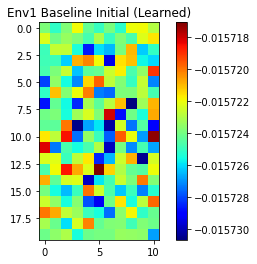

In [99]:
import matplotlib.pyplot as plt
plt.imshow(img_init, cmap='jet')
plt.title("Env1 Baseline Initial (Learned)")
plt.colorbar()
plt.show()

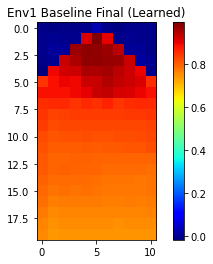

In [100]:
img_final = Network_Qtable(model,env)
plt.imshow(img_final, cmap='jet')
plt.title("Env1 Baseline Final (Learned)")
plt.colorbar()
plt.show()